<h1 style="color:#ffc0cb;font-size:70px;font-family:Georgia;text-align:center;"><strong>Book Recommender System: EDA</strong></h1>

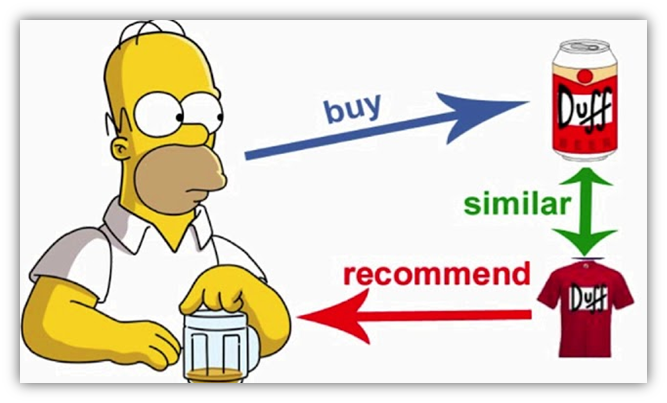

<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 📜 Table of Content</strong></h1>

### 1. [Data Preparation](#1)

1.1 [Introduction](#1.1)

1.2 [Target question for insights](#1.2)

1.3 [Importing Necessary Libraries and datasets](#1.3)

1.4 [Data Retrieving](#1.4)

1.5 [Data Information](#1.5)

<br>

### 2. [Data Cleaning](#2)

2.1 [About This Dataset](#2.1)

2.2 [Data Processing](#2.2)

> - 2.2.1 [Drop duplicate](#2.2.1) 
> - 2.2.2 [Rename columns](#2.2.2)
> - 2.2.3 [Drop columns](#2.2.3)
> - 2.2.4 [Detect the values 0 in Rating dataframe](#2.2.4)

2.3 [Check missing values](#2.3)

> - 2.3.1 [Detect missing values](#2.3.1)
> - 2.3.2 [Impute missing values](#2.3.2)
> - 2.3.3 [Delete missing values](#2.3.3)

2.4 [Upper Case the content](#2.4)

2.5 [Extra-whitespaces](#2.5)

2.6 [Split the location column](#2.6)

2.7 [Check the content](#2.7)

2.8 [Change data type](#2.8)

2.9 [Descriptive statistics for Central Tendency](#2.9)

2.10 [Age Range](#2.10)

2.11 [Merge column](#2.11)
> - 2.11.1 [Merge book and rating](#2.11.1)
> - 2.11.2 [Merge user and rating](#2.11.2)
> - 2.11.3 [Merge user_with_rating and book_with_rating](#2.11.3)

2.12 [Reduce Dimension](#2.12)

2.13 [Save the Intermediate data](#2.13)

<br>

### 3. [Data Exploration (EDA)](#3)

3.1 [Distribution of Rating](#3.1)

3.2 [How old are the users?](#3.2)

3.3 [The 10 country having the highest amount of users](#3.3)

3.4 [When did these books were published](#3.4)

3.5 [Average rating and number of ratings of the most popular books](#3.5)

3.6 [Average rating and number of ratings of the most popular authors](#3.6)

<br>

<a id="1"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 1. Data Preparation</strong></h1>

<a id="1.1"></a>
# ️🎯 1.1 Introduction
****

<p style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black"> 
    Thank to the growth of not only technology but also networking, the e-commercial activities has become more common so does ebook platform. Therefore, the recommender system works effectively in the ebook platform particularly, and the internet in general. There are two main algorithms for the recommender system using machine learning which are Content-based and Collaborative Filtering, nevertheless, their most considerable disadvantages are not capable of generating the recommendation for the new user without having any detail information. Since then, I will also make recommendation base on the popularity of the books. This is just a foundation notebook.
</p>

********

## 📣 What will you get after this notebook?

<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li> A Basic Recommender System using Content-based, Collaborative Filtering and Popularity </li>
    <li> Factors influence on the recommendation </li>
</ul>

<a id="1.2"></a>
# ️🎯 1.2 Target question for insights
****
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Which <span style="color:#122ecc;">Book_Rating </span> is often given?</li>
    <li>Which <span style="color:#122ecc;">Book-Title </span> get the highest rating?</li>
    <li>Which <span style="color:#122ecc;">Country </span> have the highest number of users?</li>
    <li>Which <span style="color:#122ecc;">Age </span> have the highest number of users?</li>
    <li>Is the dataset surfered the <span style="color:#122ecc;">long-tail problem </span>? (I will explain later)</li>
</ul>

<a id="1.3"></a>
# ✴️ 1.3 Importing Necessary Libraries and datasets
****

In [1]:
# Install a conda package in the current Jupyter kernel
import sys
!{sys.executable} -m pip -q install missingno
!{sys.executable} -m pip -q install squarify
!{sys.executable} -m pip -q install geopandas
!{sys.executable} -m pip -q install country_converter
!{sys.executable} -m pip -q install dataprep
!{sys.executable} -m pip -q install recmetrics


# work with data in tabular representation
from datetime import time
import pandas as pd
# round the data in the correlation matrix
import numpy as np
import os
#The pickle is for generate the function later
import pickle
#recmetrics is for plotting the long tail problem
import recmetrics




# Modules for data visualization
import seaborn as sns
# overwrite the style of all the matplotlib graphs
sns.set()
import matplotlib.pyplot as plt


pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

# Ensure that our plots are shown and embedded within the Jupyter notebook itself. Without this command, sometimes plots may show up in pop-up windows
%matplotlib inline

# ignore DeprecationWarning Error Messages
import warnings
warnings.filterwarnings('ignore')


import EDAfunctions as f #This one is for functions in python
from dataprep.clean import validate_country #This one is for splitting


In [2]:
# check the version of the packages
print("Numpy version: ", np.__version__)
print("Pandas version: ",pd.__version__)
! python --version

Numpy version:  1.21.5
Pandas version:  1.3.5
Python 3.9.12


<a id="1.4"></a>
# 📲 1.4 Data Retrieving
***
In order to load data properly, the data in csv file have to be examined carefully. First of all, all the categories are seperated by the "," and strip the extra-whitespaces at the begin by setting "skipinitialspace = True".

> **User Dataset**

In [3]:
## Importing the datasets
user = pd.read_csv("Data/Book-Users.csv", delimiter=';', skipinitialspace = True, encoding='cp1252')

user.columns = user.columns.str.replace(' ', '') #strip the extra-whitespaces out

print("The shape of the ORGINAL data is (row, column):", str(user.shape))

# drop Unnamed, it is just a number given to identify each house
user.head(3)

The shape of the ORGINAL data is (row, column): (278858, 3)


,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN


> **Book Dataset**

In [4]:
## Importing the datasets
book = pd.read_csv("Data/Book_List.csv", delimiter=';', skipinitialspace = True, encoding='cp1252', on_bad_lines='skip')

book.columns = book.columns.str.replace(' ', '') #strip the extra-whitespaces out

print("The shape of the ORGINAL data is (row, column):", str(book.shape))

# drop Unnamed, it is just a number given to identify each house
book.head(3)

The shape of the ORGINAL data is (row, column): (271360, 8)


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...


> **Rating Dataset**

In [5]:
## Importing the datasets
rating = pd.read_csv("Data/Book_Ratings.csv", delimiter=';', skipinitialspace = True, encoding='cp1252', on_bad_lines='skip')

rating.columns = rating.columns.str.replace(' ', '') #strip the extra-whitespaces out

print("The shape of the ORGINAL data is (row, column):", str(rating.shape))

# drop Unnamed, it is just a number given to identify each house
rating.head(3)

The shape of the ORGINAL data is (row, column): (1149780, 3)


,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0


<a id="1.5"></a>
# 🔈 1.5 Data Information
****
Let's take a look in three dataset.
> **Sample Book Dataset**

In [6]:
print ("The shape of the Book data is (row, column):"+ str(book.shape))
print (book.info())

The shape of the Book data is (row, column):(271360, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB
None


### ------------> OBSERVATION
***
From this, the information that I gained from the train dataset are the total paitent record is 271360 with some of the missing values

> **Sample User Dataset**

In [7]:
print ("The shape of the User data is (row, column):"+ str(user.shape))
print (user.info())

The shape of the User data is (row, column):(278858, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB
None


### ------------> OBSERVATION
***
From this, the information that I gained from the train dataset are the total paitent record is 271360 with some of the missing values

> **Sample Rating Dataset**

In [8]:
print ("The shape of the Rating data is (row, column):"+ str(rating.shape))
print (rating.info())

The shape of the Rating data is (row, column):(1149780, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB
None


### ------------> OBSERVATION
***
From this, the information that I gained from the train dataset are the total paitent record is 599 with no missing and it has 11 columns.

<a id="2"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 🧹 2. Data Cleaning</strong></h1>

<a id="2.1"></a>
# 🦄 2.1 About This Dataset
***

<p style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">There are 3 dataset: </p>

<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>User dataset (train.csv)</li>
    <li>Rating dataset (test.csv)</li>
    <li>Book dataset (test.csv)</li>
</ul>

<p style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">Now let's go through the features and describe a little: </p>

***
**Categorical:** 
            
- **Ordinal**(just like nominal datatype but can be ordered or ranked)
   > - **Age** (User age) : this could be numerical and ordinal since it can be ordered
   > - **Book-Rating** (Book Rating) : this could be numerical and ordinal since it can be ordered
   
- **Norminal**(just like nominal datatype but can be ordered or ranked)
   > - **Book-Title** (Book Title)
   > - **Book-Author** (Book Title)
   > - **Publisher** (Publisher)
   > - **Image-URL-S** (Image-URL-S)
   > - **Image-URL-M** (Image-URL-M)
   > - **Image-URL-L** (Image-URL-L)
   > - **User-ID** (Image-URL-L)
   > - **Location** (Location)

   
***
**Numeric:**
- **Discrete**
  >  - **Book-Rating** (Book Rating)
  >  - **Year-Of-Publication** (Book Rating)

<a id="2.2"></a>
# ✂️ 2.2 Data Processing
***

<a id="2.2.1"></a>
## ❌ 2.2.1 Drop duplicate
****

> **Sample User Dataset**

In [9]:
print ("The shape of the data set before dropping duplicated:"+ str(user.shape))

user = user.drop_duplicates()

print ("The shape of the data set after dropping duplicated:"+ str(user.shape))

The shape of the data set before dropping duplicated:(278858, 3)
The shape of the data set after dropping duplicated:(278858, 3)


> **Sample Rating Dataset**

In [10]:
print ("The shape of the data set before dropping duplicated:"+ str(rating.shape))

rating = rating.drop_duplicates()

print ("The shape of the data set after dropping duplicated:"+ str(rating.shape))

The shape of the data set before dropping duplicated:(1149780, 3)
The shape of the data set after dropping duplicated:(1149780, 3)


> **Sample Book Dataset**

In [11]:
print ("The shape of the data set before dropping duplicated:"+ str(book.shape))

book = book.drop_duplicates()

print ("The shape of the data set after dropping duplicated:"+ str(book.shape))

The shape of the data set before dropping duplicated:(271360, 8)
The shape of the data set after dropping duplicated:(271360, 8)


<a id="2.2.2"></a>
## 📌 2.2.2 Rename columns
***

> **Sample user Dataset**

In [12]:
user.rename(columns={"User-ID": "User_ID"}, inplace=True)

> **Sample rating Dataset**

In [13]:
rating.rename(columns={"User-ID": "User_ID", "Book-Rating":"Book_Rating"}, inplace=True)

> **Sample book Dataset**

In [14]:
book.rename(columns={"Book-Title": "Book_Title", "Book-Author": "Book_Author",
                     "Year-Of-Publication":"Publication_year", "Image-URL-S":"Image_URL",
                     "Image-URL-M":"Image_URL_M", "Image-URL-L":"Image_URL_L",
                    }, inplace=True)

<a id="2.2.3"></a>
## 📌 2.2.3 Drop columns
***
I do not want to store all images size for all book, so that I just want to keep the `Image_URL_S` column

In [15]:
book = book.drop(columns=['Image_URL_M', 'Image_URL_L'])

<a id="2.2.4"></a>
## 📌 2.2.4 Detect the values `0` in Rating dataframe
***


In [16]:
rslt_df = rating[(rating['Book_Rating'] == 0)]
print(len(rslt_df)/len(rating) * 100)

62.28226269373272


### ------------> OBSERVATION
***
- Most of the users gave 0 rating point. In the machine learning, when the user do not rate the book, that means the rate values is null. Nevertheless, the machine classifies it as 0 same with the users who gave 0 value. Hence the rating 0 values is recognised as the "implicit" rating which represents an interactive activities that either are positive or negative of the users for a specific item. 

- For the popularity recommender engine, we do not concern about either explicit or implicit feedback.

- For the explicit and implicit rating values we need to deal with them differently. We want to focus to recommend the people have the least implicit feedback and then we would drop all implicit feedback

In [17]:
rslt_df = rating[(rating['Book_Rating'] == 0)]
print(len(rslt_df)/len(rating) * 100)

62.28226269373272


<a id="2.3"></a>
# 👀 2.3 Check missing values 
***

<a id="2.3.1"></a>
## 🔎 2.3.1 Detect missing values 
****

> **Sample user Dataset**

Missing values in the user dataframe in descending: 
       Total  Percent
Age  110762    39.72


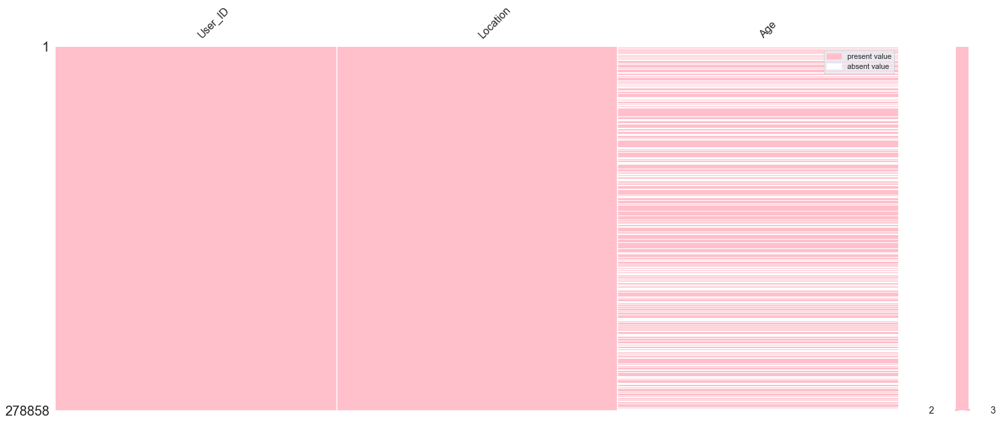

In [18]:
f.draw_missing_plot(user)

### ------------> OBSERVATION
***
The amount of missing values of Age column is considerable, I still want to fill them, since I still want to use both of collaborating filtering and content based.

> **Sample rating Dataset**

Missing values in the user dataframe in descending: 
 Empty DataFrame
Columns: [Total, Percent]
Index: []


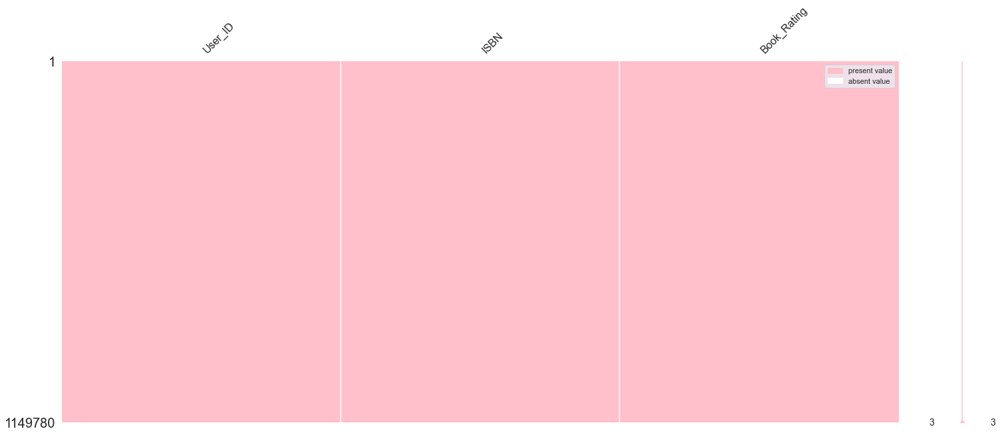

In [19]:
f.draw_missing_plot(rating)

### ------------> OBSERVATION
***
There are no missing values.

> **Sample book Dataset**

Missing values in the user dataframe in descending: 
              Total  Percent
Publisher        2      NaN
Book_Author      1      NaN


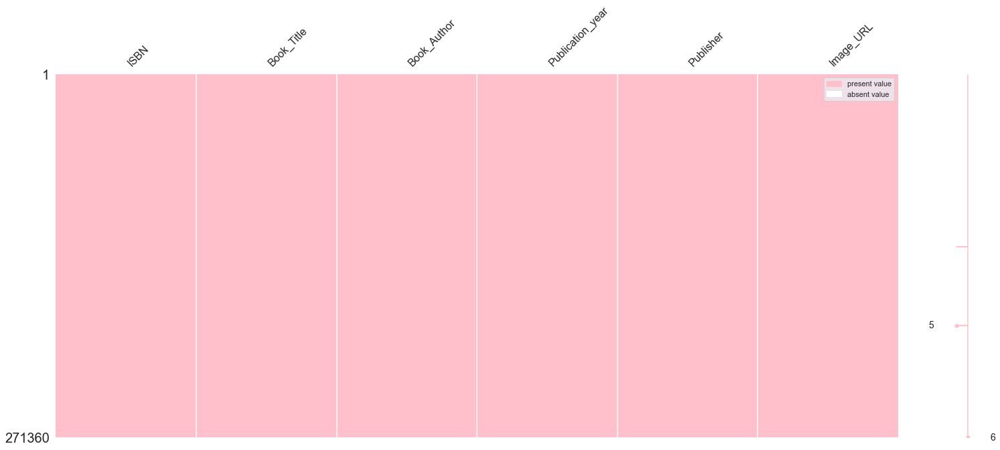

In [20]:
f.draw_missing_plot(book)

### ------------> OBSERVATION
***
There are just 3 three null values I do not want to try to fill them, I will delete them instead since they cannot effect the dataset.

<a id="2.3.2"></a>
## 🔎 2.3.2 Impute missing values 
****

> **Sample user Dataset**

In [21]:
user['Age'].fillna(int(user['Age'].mean()), inplace=True)

<a id="2.3.3"></a>
## 🔎 2.3.3 Delete missing values 
****

In [22]:
book = book.dropna(axis = 0, how ='any')

<a id="2.4"></a>
# 💭 2.4 Upper Case the content
****

> **Sample Book Dataset**

In [23]:
# # # Cast all values inside the dataframe (except the columns' name) into upper case.
# book = book.applymap(lambda s: s.upper() if type(s) == str else s)
# book.head(3)

> **Sample User Dataset**

In [24]:
# # # Cast all values inside the dataframe (except the columns' name) into upper case.
# user = user.applymap(lambda s: s.upper() if type(s) == str else s)
# user.head(3)

> **Sample Rating Dataset**

In [25]:
# # # Cast all values inside the dataframe (except the columns' name) into upper case.
# rating = rating.applymap(lambda s: s.upper() if type(s) == str else s)
# rating.head(3)

<a id="2.5"></a>
# 💭 2.5 Extra-whitespaces
****

In [26]:
# remove all the extra whitespace
f.whitespace_remover(user)
f.whitespace_remover(rating)

<a id="2.6"></a>
# 💭 2.6 Split the location column
****

In [27]:
# #Expand columns:
user_location_expanded = user.Location.str.split(',', 2, expand=True)
user_location_expanded.columns = ['City', 'State', 'Country']
user = user.join(user_location_expanded)
#Drop column Location:
user.drop(columns=['Location', 'City', 'State'], inplace=True)
user = user.dropna(axis = 0, how ='any')

user.head()

,User_ID,Age,Country
0,1,34.0,usa
1,2,18.0,usa
2,3,34.0,russia
3,4,17.0,portugal
4,5,34.0,united kingdom


## Recheck

In [28]:
f.check_content(user, 'Country')

 usa
 canada
 united kingdom
 germany
 spain
 australia
 italy

 france
 portugal
 new zealand
 netherlands
 switzerland
 brazil
 china
 sweden
 india
 austria
 malaysia
 argentina
 singapore
 finland
 belgium
 mexico
 denmark
 ireland
 philippines
 turkey
 poland
 pakistan
 greece
 iran
 romania
 chile
 israel
 south africa
 indonesia
 norway
 japan
 croatia
 south korea
 slovakia
 nigeria
 czech republic
 russia
 yugoslavia
 hong kong
 taiwan
 costa rica
 england, united kingdom
 slovenia
 peru
 vietnam
 venezuela
 egypt
 bulgaria
 colombia
 spain"
 luxembourg
 hungary
 thailand
 ghana
 portugal"
 saudi arabia
 españa
 united arab emirates
 california, usa
 bosnia and herzegovina
 sri lanka
 denmark"
 iceland
 sweden"
 paraguay
 guatemala
 bangladesh
 andorra
 lithuania
 ukraine
 latvia
 bolivia
 bahamas
 new york, usa
 texas, usa
 jamaica
 ecuador
 british columbia, canada
 lebanon
 panama
 cuba
 kuwait
 la france
 morocco
 malta
 france"
 scotland
 trinidad and tobago
 albania
 l`i

### ------------> OBSERVATION
***
There are some of the error in the `Country` columns. I realise this column is the name of the columns so I want to use the library `dataprep` and use `validate_country()` function to check the country name.

In [29]:
error_country = user['Country'][~validate_country(user['Country'])]

print("The percent that countries have error: " +str(len(error_country)/ len(user) * 100))

The percent that countries have error: 2.8007286915110305


### ------------> OBSERVATION
***
Since the percentage is small so I want to drop them.

In [30]:
user.loc[user['Country'].isin(error_country), 'Country'] = 'NA'
user.drop(user[user['Country'].isin(['NA'])].index, inplace = True)

## Strip some of the extra whitespaces in `Country`

In [31]:
user['Country'] = user['Country'].str.strip()
empty_string_country = user[user.Country == ''].Country.count()
nan_country = user.Country.isnull().sum()
print(f'There are {empty_string_country} entries with empty strings, and {nan_country} NaN entries in the Country field')
user.drop(user[user['Country'].isin([''])].index, inplace = True)

There are 0 entries with empty strings, and 0 NaN entries in the Country field


<a id="2.7"></a>
# ️🎧 2.7 Check the content:
****

> **Sample Book Dataset**

In [32]:
f.check_content(book, 'Book_Title')

Selected Poems
Little Women
Wuthering Heights
Adventures of Huckleberry Finn
The Secret Garden
Dracula
Jane Eyre
The Night Before Christmas
Pride and Prejudice
Great Expectations
Masquerade
Frankenstein
Black Beauty
The Gift
Beloved
Emma
Nemesis
Journey
Illusions
The Secret
The Wedding
Fahrenheit 451
Psychology
Legacy
Robinson Crusoe
Carrie
Dinosaurs
The Hobbit
Best Friends
Hannibal
Sacrifice
The Wind in the Willows
Sense and Sensibility
Phonics Fun: Reading Program, Pack 4 (Clifford the Big Red Dog)
Heidi
Dreamcatcher
The Promise
Matilda
Secrets
King Lear
Ashes to Ashes
Homecoming
The Edge
Mirage
The Two Towers (The Lord of the Rings, Part 2)
Peter Pan
Paradise
When the Wind Blows
Sisters
Cinderella
Madame Bovary
Eye of the Beholder
Angel
Promises
The Velveteen Rabbit
The Return of the King (The Lord of the Rings, Part 3)
Whispers
Lolita
Dolores Claiborne
Anne of Green Gables
On the Road
Animal Farm
Bittersweet
Payback
Macbeth
Anna Karenina
Titan
Sanctuary
Hamlet
Fall from Grace
Flesh

Kane and Abel
Blood Games
Black Light
Insomnia
Prized Possessions
The Immortals
Thicker Than Water
The Mummy Case
Haunted
Scarlet Feather
Mirror, Mirror
The Switch
In the Heart of the Sea: The Tragedy of the Whaleship Essex
Stargirl
Last Orders
Hideaway
Revelation
The Dead Zone
War Story
Eminence
Forget Me Not
Crowned Heads
The House That Jack Built
No Safe Place
Danse Macabre
The Game
Trouble
Complete Works of William Shakespeare
Desperation
From the Mixed-Up Files of Mrs. Basil E. Frankweiler
This Present Darkness
Southern Nights
The Cave
Die for Love
Riding the Rap
Black House
Under Pressure
Mexico
Night
The Prophet
The Trumpet of the Swan
The Forest House
MY SWEET AUDRINA
Grave Mistake
Dead Reckoning
Uncle Tom's Cabin
Mischief
The Haunting
Another Roadside Attraction
Redwall (Redwall, Book 1)
Bingo
Awakening
All Around the Town
Neanderthal
Deadline
Rats
The Reckoning
Three Wishes
Halfway Home
Tess of the Durbervilles
The Great Train Robbery
Snow White and the Seven Dwarfs
Desperate

Orphan Star
Day of the Jackal
Home Again
Heaven and Hell
Once in a Lifetime
Dying Inside
The Last Precinct
September
Amnesia
Practical Magic
American Dreams
The Bell Jar
Roses Are Red
Snapshots
Dead Zone
Pirates
Rules of Engagement
Naked Prey
Moonstone
Plum Island
Crossing the Threshold of Hope
Red Pony
The Tailor of Panama
The Regulators
All the President's Men
A Walk Across America
Julie of the Wolves
Up a Road Slowly
The Beast
Blood Sport
A Separate Peace
The Quick and the Dead
High Stakes
Lady of the Forest
Storm Warning
A Theory of Relativity
Nightwatch
Lady Oracle
The Ghost
Voice of the Heart
Otherwise Known As Sheila the Great
Domino
If Looks Could Kill
Sweet Dreams
The Very Hungry Caterpillar
The Other Side of Midnight
Into the Woods
Cutting Edge
Planet of the Apes
Backfire
Angel of Death
Evening Class
Comes the Blind Fury
Blast from the Past
Briar Rose
Field of Thirteen
Vespers
Vortex
Glory Road
Tailchaser's Song
Time and Time Again
The Halloween Tree
Snow White
Dream Park
Dou

Fantastic Voyage
Ella Enchanted
The Perfect Gentleman
No Promises in the Wind
El Club Dumas
Timeless Passion
Elementary Statistics
The Beekeeper's Apprentice
Love Story
The Pilgrim's Progress
Fictions
General Chemistry
Paradiso
Dear Lovey Hart, I Am Desperate
Love You Forever
Society: The Basics
Out of Season
False Scent
The Outsiders
Sophie's World: A Novel About the History of Philosophy
Silence of the Lambs
Born Free: A Lioness of Two Worlds
Use Your Head
The Thorn Birds
The Anubis Gates
Islam
Just Desserts
Extreme Measures
Murder on Capitol Hill
Golden Unicorn
The Blithedale Romance
Dress Gray
Q
Carry Me Home
Boundaries
Ghosts Beneath Our Feet
The Rise and Fall of the Great Powers: Economic Change and Military Conflict from 1500 to 2000
The Missing World: A Novel
Buddies
Oldest Living Confederate Widow Tells All
Das Druidentor.
The Long Night of White Chickens
Tomorrow File
Soul Stories
Growing Pains
L.A. Requiem
Going on Sixteen
Pentimento
God Bless America
Skin Tight
Beneath the 

Leaving Cheyenne
The Millionaire Next Door: The Surprising Secrets of America's Wealthy
Titanic
Just Wait Till You Have Children of Your Own
Coroner
Quentins
Unicorns
Escape Velocity
Monkeewrench
Sacred Ground
Magical Child
Perennials
The Deep End
From This Day
Humans
Enchantress
Utah Blaine
Family Affair
The Lion's Share
Trainspotting
101 Dalmatians
The Gamble
Where Is God When It Hurts?
Summer of the Dragon
Everyone Is Entitled to My Opinion
Too Much Too Soon
Indian Summer
Silent Treatment
The Forsyte Saga (Penguin Modern Classics)
Myths to Live by
Dream Thief
The Charm School
The Glitter Dome
Not Even for Love
DR. SPOCK'S BABY AND CHILD CARE
Dear Stranger
Callahan's Crosstime Saloon
Time Travelers Strictly Cash
Jumanji
Slugs
Head Games
Rebellion
American Government: Readings and Cases
Dictionary of Omens and Superstitions
Glamorama
Angel Landing
Enchantress Mine
City of Illusions
Teacher's Pet
Where There's a Will
The Complete Book of Breastfeeding
This Heart of Mine
Literature: Rea

The General
Elidor
The Owl Service
Noble House: A Novel of Contemporary Hong Kong
Modern Baptists
Midnight Runner
Robots and Empire
Cold Heart
Murder in the Family
Tesla: Man Out of Time
The Consul's File
Timbuktu
The Travelling Hornplayer
Le Petit Chose
Any Woman's Blues
Lily White
L'Assommoir
Jamaica Inn
The Mugger
Sex and the City
Mossflower (Redwall, Book 2)
Bogart
Final Target
Yerma
Nimm dich in acht.
Embraced by the Light
Making Waves
The Heat Seekers
The Last Gentleman
Shanghai Baby
Bitter Medicine
Georgie
The Day Jimmy's Boa Ate the Wash
SEEDS OF YESTERDY (Dollanger Saga (Paperback))
Children of the Lion
The Summoning
Hand to Mouth: A Chronicle of Early Failure
The Natural: The Misunderstood Presidency of Bill Clinton
Implant
For Kicks
Christmas Magic
Hunted
And The Angels Were Silent
Girl With a Pearl Earring
Dianetics
For Each Other: Sharing Sexual Intimacy
Strip Tease
The Legend
Legends of the Fall
Black Horses for the King
Safe Harbour
Tell Me a Riddle
Personal History
Dond

Rainbow Mars
Sweet William: A Memoir of Old Horse
Brotherhood of War 03: The Majors, the
Living Alone and Liking It
Lonesome Road
The End of War: A Novel of the Race for Berlin
Why Am I Afraid to Tell You Who I Am?
The Secret of Sanctuary Island
The Worthing Saga
Die Krone der Welt.
Early from the Dance
Tao Te Ching: The Definitive Edition
Surprise Party
Abide With Me: A Novel (Abide with Me)
Piggy in the Middle
Thirsty
Adventures in Porkland: How Washington Wastes Your Money and Why They Won't Stop
The Simeon Chamber
River of Passion
Plant Dreaming Deep
Georgiana
In This Sign
Claudia and the New Girl (Baby-Sitters Club (Paperback))
The Lady in the Loch
Kristy and the Walking Disaster (Baby-Sitters Club (Paperback))
Mary Anne and the Search for Tigger (Baby-Sitters Club, 25)
The Haunting of Suzanna Blackwell
Malka
Blood Run
The Standoff
Paradise Found
For Special Services
The Lost Daughters of China: Abandoned Girls, Their Journey to America, and the Search for a Missing Past
The Dark 

The Last Days of America
The Best Is Yet to Come
Amaryllis Night and Day
A Cup of Light
Open Secrets: Stories
Southern by the Grace of God
Agatha Raisin and the Day the Floods Came (An Agatha Raisin Mystery)
Foreigner
One Bird
Ride the Thunder
Anastasia on Her Own
Cutting: Understanding and Overcoming Self-Mutilation
The Chinese in America: A Narrative History
A Cat's Little Instruction Book
The Narrative of Arthur Gordon Pym of Nantucket (Penguin Classics)
The Lives of John Lennon
CRACK COSMIC EGG
The Mark: The Beast Rules the World (Left Behind #8)
Hotel of the Saints
Oyster Blues : A Novel
The Colossus and Other Poems
Karen's Little Sister (Baby-Sitters Little Sister, 6)
Mama Flora's Family
Bone People
Flat Lake in Winter
Lake in the Clouds
Secret for a Nightingale
Deaf Like Me
Anastasia Has the Answers
A Moveable Feast
The Beloved Land (Song of Acadia, 5)
The Warrior's Tale
Name Withheld: A J.P. Beaumont Mystery
Mum's the Word
First Lady from Plains
Words by Heart
O Pioneers!
Blue 

Close to Home
Slaves of New York
Gift of Fire
Taken by Storm
Murasaki
Scientology: The Fundamentals of Thought
Hawksmoor
Green Calder Grass
The Ayn Rand lexicon: Objectivism from A to Z
The Lure
Couldn't Keep It to Myself: Testimonies from Our Imprisoned Sisters
Rio Grande Fall
The Fourth Perimeter
Deadly Grace
Belle Pruitt
Garfield Sits Around the House
The Midnight Hour
Othello (The New Cambridge Shakespeare)
Toward Amnesia
Encyclopedia Brown Keeps the Peace (Encyclopedia Brown (Paperback))
The Dark Romance of Dian Fossey
The Second Lady
The Searching Hearts
Murder Most Irish
Intent to Harm
The House at Old Vine
Swimming Toward the Ocean
Till Death
Gypsyworld
Kahless (Star Trek: The Next Generation)
Voyage from Yesteryear
Native Speaker
Hard Times (Bantam Classics)
The Druids
A Border Passage: From Cairo to America-A Woman's Journey
Patterns of Love
The Power of Myth
Three Stories You Can Read to Your Dog
Moby Dick (Great Illustrated Classics)
Nap Time: The True Story of Sexual Abuse

Afterlife
Colin Powell: Soldier/Statesman Statesman/Soldier
Spree
A Bed by the Window: A Novel of Mystery and Redemption
Sacajawea
White Apples
A Woman's Book of Life: The Biology, Psychology, and Spirituality of the Feminine Life Cycle
Isabel's Bed
A Sniper in the Tower: The Charles Whitman Murders
Valentine
Dare Truth or Promise
Catfish: My Life in Baseball
Dave at Night
Strength of Stones
Star Diaries
Here and Hereafter
Before the Wind: The Memoir of an American Sea Captain, 1808-1833
Velvet Whispers
The Unabridged Edgar Allan Poe
Smart Exercise: Burning Fat, Getting Fit
The Laws of Our Fathers
Moonlight and Shadow
WIFEY
A Game for Heroes
Losing Julia
The Sport of Queens: The Autobiography of Dick Francis
James Herriot's Favorite Dog Stories
The Daydreamer
The Fortunate Pilgrim
Julian's House
The Norton Anthology of English Literature: The Major Authors
Black Hearts in Battersea
New America
The Torture Garden
Natural Acts: A Sidelong View of Science and Nature
Arthur's Halloween (Ar

South Pacific
Women as mothers
Inventing Memory: A Novel of Mothers and Daughters
Herald of Joy
A Place to Call Home
The Peter Lawford Story: Life With the Kennedys, Monroe and the Rat Pack
Coyotes and Town Dogs: Earth First! and the Environmental Movement
Maybe (Maybe Not): Second Thoughts from a Secret Life
Emerald Ecstasy
If You Leave Me, Can I Come Too?
The Window at the White Cat
The Green King
First, You Cry
Stone of Tears (Sword of Truth, Book 2)
War of the Twins (Dragonlance Legends, Vol. 2)
Desolation Angels
Powers of the Mind
Against the Odds
Le Salaire De La Peur
Sweet Valley High #03: Playing with Fire (Sweet Valley High (Numbered Paperback))
The Boggart
The Fear Place
The Master Puppeteer
Dream Lover
Looking for Love
Der Club Dumas.
Sweet Valley High #02: Secrets (Sweet Valley High (Numbered Paperback))
The Girl Who Wanted a Boy
In the Spirit of Crazy Horse
Sweet Valley High #01: Double Love (Sweet Valley High (Numbered Paperback))
The Missing Chapter: A Nero Wolfe Mystery

This Loving Land
Nothing Sacred
Sorrowheart
The Message of the Sphinx: A Quest for the Hidden Legacy of Mankind
Testament
The Lost Years (Star Trek)
Psalms Now
Geography
Chicago Girls
Chasm City
The Icky Sticky Frog
The Snoring Cure: Simple Steps to Getting a Good Night's Sleep
Dance Hall of the Dead
Pig
The Food Pharmacy: Dramatic New Evidence That Food Is Your Best Medicine
Ripples
A Certain Magic
The Force
Love, etc.
Auf dÃ?Â¼nnem Eis.
Running man
Die Totenglocke.
The Sand Child
The Cloud Atlas
Briarpatch
Hummer zum Dinner.
Parts
Writ in Blood: A Novel of Saint-Germain
Shrine
Eternity's End
Angelmass
Die Seherin von Knossos.
Mystery on the Isle of Skye
Rescue Me
The Levant Trilogy
36 Views of Mount Fuji: On Finding Myself in Japan
The MYSTERY OF SWORDFISH REEF
N-Space
Monkey King
The Devil Rides Out
Redshift: Extreme Visions of Speculative Fiction
Gridlock
Der seltene Vogel.
GRAND PASSION
Murder in Manhattan
The Robots of Dawn
Garbo
30 Days to Experiencing Spiritual Breakthroughs
St

Rock Hudson: His Story
Here to Eternity
The Big Kiss
Telling
Somewhere South of Here: A Novel
Birthday Letters
Prentice-Hall handbook for writers
Guns Up
Floyd on Fish
Gardening Year
Chill Factor
Mein New York.
The El Dorado Adventure
The Inland Sea
Lettin It All Hang Out: An Autobiography
El Plan Infinito
Within Reach
They Do It With Mirrors (Miss Marple Mysteries (Paperback))
Hitler
Women on Top
Backstage Passes: Life on the Wild Side With David Bowie
Skin Deep, Blood Red
Lloyd George
Wheels
The Creative Spirit
Personal Fouls
The Skin I'm in
Yurth Burden
Cause For Alarm
The Wreck of the Mary Deare
The Way We Really Are: Coming to Terms With America's Changing Families
Arrest Sitting Bull
El Proceso
Jade Lady Burning
The Story About Ping
American Rhapsody
Please Don't Shoot My Dog: The Autobiography of Jackie Cooper
The Rotation Diet
If He Hollers Let Him Go
How to Write
The Wages of Fame
Dead Simple
Going to Extremes
Sewing for Dummies
Slow Hands
The Art of Sexual Magic
How to write 

Psycho-Cybernetics
The Fifth Elephant: A Novel of Discworld
Old Boys
Le Seigneur des Anneaux, tome 1 : La CommunautÃ?Â© de l'Anneau
Violation
Everyday Enlightenment : The Twelve Gateways to Personal Growth
Kingdoms of Light
The Bestseller
The Sea Shall Embrace Them: The Tragic Story of the Steamship Arctic
Turn Homeward, Hannalee
A Kind of Grace : The Autobiography of the World's Greatest Female Athlete
Never to Forget: The Jews of the Holocaust
And I Alone Survived
Cereus Blooms at Night
Watchmen
Buried at Sea
Gone Wild
Too Beautiful to Die
Painkiller
California's over
Economic Issues for Consumers
DEEP SIX
Spear of Heaven
Lucy: A Novel
The Turn of the Screw
Interior Design With Feng Shui
Gallows Thief
Mona In the Promised Land
Red: Passion and Patience in the Desert
Learn to Relax : A Practical Guide to Easing Tension and Conquering Stress
Secret Missions
A Suitable Vengeance
Contract on America: The Mafia Murder of President John F. Kennedy
A Woman Betrayed
Lonely Planet Travel With

Brightness Falls from the Air
Adrift
The Last Valentine
Memoirs of a Dutiful Daughter
Home Front
Widow'S Little Secret (Harlequin Historical Series, No. 571)
A Cry in the Night
Faces at the Bottom of the Well: The Permanence of Racism
Bildung. Alles, was man wissen muÃ?Â?.
Appointed to Die
The Christmas Wish
Le Horla
The Antipope
Angel of Light: A Personal Journey Through Imagination to Find the Spirit
Chicago's Best-Kept Secrets
A Dead Man Out of Mind
Coffins
Candide (Penguin Popular Classics)
Outlands: Journeys to the Outer Edges of Cape Cod
Dream Science
Leadership Jazz
Another Country: Navigating the Emotional Terrain of Our Elders
A Language Older Than Words
Superwoman
Endangered Pleasures: In Defense of Naps, Bacon, Martinis, Profanity, and Other Indulgences
Shake Hands Forever
Point Deception
Racconti
Bird of Paradise
Soldier of Light
The Ragamuffin Gospel
Ghost Light
Hanta Yo
No Night Without Stars
Encyclopedia of Healing Therapies
Afterglow
Caress and Conquer
Necroscope: Aveng

Hammer
Aramaya
The Only Boy for Me
The Godmother's Web
Gramercy Park
BLACK MOON
The Well Cat Book: The Classic Comprehensive Handbook of Cat Care
Virgin Heat: A Novel
July's People
Paperback Writer
The Falls
Public Secrets
The Discovery of Chocolate
The Good Terrorist
Clara Callan : A Novel
The Night Watch
El Diccionario de Lempriere
The Independent Bride  (The Wedding Challenge)
Frost of Heaven
Le Monde de Sophie
Jane Fonda's Workout Book
Murder in Foggy Bottom (Truman, Margaret, Capital Crimes Series.)
As the Waltz Was Ending
A Supposedly Fun Thing I'll Never Do Again : Essays and Arguments Tag: Author of Infinite Jest
Wild Thorn
Midnight Blue
Ancient of Days
The Sisterhood
Crush Depth
Inventing Memory
Die Tibeterin.
The Way We Never Were: American Families and the Nostalgia Trap
The Bride and the Beast
San Manuel Bueno, Martir
Smart Vs. Pretty
Dancing on the Edge
As You Like It (The Arden Shakespeare)
Getting Mother's Body : A Novel
Sparks of Genius: The Thirteen Thinking Tools of t

The Camino : A Journey of the Spirit
The Power of Logical Thinking: Easy Lessons in the Art of Reasoning...and Hard Facts About Its Absence in Our Lives
Death du Jour
Something Dangerous
Life After Life
Kushiel's Chosen (Kushiel's Legacy)
Selected Tales (World's Classics)
Angel in Marble
The Practical Heart: Four Novellas
A Storm of Swords (A Song of Ice and Fire, Book 3)
Genius: The Life and Science of Richard Feynman
Jews Without Money
Small Talk (Minipops)
The Writer's quotation book: A literary companion
Como Una Novela
The President
Die Verzauberung der Lily Dahl.
Star Dreams
Mage Heart
Gap Creek: The Story of a Marriage
National Audubon Society North American Birdfeeder Handbook
Forever and Five Days
Prince of Time
Ruling Passions
Outback Station
Migrations to Solitude
Contacto
Live Girls
Countess Veronica
Complications: A Surgeon's Notes on an Imperfect Science
The Pig Plantagenet
Inventing the Victorians
Scarne on Cards
The Lazy Man's Guide to Enlightenment
Lunch
Bad Girl Creek

Slight Mourning
A Question of Guilt
The Singing Stone
The Enemy Within
Microwave Gourmet
Promise Me Tomorrow
Substitute Teaching: A Handbook for Hassle-Free Subbing
Cent Ans De Solitude
Smart Mobs: The Next Social Revolution
Promise Me Today
MIDSUMMER NIGHT'S DREAM
Murder on the Gravy Train
The Ten Thousand
If My Love Could Hold You
Skinny Legs and All
The Cold War Swap
Savage Spring
Savage Autumn
High Maintenance
Dai-Sho
The Last Jew
Moontide Embrace
Love Beyond Reason
Mosquito
Falling Bodies
The Devil's Delilah
Suspicion of Deceit
Was soll das alles? Gedanken eines Physikers.
Introducing Psychology
Laughing Man
Hong Kong
A Secret Affair
Unconquered
Hang a Thousand Trees with Ribbons: The Story of Phillis Wheatley
One Snowy Night
A Is for AARRGH!
Wolves at Our Door : The Extraordinary Story of the Couple Who Lived with Wolves
Journal of a Solitude
I Brake for Bad Boys
My Blue Notebooks
Murder at the Spa
The Flame and the Flower
Why Not Me?: The Inside Story of the Making and Unmaking 

Chance Of A Lifetime
We Are Our Mothers' Daughters
Suspicion of Guilt
Jolie Blon's Bounce
Mistress of Justice
Last Rites
Kitchen Privileges : A Memoir
Daughters of the Moon
Sweet Valley High #04: Power Play (Sweet Valley High (Numbered Paperback))
Beat Until Stiff
Appointment for Murder
Year of the Fires: The Story of the Great Fires of 1910
MoveOn's 50 Ways to Love Your Country: How to Find Your Political Voice and Become a Catalyst for Change
No Love Lost
Imagineering: How to Profit from Your Creative Powers
Reality Check
Anne of Avonlea (Anne of Green Gables Novels (Paperback))
By Dawn's Early Light: A Novel
Uh-Oh: Some Observations from Both Sides of the Refrigerator Door
The Innocence of Father Brown
Turbulence
A Little Too Much Is Enough
Utterly Yours, Booker Jones
It Was on Fire When I Lay Down on It
Scaramouche: A Romance of the French Revolution
Hourglass
All I Really Need to Know I Learned in Kindergarten: Uncommon Thoughts on Common Things
Affluenza: The All-Consuming Epidem

The Fifties
The Devil Wears Prada
Life Penalty
Oh, wie schÃ?Â¶n ist Panama
Ipcress File
Paul Revere's Ride
Royal Assassin (The Farseer Trilogy, Book 2)
The Rules of Attraction
Host Family
Crime and Punishment (Penguin Classics)
Awakening to the Sacred: Creating a Spiritual Life from Scratch
Blood Roses: A Novel of Saint-Germain
Calculating God
Mirabile
Where's My Teddy?
Mr. Spaceman
Phoenix
Like People in History
Castleview
What Is This Thing Called Science: An Assessment of the Nature and Status of Science and Its Methods
Reap
History of Danish Dreams
Manufacturing Consent: The Political Economy of the Mass Media
Homeward
Ich schenk Dir meinen Mann.
Child X
Black Swan, White Raven
Disgrace
Cosmic Wormholes: The Search for Interstellar Shortcuts
Communion Blood: A Novel of Saint-Germain
Vector
Mansions of Darkness: A Novel of Saint-Germain
Disney's Mulan
The Forever Kiss
The Black Tulip
The Last Madam: A Life in the New Orleans Underworld
One Better
Boy's Life
Jane Brody's Cold and Flu

Firelord
Hawken'S Wife (Harlequin Historicals, No. 450)
The National Gallery of Art, Washington (Concise Edition)
Minor Indiscretions
Martin Chuzzlewit (Penguin Popular Classics)
Conceptual Selling
Charles: The Untold Story
Stranger to the Sun (Angel)
Sd 57: On Her Own
The Self-Completing Tree: Selected Poems
Magnetic Therapy: Healing in Your Hands
Death on Site
Berenstain Bears Not So Buried Treasures (Happy House Book)
The Powers That Be
Microsoft PowerPoint 2000 - Illustrated Brief
Dientes Blancos
Diary of a Left-Handed Birdwatcher
Midnight Dancer
I Can Read About Frogs and Toads (I Can Read About)
POLLY (Candlelight Edwardian Special)
Les copains
Die Pandemia- Saga III. Das Meer der Leiden. Fantasy- Roman.
How Much Joy Can You Stand?: How to Push Past Your Fears and Create Your Dreams
Locked in Time
Microsoft Office XP New Features Guide: Office 2000 To XP Changes
MÃ?Â©moire vagabonde
When Surface Was Depth: Death by Cappuccino and Other Reflections on Music and Culture in the 1990

Beyond the Foothills (Harlequin Romances)
Psychic
Dangerous Illusions (Harlequin Intrigue, No 55)
One Flew over the Cuckoo's Nest (Penguin Great Books of the 20th Century)
La Rencontre
Shadowrun. Die AttentÃ?Â¤terin. Vierzehnter Band des Shadowrun- Zyklus.
Choice Of A Lifetime (Harlequin Superromance, No 411)
The Tender Leaves (Harlequin Romance)
Tant qu'il y aura des rhinocÃ?Â©ros
Yugoslavia: Death of a Nation
Relative Strangers (Harlequin Romance, No 2861)
Candyman
La Chasse aux canards
Staying Close
Shadowrun. JÃ?Â¤ger und Gejagte.
Le cantique des quantiques: Le monde existe-t-il? (Sciences et sociÃ©tÃ©)
Die unsichtbare Flotte.
Boomerang
Hard To Handle (Harlequin Romance)
Der Spiegelmacher. Der Fluch des Kopernikus. Zwei Romane in einem Band.
Silent Partner (Harlequin Intrigue, No 47)
Miss Manners' Guide to Excruiatingly Correct Behavior
Un territoire pour l'homme (Collection Monde en cours. SÃ©rie Territoires et sociÃ©tÃ©)
Dead Fix
Perdu!
Red Rosa
The Turquoise Mountain: Brian Bles

Le chemin le moins frÃ?Â©quentÃ?Â© - apprendre Ã?Â  vivre avec la vie
No Winner (Harlequin Presents, No 1096)
Art and Anarchy
Takeover (Harlequin Presents, No 1161)
Ipso facto
Sports Illustrated For Kids: 365 Amazing Days in Sports
Champion du monde
Tota Rosa
Bleeding Dodger Blue: A Duffy House Mystery
Questions Are the Answers
Je vais bien, ne t'en fais pas
The Pearls of Sharah III: Leah's Story (Loveswept, No 330)
PÃ?Â©pÃ?Â¨re et l'omnibus
What Are Your Goals: Powerful Questions to Discover What You Want Out of Life
Pink Phaeton
Dare to Dream and Work to Win
Reluctant Prisoner (Harlequin Presents, No 1098)
New Windmills: Paddy Clarke Ha! Ha! Ha! (New Windmills)
Buffy the Vampire Slayer: Remaining Sunlight
The Golfer and the Millionaire: It's About Having the Drive to Succeed
Hidden Depths (Harlequin Romance, No 2884)
Glamour Guide to Hair
Weight Watchers Fast and Fabulous Cookbook
Manifesto for a New Medicine: Your Guide to Healing Partnerships and the Wise Use of Alternative Therapi

Ashenden oder Der britische Geheimagent. ErzÃ?Â¤hlungen.
The Little Mermaid (Disney's the Little Mermaid)
Only Solution (Harlequin Romance, No 3337)
Making Peace With the Land: Designing Israel's Landscape
Sams Teach Yourself Visual Basic 6 in 24 Hours (Sams Teach Yourself in 24 Hours)
Sleep, our unknown life
The  Matzah That Papa Brought Home (Passover Titles)
Moving House (First Experiences)
ANASTASIA SYNDROME (EXPORT)
Hocus Pocus : Junior Novelization (Junior Novel Series)
Fast ein Heiliger.
Miramar.
You'll Soon Grow into Them, Titch
Herbst der ChimÃ?Â¤ren. Dritter Band der Commissaire- Llob- Trilogie.
The memoirs of a survivor
Later, Rover (Puffin Easy-To-Read)
The Princess Who Lost Her Hair: An Akamba Legend (Legends of the World)
The Dante Club
Healthy Habits: 20 Simple Ways to Improve Your Health
Fieber.
Murder and the First Lady (An Eleanor Roosevelt Mystery)
Concise Guide to Microsoft Windows 3.1
The Book For People Who Do Too Much
Don't Forget the Bacon!
The Deus Machine: A N

Today's Been a Helluva Week
EsthÃ?Â©tique du pÃ?Â´le Nord
Whose Life Is It Anyway?
COOKING WITH COFFEE
Portland Best Places: A Discriminating Guide to Portlands Restaurants Lodgings Shopping Nightlife Arts Sights and Outings (Best Places Portland)
Die Kraft Der Liebe (Fiction, Poetry and Drama)
Tristesse et BeautÃ?Â©
Mille femmes blanches : Les carnets de May Dodd
The Eligible Miss Elliot (Zebra Regency Romance)
How to Pack
Lysistrata (Signet Classics (Paperback))
Letting Go of Disappointments and Painful Losses (Letting Go)
The Yeats Companion
Martian Time-Slip
Le tour d'Ã?Â©crou
Dr. Erika Werner
La ville et les chiens
Faith without fantasy
Los Alamos
El Caos Omega/the Osterman Weekend
El Desafio De Matlock/the Matlock Paper
Say Yes to Life: Daily Meditations
Have You Hugged a Monster Today: How to Win Friends and Lose Fiends
Agenten kennen kein Pardon: Roman (Heyne-BÃ¼cher ; Nr. 999)
Ames masquÃ?Â©es : la noce
El Dilema
Lys Dans LA VallÂ©E
Pantaleon Et Les Visiteuses
L'Arbre de NoÃ?Â

Wake Me at Midnight
Humbug
Islam: A Concise Introduction
Footprint West Coast Australia Handbook (Footprint West Coast Australia Handbook)
The Snow Lion's Turquoise Mane : Wisdom Tales from Tibet
A Writer's House in Wales (National Geographic Directions)
Lonely Planet Europe on a Shoestring (Lonely Planet Europe on a Shoestring)
Fight Back and Win: How to Work With Business and Get What You Want
For Those With Little Dust: Selected Writings of Arthur Osborne (Insights on the Quest Ser)
Science, Order, and Creativity
Transcending Madness : The Experience of the Six Bardos (Dharma Ocean Series)
ROMANCE INC : ROMANCE INC
Go: A Novel (Classic Reprint)
Reinventing Political Science: A Feminist Approach
Living the Mindful Life
A Family Secret (Silhouette Special Edition)
Stardust: /David Bow/
Tibetan Buddhism in Western Perspective
Islands in the sky (Puffin books)
La mort n'oublie personne
Resumes for better jobs
Radiohead: From a Great Height
The Temple: Its Ministry and Services, Updated 

More Naughty Little Sister Stories
Revolutionizing Motherhood: The Mothers of the Plaza De Mayo (Latin American Silhouettes)
More African adventures (Stubby stories)
I Can't Believe It's Yoga For Pregnancy and After
The Feast of July
Where's Harry?: Steve Stone Remembers His Years With Harry Caray
Reflections on a Gift of Watermelon Pickle...: And Other Modern Verse
Desperate
Thoughts From the Seat of the Soul : Meditations for Souls in Process
Play With Fire (A Kate Shugak Mystery)
Serendipity: Accidental Discoveries in Science (Wiley Science Edition)
Victorian Things
Greater Tuna
Bow's Boy : A Novel
Case Lucy Bending
Animal Legends (Usborne Story Books)
Belfast Confetti
The Goddess Affair (Gwen Ramadge Mystery)
Refuting Evolution: A Handbook for Students, Parents, and Teachers Countering the Latest Arguments for Evolution
The March
You Have a Minute, Lord?: A Sort of Prayer Book
African adventures (Stubby stories)
Golden Stone: The Untold Life and Tragic Death of Brian Jones
The Wall

The Wind in the Willows Collection: Toad in Trouble (Buzz Books)
Movie Monsters: Monster Make-Up and Monster Shows to Put on
The House on Beartown Road : A Memoir of Learning and Forgetting
The Lake Dreams the Sky: A Love Story
Vegetable soup: Featuring Jim Henson's Sesame Street muppets
Mind Bending Conundrums and Puzzles (Mind-Bending Conundrums &amp; Puzzles)
Molly moves to Sesame Street : featuring Jim Henson's Sesame Street Muppets
Talking Oscars
LektÃ¼re fÃ¼r Minuten: Gedanken aus seinen BÃ¼chern u. Briefen : [aus Anlass d. 100. Geburtstages]
A Woman's Book of Balance: Finding Your Physical, Spiritual, and Emotional Center With Yaga, Strenth Training, and Dance
The Closest Possible Union
Shop Dead
Amour fou.
Twice Burned
Italian Cooking - Tuscan (International Gourmet)
Unholy Ghosts
Terrible Honesty: Mongrel Manhattan in the 1920s
Defiance
Once More (Zebra Historical Romance)
The Baker: A Novel
Foreign Bodies
Fables and folktales (+ 10 vocabulary booster, level A)
The Shape of th

Fantastic Book of Math Puzzles
Passione De Famiglia
The Five Bells and Bladebone
The magic goes away
Three Complete Novels: Until Proven Guilty, Injustice for All, Trial by Fury
War Without End
Why You Should Never Beam Down in a Red Shirt: And 749 More Answers to Questions About Star Trek
The Long Valley
Our Thora
Nip the Buds, Shoot the Kids
The Land of Narnia : Brian Sibley Explores the World of C. S. Lewis (Narnia)
Women at Work
A School Teacher in Old Alaska: The Story of Hannah Breece
The Best Mysteries of Mary Roberts Rinehart
The Well Wrought Urn: Studies in the Structure of Poetry
The Oxford Book of American Short Stories
Bigelow's Drive and Memory Troubleshooting Pocket Reference (Hardware)
My Secrets
Conquer Your Cravings : Four Steps to Stopping the Struggle and Winning Your Inner Battle with Food
The Naked Chef
A Family Of Value
Sean Bean
Psychology (6th Edition)
Death Takes Up a Collection (Sister Mary Helen Mystery)
The Boy and the Dog Are Sleeping (Ballantine Reader's C

La vie dangereuse
The Going Down of the Sun
Little Puppy Saves the Day (Little Animal Adventures)
Marx's Concept of Man ...
Overruled By Love (Delta Justice) (Delta Justice, No 7)
Black Chicago the Making of a Negro Ghetto, 1890-1920
Abraham Lincoln and Civil War America: A Biography
Manchu Palaces: A Novel
Triphammer
Friends to the End? The Ultimate Friendship Test
The Heart Remembers
Super Science Magic
Going to Patchogue
Land O'Lakes Cookie Collection
Die Aldi- Welt. Nachforschungen im Reich der Discount- MilliardÃ?Â¤re.
Two Leggings: The Making of a Crow Warrior
Fat Camp Commandos
Barron's How to Prepare for the Ap United States History Advanced Placement Examination (Barron's How to Prepare for the Ap United States History  Advanced Placement Examination)
Curious George Rides a Bike
Little Peg
The London Belle (Signet Regency Romance)
Narrative of the Life of Fredrick Douglass
Birthday Cakes for Kids
A Change of Luck
Learning English through the Bible
Sophocles: Oedipus Rex (Cambr

Clive Barker's A-Z of Horror: Compiled by Stephen Jones
Smallville #8: Greed (Smallville)
Haunted Mansion (Junior Novelization)
An Enemy at Green Knowe
The Shape of Things
TV Go Home
Unbekannte Umwelt: D. Faszination d. lebendigen Natur
Pearl Harbor Ghosts : The Legacy of December 7, 1941
Nachts sind alle Kater grau.
Smallville #10: Sparks (Smallville)
The art of war
Iceland (American Literature (Dalkey Archive))
Ich war zwÃ?Â¶lf... ( Erfahrungen).
Smallville: Silence (Smallville (Warner))
Essential Flash 4 for Web Professionals
Abgrundtief. (C wie Callahan).
Cyberselfish: A Critical Romp through the Terribly Libertarian Culture of High Tech
Frankenstein (Signet Classics (Paperback))
Female Playwrights of the Restoration: Five Comedies (Everyman's Library (Paper))
Mothers &amp; Sons: A Celebration in Memories, Stories, and Photographs
Introducing Liberation Theology
The Opoponax Invasion
Magic, Witchcraft, and Ghosts in the Greek and Roman Worlds: A Sourcebook
Texas Hollywood: Filmmaki

Things I Did for Love
Theta Syndrome
The castle
King of the Golden Mountain
Njal's Saga (Penguin Classics)
Mystery of the Melted Diamonds (An Avon Camelot Book)
Scooby-Doo and the Seashore Slimer (Scooby-Doo Mysteries, 22)
Nikolai Gogol's Dead Souls
The colorful mouse: A story about colors (A Little golden book)
In the Forest : A Novel
The Destructive War: William Tecumseh Sherman, Stonewall Jackson, and the Americans (Vintage Civil War Library)
The Twelve Dancing Princesses (Golden Books)
Black in the Saddle Again
The Case of the Missing Hat: Starring Jim Henson's Muppets
Backyard Scientist Series 3: Exciting, Challenging and Easy to Understand Experiments in the Life
PANDA'S PLAYTIME: ANIMAL SHAPE BOOKS (Animal Shape Book)
Bert's Beautiful Sights (A Golden Sturdy Shape Book)
Playing Off the Rail: A Pool Hustler's Journey
I wonder why (New Concordia sex education series)
Quest for Camelot: A Storybook (Quest for Camelot)
IN THE FRAME
Lola rennt.
Still Love in Strange Places
The Secret

\O\" Is for Outlaw (Kinsey Millhone Mysteries (Audio))"
A Guide to Getting Things Done / Ross A.
Le Crime d'Olga Arbelina
The Blind Barber (A Dr. Gideon Fell Mystery)
Dieu, Shakespeare et moi
Rue des Archives
Traveling the Microsoft Network
Michelin In Your Pocket Madrid, 1e
Coffee Break Meditations: 260 Devotions for the Workplace
If You Give a Pig a Pancake big Book
The Fire and the Rose: Human Core Needs and Personal Transformation
Les Champs Dhonneur
Wolf Children
Felton and Fowler's More Best, Worst, and Most Unusual
True Colors (Country Living)
The total woman
EMINENT CHURCHILLIANS
The Elephant Man (Oxford Bookworms, Stage 1)
How to Draw Fantasy Creatures
SHAMELESS
Il Custode Dell'acqua
Goddess Tarot Deck
The Little, Brown Handbook, Ninth Edition
Breaking and Entering (Vintage Contemporaries)
Truth or dare
Freaky Facts About Natural Diasters
Ritual Use of Magical Tools: The Magician's Art
The Encyclopedia of Weird
Microsoft Office XP: Introductory Concepts and Techniques, Windows

I Am Not Your Victim : Anatomy of Domestic Violence (SAGE Series on Violence against Women)
The Pyramids: An Enigma Solved
Envisioning Information
The New Joy of Sex: A Gourmet Guide to Lovemaking in the Nineties (The Joy of Sex Series)
Killers of the Dream
Looking Forward/an Autobiography
Better Homes and Gardens New Family Medical Guide (Better Homes &amp; Gardens (Hardcover))
Hannah's Gift: Lessons from a Life Fully Lived
Visual Explanations: Images and Quantities, Evidence and Narrative
Sun Chief: The Autobiography of a Hopi Indian. (Yale Western Americana Series)
Tales of Poe a Selection and Condensation (Best Loved Books for Young Readers)
Ba Executive Business Analyst Guideboo
Barassi: The life behind the legend
Flowers in Salt: The Beginnings of Feminist Consciousness in Modern Japan
True stories: Selected non-fiction
Web Server Handbook, The
On Dearborn Street
The Way of All Flesh (Penguin Classics)
The Complete Idiot's Guide to Learning Italian (2nd Edition)
Death and the Kin

Wood-Frame House Construction
Loving Your Long-Distance Relationship for Women
Half Hours with the Best Poets
Prints in the Valley
A Deadly Exchange
Fanny Herself
Dance of a Fallen Monk: The Twists and Turns of a Spiritual Life
Conversations At Curlow Creek
Quantum Leaps : 7 Skills for Workplace ReCreation
A World Too Wide
Back in the Blue House
Horseshoes, Cowsocks, &amp; Duckfeet: More Commentary by Npr's Cowboy Poet &amp; Former Large Animal Veterinarian
Get the Picture: A Personal History of Photojournalism
The Monument
Evidence and Inquiry: Towards Reconstruction in Epistemology
The Berenstain Bears Don't Pollute (Anymore)
A Pelican in the Wilderness: Hermits and Solitaries
The Nun's Tale: An Owen Archer Mystery
Stonedust: A Ben Abbott Novel
Fillets of Plaice
Aladdin: Iago Returns; Read Along, with Book: Read Along, with Book
The White Tribe
Bag of Jewels
Techniken der VerfÃ?Â¼hrung.
The Fox and the Hound/Book and Cassette
The Moscow Connection
Codependent No More: Beyond Codepend

High Cotton: Love and Death on Wall Street
Up to Bat (Angel Park All-Stars, No 12)
A Concise History of Buddhism
Recent History
Women on Women 3: A New Anthology of American Lesbian Fiction (Anthology)
Essential Teachings
Tracey's Tough Choice (Cover Kids)
The Colors of Callas: Reflections of an Icon
Following Jesus Without Embarrassing God
Cupid Calling (Zebra Historical Romance)
WISH-FULFILLING JEWEL
Women in Therapy
Essence of Buddhism (Shambhala Dragon Editions)
Journey to Fulfillment
The Visitation: An Archangel's Prophecy
Scare Care
Dad and Son: A Memoir About Reclaiming Fatherhood and Manhood
Natural Curiosity
Puff the Magic Dragon
Graceful Exits: How Great Beings Die : Death Stories of Tibetan, Hindu &amp; Zen Masters
Lovely Ladies
The Hanging Stones
Backfire is hostile!
Woman's experience of sex
Ring For Cinderella (Lucky Charm Sisters) (Silhouette Romance, 1356 : Lucky Charm Sisters)
The weaker vessel : woman's lot in seventeenth-century England
A Quest Among the Bewildered
L

Witness to treason
Black Tie Only: A Novel
The Tangent Objective
Postcards From Heaven: Courage And Comfort From God's Heart To Yours
Mixed Feelings (Girl Talk)
Son of Rugby Jokes
Too Loud, Too Bright, Too Fast, Too Tight:  What to Do If You Are Sensory Defensive in an Overstimulating World
Maggie Rowan
Mystery on the Midway (Dallas O'Neil Mystery Series)
LaÃ?Â? mich gehen. Roman.
Can You Count?
Christopher's parade,
Test Yourself Find Your Hidden Talent
A Gift to Myself
Accidental Empires: How the Boys of Silicon Valley Make Their Millions, Battle Foreign Competition, and Still Can't Get a Date
A Star for Christmas
The Best Of Animerica : The Year's Best Articles, 2003 Edition (The Best Of Animerica)
The Anime Art Gallery : The Art Of Fushigi Yugi (Anime Art Gallery)
SOMEBODYS DARLING
Classical Music for Dummies
Sports Illustrated Baseball's Record Breakers
Touch the Sun
Identity Society
The Sweet by and by
Das eiskalte Paradies. Ein MÃ?Â¤dchen bei den Zeugen Jehovas. ( Ab 12 J.).
Lez

La Maquina de Follar
Classic Encounter (Men At Work) (Men at Work , No 33)
The Penguin History of the United States of America
Job Hunting for Dummies
8 Simple Rules for Dating My Teenage Daughter: And Other Tips from a Beleaguered Father, (Not That Any of Them Work)
Eva luna
Arresting God in Kathmandu
Saul
The Year's Best Fantasy and Horror: Third Annual Collection
Around the World in 80 Days: Classic Story Books
This Ravished Land
The missing years: A novel
The Wonderful World of Oz: The Wizard of Oz, the Emerald City of Oz, Glinda of Oz (Penguin Twentieth-Century Classics)
Writing Fiction: A Guide to Narrative Craft
Miss Spider's Tea Party (Miss Spider)
SHAME : A NOVEL
Darksome Thirst
Mister Dickens und ich.
Yo-Yo Boing! (Discoveries)
God's Awesome Promises \excellent Gift For Wednesday Night Visitors.\"  \"great Tool For Fall Youth Programs.\""
Chalk's Woman
No more holiday blues: Uplifting advice for recapturing the true spirit of Christmas, Hanukkah, and New Year's
The Real Deal:

The Electronic Golden Calf: Images, Religion, and the Making of Meaning
NEW WLD XWD DICT
The Kids' Book of Divorce: By, for and About Kids
The DENIAL OF DEATH
Discovering Great Music: A New Listener's Guide to the Top Classical Composers and Their Best Recordings
The Wendy Dilemma: When Women Stop Mothering Their Men
La ciudad de las mil noches (Espacio abierto)
Song of Silkie
The Meaning of Star Trek
Learning Debian GNU/Linux
Nurses Who Kill
The Joffrey Ballet School's Ballet-Fit
A Mountain in the Wind: An Exploration of the Spirituality of John Denver
The New Psycho-Cybernetics: The Original Science of Self-Improvement and Success That Has Changed the Lives of 30 Million People
Random House Puzzlemaker's Handbook
El Emperador y Otros Relatos
The Book of Love Laughter &amp; Romance
Basic mathematics for electronics
The Complete Idiot's Guide to the Perfect Marriage (Complete Idiot's Guide)
The Murder on the Links
Basic electronics
Las Cosmicomicas/Cosmicomics
Industrial electronics
Al

Doctor Zay
Bethie
Tank Girl: The Odyssey
Shades of the Past (Lords of Midnight)
Spring Thaw (Superromance, No 365)
Grim Reaper
A Celebration of Cats
Your Child at Play: Birth to One Year
The City Mouse and the Country Mouse (Pudgy Pals Series)
Complete Guide to All Cats
The Winter's Tale
When The Gods Choose (Harlequin Presents, No 1198)
Sherlock Holmes Tales of Terror Vol. 3: The Vampire Serpent
it was today
The Schirmer Inheritance
The Case of the Baker Street Irregulars
Einander Kind.
Daddy By Surprise (Silhouette Special Edition, 1301)
Auferstehung.
Reflections Of Becca (Harlequin Superromance, No 536)
The Book of Cats
Reversible Errors (Thorndike Basic)
Encyclopedia Of The Dog
Games for the Car
The debut
Tank Girl 2
Accidents in North American Mountaineering 2001: Issue 54 (Accidents in North American Mountaineering, 2001)
Creature Comforts: The Adventures of a City Vet
The Marrow of Tradition (20th Century Classics)
Trail By Love (Harlequin Presents, No 1348)
Cat Owner's Survival

Dark Masquerade
The 100 Greatest Stars of All Time: Editor, Alison Gwinn ; Senior Writer, Ty Burr
Leadertalk: Woman to Woman
La main gauche
Cry Spy
Unreliable memoirs
The Diaper Diaries: The Real Poop on a New Mom's First Year
Havana Heat : A Lupe Solano Mystery (Lupe Solano Mysteries (Hardcover))
Move that mountain
FANTASTIC 4
Weight Watchers the Fit Factor: How Getting Strong Can Help You Lose Weight
Draw: How to Master the Art
The Children's Friends: Primary Presidents and Their Lives of Service
The Bad-News Man
L'ile des esclaves
Eternal Families
Problem Solving and Program Design in C
The Mormon Faith: A New Look  at Christianity
L'Odeur
Twice Blessed : Everything You Need To Know About Having A Second Child-- Preparing Yourself, Your Marriage, And Your Firstborn For A New Family Of Four
The ghost legion
Rebecca of Sunnybrook Farm (Wordsworth Collection)
The Holiness of Everyday Life
Moll Flanders (Konemann Classics)
Below the Line: Living Poor in America           N the 1980's
Ca

Minnesota Politics &amp; Government (Politics and Governments of the American States)
Compass Rose
Introduction to Comparative Politics: Challenges of Conflict and Change in a New Era
Confessions Dun Porte Drapeau Dechu
Assault at Mogadishu
Celtic Mysticism Walking With the Gods
Religion and Politics in the United States
The Magician's Companion: A Practical and Encyclopedic Guide to Magical and Religious Symbolism (Llewellyn's Sourcebook Series)
Desert Fabuloso (Plume Contemporary Fiction Original)
One Smart Cookie: How a Housewife's Chocolate Chip Recipe Turned into a Multimillion-Dollar Business : The Story of Mrs. Fields Cookies
SERPENT'S GIFT
The Environmental Movement
Truly Tasteless Jokes Three (Truly Tasteless Jokes)
Swan's Way
Play Poker to Win
Deep Trouble At Dolphin Bay (Humano Morphs, #2)
Moonlight Mistress
We reach the moon
Savage Heaven
Catching Rainbows
More Political Babble: The Dumbest Things Politicians Ever Said
So Wierd: Shelter - Book #2 : Junior Novel (So Weird)
S

Lightning (Henry Holt Mystery Series)
Jacob's Hands
Manhattan Music: A Novel
Americana : Dispatches from the New Frontier
Out of the Saltbox
Public Relations Writing: Form and Style
Mountain Born (The Newbery Honor Roll)
Reach for the Rainbow: Advanced Healing for Survivors of Sexual Abuse
The AGE OF INNOCENCE
Meet the Stars of Dawson's Creek
On the Spine of Time: An Angler's Love of the Smokies
Exclusive (Thorndike Large Print Basic Series)
Baby Earth
The CHANGE (ALIEN NATION 4) : THE CHANGE (Alien Nation, No 4)
Haywire a Novel of Suspense
One of Them
When the Heart Beckons
Talking With Young Children About Adoption
Sesame Street Treasury: ABC &amp; 1, 2, 3 (Sesame Street)
Houseboat on the Seine
Their Brothers' Keepers
The Mountain That Loved a Bird
The Buffalo Head
The rose rabbi
Race Against Death: A True Story of the Far North
Eeny, Meeny, Miney Mole
Fold a Banana: and 146 other things to do when you're bored
Mary Had a Little Lamb
Classic American Ghost Stories: 200 Years of Ghost

The Autobiography of Benjamin Franklin : &amp; Selections from His Other Writings (Modern Library)
Basic for Home Computers (Self-teaching Guides)
Users' Guide to Computer Crime: Its Commission, Detection and Prevention
A Night at the Opera : An Irreverent Guide to The Plots, The Singers, The Composers, The Recordings (Modern Library (Paperback))
How to maintain and service your small computer
Sedona Storm
Do-It-Yourself Gunsmithing
Stars in Their Courses : The Gettysburg Campaign, June-July 1863
Residential Carpentry
The Beleaguered City : The Vicksburg Campaign, December 1862-July 1863 (Modern Library)
Rock Record
The Temptation of Saint Anthony (Modern Library Classics)
Classic Hassidic Tales: Marvellous Tales of Rabbi Israel Baal Shem and of His Great-Grandson, Rabbi Nachman, Retold from Hebrew, Yiddish and German
Absalom, Absalom!: The Corrected Text (Modern Library)
The Customer Comes Second
A Dictionary of Mottoes
We're Eating More Beets!
The Three Musketeers (Modern Library)
Sy

\The Bloody Chamber and Other Stories"
Coyote (Bantam New Fiction (Paperback))
Talking to Fireflies, Shrinking the Moon: A Parent's Guide to Nature Activities
The Queen Bee (Signet Regency Romance)
Tom Sawyer (Dover Children's Thrift Classics)
The Asgard Run
Here on Earth (Nova Audio Books)
The Lagrangists
Janet and Jackie: The Story of a Mother and Her Daughter, Jacqueline Kennedy Onassis
BRIDE AND GROOM: ANOTHER SUMMER OF LOVE : BRIDE AND GROOM: ANOTHER SUMMER OF LOVE (Another Summer of Love)
Star rigger's way
Fiesta San Antonio
A Little Princess (Signet Classic)
Revenge of the Damned
Homecoming Queen
The Vang: The Battlemaster
The High Priesthood of Being Gay: An Ontology
Story of Dr. Dolittle
The Thrones of Kronos (Exordium Series)
Rumor of War
Crossing the Desert of Death: Through the Fearsome Taklamakan
Alchemist, The
Legends of Japan
MAN KZIN WARS II
Class reunion: A novel
MAN-KZIN WARS
The Bluejackets' Manual
The Outside Dog (I Can Read Book)
Colorado Desperadoes
Secret Prey (C

Naked Ghosts: Intimate Stories from the Files of a Sex Therapist
Working With Your Guides and Angels
The Delta Star
More Language of Letting Go: 366 New Daily Meditations (Hazelden Meditation Series)
Beginnings: A Book for Widows
All the Places to Love
Deadly Diagnosis
Sex Education: A Novel
The Handbook of Forensic Psychology
You Just Don't Listen (Contents)
Tiger Reef
The Last Knight
COURTNEY LOVE: THE REAL STORY
Quartzsite Trip
Killing the White Man's Indian: Reinventing Native Americans at the End of the Twentieth Century
Mercenary
Babaji and the 18 Siddha Kriya Yoga Tradition (4th edition)
In the Still of the Night (In Still of the Night)
La isla de los pÃ¡jaros
Made in Beverly Hills
Nostradamus: A Novel by Knut Boeser, Based on His Screenplay
Garden Way's Joy of Gardening
A Good Idea At the Time
Up the Agency/the Funny Business of Advertising: The Funny Business of Advertising
Fanfare: Fourteen Stories on a Musical Theme
I Know My Love
The Nancy Drew Files Case #15 (Nancy Drew Fi

Yesterday's Connecticut (Seemann's historic States series ; no. 6)
Hawaii for Dummies
Who Needs God
The Right Combination (Sweet Dreams, No 139)
Old-Time New England Cookbook
Svh #003 Playing W/Fire (Sweet Valley High (Numbered Paperback))
Intolerable Cruelty
Orchids for Mother
Svh #004 Power Play (Sweet Valley High (Numbered Paperback))
The Judas Tree
The Case of the Secret Valentine (Jigsaw Jones , No 3)
The Great American Bake Sale
Every Dog Has His Day (Mcgrowl)
American Sampler Cookbook
Werewolf in a Winter Wonderland (Nancy Drew)
Svh #002 Secrets (Sweet Valley High (Numbered Paperback))
LIBRARY OF CLASSIC CHILDREN'S LITERATURE
Home to the mountain
WINTER CARNIVAL (Sweet Valley High Super Edition)
Luck Of The Irish (Harlequin Superromance, No 588)
Yankee Church Supper Cookbook
Building mental muscle: Conditioning exercises for the six intelligence zones
Playing to Win (Sweet Dreams, No 164)
Forrest Gump: My Favorite Chocolate Recipes : Mama's Fudge, Cookies, Cakes, and Candies
A G

King Suckerman
Mastering Linux (Mastering)
Johnny's Song/Poetry of a Vietnam Veteran
Catch Me With Your Smile
Brandenburg
Terms of Endearment
Mysterious Monday (Juli Scott Super Sleuth Series)
Come Love with Me and Be My Life: The Complete Romantic Poetry of Peter Williams
The Great Fires : Poems, 1982-1992
Jonah's Gourd Vine
Mantras from a Poet: Jessica Powers
Selected Poetry of Jessica Powers
Systemic Shock
Poems from the Book of Hours = Das Stundenbuch: Das Stundenbuch (New Directions Paperbook, 408)
Geography Of Nowhere: The Rise And Declineof America'S Man-Made Landscape
Glengarth
Rainer Maria Rilke: Selected Poems
When Harlie Was One: Release 2.0
Rumi: Poet and Mystic (1207-1273 : Selections from His Writings Translated from the Persian With Introduction and Notes)
OUR MAN IN HAVANA
Selected Poems of May Sarton
Hardboiled: An Anthology of American Crime Stories
Terrible Hours, The : The Man Behind the Greatest Submarine Rescue in History
The Divinity of Sex: The Search for Ecstac

Art Since 1960 (World of Art)
Honeymoon Hideaway (Silhouette Romance, No 698)
Lovers and gamblers
Artist's Books: A Critical Anthology and Sourcebook
Italian in 32 Lessons (The Gimmick Series)
Essential Buddhism : A Complete Guide to Beliefs and Practices
Der Falkner.
Selected Poems of Rainer Maria Rilke
The Four Noble Truths: Fundamentals of the Buddhist Teachings His Holiness the XIV Dalai Lama
24 Stunden. Thriller.
The Mahabharata: A Shortened Modern Prose Version of the Indian Epic
Ramayana, The: A Shortened Modern Prose Version of the Indian Epic (Penguin Classic)
CDB!
Minibus 2 Pupils
Clod Hans
Jenny and Jupie (Our Stories)
Tell Me: 30 Stories
Vampire Detectives
Goldmann: Silentium !
TintenfaÃ?Â? 24. Verbrechen, die sich lohnen. Das Magazin fÃ?Â¼r den Ã?Â¼berforderten Intellektuellen.
A Country Such As This
Where's Saddam?
Pieces of Intelligence : The Existential Poetry of Donald H. Rumsfeld
Diccionario de Nombres Propios
Dianetics: The modern science of mental health : a handboo

Ladysmith
Another Song About the King
Dolores und Imperio. Die drei Leben des Sylvin Rubinstein.
Secret Fighting Arts of the Warrior Race: Betleh Yigel
Ready, Okay!
The Companion Book of Herbs
The Haunting of L.
Becoming the Wealthy Woman
Dreams: Hidden Meanings &amp; Secrets
Burning bright: A play in story form
Herbal Medicine, Healing &amp; Cancer
Rembrandt (World of Art)
Plain and Normal : A Novel
What Is Your Psi-Q?: Opening Up to Your Psychic Self
Son of a Grifter: The Twisted Tale of Sante and Kenny Kimes, the Most Notorious Con Artists in America
Why I Am Not a Christian
Requiem for a Nun
The Life of Sir Aglovale de Galis
The Small Book: A Revolutionary Approach to Overcoming Drug and Alcohol Dependence (Rational Recovery Systems)
Hope, faith &amp; healing
Meet John Trow
Karma, the universal law of harmony
The Collected Writings of Zelda Fitzgerald
Whisper of the Axe
Napoleon's Book of Fate: Ancient Egyptian Fortune-Telling for Today
The Chateau (Vintage Books)
The Adobe Photosh

One Meal at a Time: The Incredibly Simple Low-Fat Diet for a Happier, Healthier, Longer Life
Sisters (That Special Woman) (Silhouette Special Edition No 1015)
Jacobs Frauen.
Miss Drayton's Crusade
The Mirror Within: A New Look at Sexuality (Quartet Original)
Butterflies Dance in the Dark
Whose Puck Is It, Anyway? : A Season with a Minor Novice Hockey Team
The Work of Mourning
Waiting for Snow in Havana : Confessions of a Cuban Boy
Novel Voice
Escaping Into the Open: The Art of Writing True
Bury the Bishop (Mother Lavinia Grey Mysteries)
La Germana Gran (Poal de Llibres)
TÃ?Â¶chter und MÃ?Â¼tter. Ein Frauenlesebuch.
We Made a Garden
Prater Violet
The People Next Door
The Lonely Passion of Judith Hearne
Two Solitudes
Mad Shadows
The Book of Eve
Maria Chapdelaine (Whstc Bibliography,)
And That's My Final Offer
Tad Overweight, but Violet Eyes to Die for
Word Power (Kaplan Power Books)
The Action Heroine's Handbook
Home Buying Strategies for Resale Homes
Home Buying Strategies for Newly Bui

A Mind of My Own: My Life With Robert Maxwell
Language Grades 6 (Language Skill Builders (Learning Horizons))
Zolar's Encyclopedia and Dictionary of Dreams
2002 Romantic Ideas: Special Moments You Can Share With the One You Love
Perennials For Every Purpose: Choose the Plants You Need for Your Conditions, Your Garden, and Your Taste
El Libro de Las Pruebas
Territorio Comanche
The High Window
2004 Photographer's Market (Photographer's Market, 2004)
El perquÃ¨ de tot plegat (MÃ­nima de butxaca)
How to Look At Photographs
Ortho's All About Orchids (Ortho's All About Gardening)
Understanding Exposure
Leyendas (Literatura)
Ortho's All About Landscaping (Ortho's All About Gardening)
How to Take Great Photographs
Ortho's All About Perennials (Ortho's All About Gardening)
Grieving the Loss of Someone You Love: Daily Meditations to Help You Through the Grieving Process
Frommer's Virgin Islands
COFRADIA DEL SEPULCRO, LA
Insight Pocket Guide Scotland (Insight Pocket Guide)
Chilton's Repair &amp; 

The Allergy Self-help Book: A Step-by-step Guide to Drug-free Relief of Asthma, Hay Fever, Headaches, Fatigue, Digestive Problems...
Diamond Girl
Little Time In Texas
Slime Time (Stepping Stone Books)
There's a Monster Eating My House
Alice in Lace (Alice)
The Story of Matt and Mary (Happy Times Adventures)
Strange City: Anthology (The World of Darkness)
Psychology of Interpersonal Behavior (Pelican S.)
THIRD GRADE IS TERRIBLE : THIRD GRADE IS TERRIBLE
Just The Man She Needed (Silhouette Romance, 1434)
Videotrash &amp; Treasures: A Field Guide to the Video Unknown (Video Trash &amp; Treasures)
Chocolate Covered Ants
Soulmate (Avenging Angels) (Harlequin Intrigue)
The Bbc Diet: The Easiest, Healthiest Diet Ever
But Enough About You
Notorious Groom (Desire , No 1143)
Understanding Disease: A Health Practitioner's Handbook
Andar por la Alpujarra (ColecciÃ³n El Buho viajero)
Lust &amp; Other Stories (Vintage Contemporaries)
The Livewire Guide to Going, Being and Staying Veggie! (Livewire)


Fake, Vol. 5
Mars, Book 8
MARS #7
Gli Indifferenti
Zits-Sketchbook #1
Daqui a nada: Romance (Contexto)
Star Signs for Lovers
Three Plays: Desire Under the Elms, Strange Interlude, Mourning Becomes Electra
The True 'Intrepid': Sir William Stephenson and the Unknown Agents
Tony and Me: By George Bush, as Told to
The Monk Who Sold His Ferrari: A Fable About Fulfilling Your Dreams &amp; Reaching Your Destiny
Tundra Presents: And Now a Break from
Bank Heist: How Our Financial Giants Are Costing You Money
Missing!
Too Close Friends
Dusty Exile: Looking Back at Japanese Relocation During World War II
Amazing Grace (Reading Rainbow Book)
The Time of Her life
Shine
Home beermaking: The complete beginner's guidebook
Mouse, Mole and the Falling Star
Marvin Wanted More!
Auf einmal sind sie keine Kinder mehr: Oder, Die Zeit am See : Novelle
Acting: The First Six Lessons. (Theatre Arts Book)
The Wooden Gun (Hippo Hauntings)
Ojos de Fuego (Los Jet De Plaza &amp; Janes. Biblioteca De Stephen King. 102

Die ErzÃ?Â¤hlungen aus den Tausendundein NÃ?Â¤chten. 12 BÃ?Â¤nde.
Rough Around The Edges (100th Book) (Silhoette Romance, No 1505)
INSIDE EDGE : A Revealing Journey Into the Secret World of Figure Skating
Nile
Opera: What's All the Screaming About?
First love, last rites (A King Penguin)
Stay Sweet Love
Cold Case (Carlotta Carlyle Mysteries (Hardcover))
How to Recognize and Refinish Antiques for Pleasure and Profit
Illegal Motion (Loveswept, No 651)
Can't Buy Me Love: A Guide to Recovery from Compulsive Spending and Money Obsession
Odd Girl Out
Chemical Reaction   Heartbeat (Reader's Choice)
Der verlorene Sommer.
Vaterspuren: Eine ErzÃ¤hlung
Road Rules Journals
The Used Book Lover's Guide to the Midwest: Ohio, Indiana, Illinois, Michigan, Wisconsin, Minnesota, Iowa, Missouri, Kentucky, and West Virginia (Siegel, David S. Used Book Lover's Guide Series.)
Twelve Days of Terror: A Definitive Investigation of the 1916 New Jersey Shark Attacks
Der Garten des Menschlichen: BeitrÃ¤ge zur gesc

The Dangerous Marriage (Camfield, No 123)
The Gold Deadline: A Whodunit
Poacher's Bag (Perennial Library, P643)
\Mom, the Toilet's Clogged! \" Kid Disasters and How to Fix Them: A Go Parents! Guide"
The Curse of the Clan
Elfsong (Forgotten Realms: Songs and Swords (The Harpers), Book 2)
The Coin of Love
The Giant Among Us (Forgotten Realms)
\Ooooh... Bit Your Tongue?: The Borderline"
Dragonwall (Forgotten Realms: The Empires Trilogy, Book 2)
Undying Glory: The Story of the Massachusetts 54th Regiment (Scholastic Biography)
Secret Harbor (Thorndike Paperback)
All the Summer Voices.
Boat
Royal Punishment (Campfield, No 23)
When Night Falls (Harlequin Intrigue, No 265)
Christmas Cookie Murder: A Lucy Stone Mystery (Lucy Stone Mysteries (Hardcover))
Romance of Food
Riding to the Moon
Our Presidency (I Know America)
Riding in the Sky (Camfield, No 56)
Bodywise Regaining Your Natural Flexibility and Vitality for Maximum Well-Being
Revenge of the Heart
Operation Prom Date
Revenge Is Sweet (Ca

Firecode
The Road to San Giovanni (Vintage International)
Money, Money, Money : The Meaning of the Art and Symbols on United States Paper Currency
Check List for a Perfect Wedding
The Screaming Knife
Delinquency and community: Creating opportunities and controls
Beat the Story Drum, Pum-Pum
The Time of the Tribes
Brit Think Ameri Think a Transatlantic
101 Simple Ways to Be Good to Yourself: How to Discover Peace and Joy in Your Life
Gon, tome 5
Gon, tome 4
How to Be Your Daughter's Daddy: 365 Ways to Show Her You Care
Some of Us Did Not Die: Selected Essays of June Jordan
Seasons of Sun and Rain
Gon, tome 3
Naked Beneath My Clothes/Audio Cassette
Ultimate Game
The Driver's Seat (The New Directions Bibelots)
Gon Again (Paradox Fiction)
Stained Glass: Projects &amp; Patterns
Readings for Composition: A Writer's Anthology
StratÃ?Â©gies de nÃ?Â©gociation
The stories of Breece D'J Pancake
Chariots for Apollo: Untold Story Behind the Race to the Moon
Models for Writers: Short Essays for Comp

The Poems of Emily BrontÃ«
All About Dreams Everything You Need To
License to Steal Or Why I Hate Lawyers
Economic Rationalism: Dead End or Way Forward?
Florida's Birds: A Handbook and Reference
Limbo : A Memoir
French and Italian Notebooks (Centenary Edition of the Works of Nathaniel Hawthorne)
INNER TCHGS TAOISM
Where Evil Hides
Friendly Advice
Katzengold. Roman.
Last of the sane days
Teachings of Don Juan a Yaqui Way of Kno
Kay Cottee: First Lady : a history-making solo voyage around the world
Pu der BÃ?Â¤r.
Maple Leaf Rag: Travels Across Canada (Vintage Departures)
Im Zeichen der Sechs.
New Orleans on the half-shell: A native's guide to the Crescent City
Heroine's Journey
Bubble of American Supremacy: Correcting the Misuse of American Power
Voll drauf.
House of the Seven Gables (Classics Library (NTC))
Hawthorne's Tales (Masterworks of Literature)
Keys to Raising a Drug-Free Child (Barron's Parenting Keys)
Wenn du am Spieltag beerdigt wirst, kann ich leider nicht kommen. Die Welt d

The queen of Egypt: Short fiction
Carrie Kingston
Stanley and the Women
Coffeepot Inn (Man Of The Month) (Silhouette Desire)
Scandal: A Novel (Vintage International)
Four Gated City
The Imposter (The Badge : Book, No 7)
How to Protect Your Creative Work: All You Need to Know About Copyright
Miracles in America: Stories
Charles Berlitz's World of Strange Phenomena
CHEATING HEARTS: RIVER HEIGHTS #7 (River Heights, No 7)
Service with a Smile
Power of Focusing
Evelina or the History of a Young Lady's Entrance into the World (Oxford World's Classics)
Christy Series #10: Stage Fright
Cecilia: Memoirs of an Heiress (Oxford World's Classics (Paperback))
The VIKINGS REVENGE HARDY BOYS CASEFILES 124 (Hardy Boys Casefiles , No 124)
AA Explorer Portugal (AA Explorer Guides)
MS-DOS Tips and Tricks (Productivity Series Books)
CAVE TRAP: HARDY BOYS CASEFILES #115 (Hardy Boys, The)
More Word for Windows 6 for Dummies (...for Dummies Computer Book)
Course In Miracles Set
Soil Science and Management
Off

' Til the Fat Lady Sings
The Old Neighborhood: A Novel
Daughter of Marignac
And Daddy Makes Three (Intimate Moments, No 784)
Toy Story: A Toy's Guide to Life
Your First Canary (Your First Series)
Nine Innings/the Anatomy of Baseball As Seen Through the Playing of a Single Game
The Creation
Blind Date (The Lawrence High Yearbook Series)
A Very Small Farm
Lamplighter
A Time for Treason: An Novel of the American Revolution
Night Screams
O homem da mÃ£o seca
The Stonewycke Legacy (Stonewycke Series)
Kiss Me, Creep (Sweet Dreams, No 63)
Les Annales du disque-monde. Tome X. Les Zinzins d'olive-oued
Les Annales du disque-monde. Tome XV. Le Guet des orfÃ?Â¨vres
Ancient Child: A Novel
While the Rivers Run
Les Annales du disque-monde. Tome XIV. Nobliaux et SorciÃ?Â¨res
Les Annales du disque-monde. Tome XIII. Les Petits Dieux
Joan Collins: Three Complete Bestsellers/Her Autobiography Past Imperfect and Two Novels Prime Time/Love and Desire and Hate
I'm Sorry You Have to Be Here
Treasure (A Palisa

The Tower of Geburah: Book 3 (Archives of Anthropos)
The Dealings of Daniel Kesserich: A Study of the Mass-Insanity at Smithville
Interactive Microcomputer Graphics
Who Put the Skunk in the Trunk? : Learning to Laugh When Life Stinks
The Book Against God : A Novel
Jerusalem Diamond
The Gift: Poems by Hafiz the Great Sufi Master
Fearfully and wonderfully made
Vote of Intolerance
Foundation.
The Murder Room : A Novel (Vintage)
Awaken the Dawn
Marry Me, Cowboy: Upon a Midnight Clear (Wrangler Dad)
Joseph: God's Man in Egypt
Brave Cowboy
Kiss Me, Judas
Living Peacefully in a Stressful World: A Stategy for Replacing Stress With Peace
The Jennifer Grey Mysteries: Six Complete Books
Margin: Restoring Emotional, Physical, Financial, and Time Reserves to Overloaded Lives
The Friendship Connection: How Mentors and Friends Can Make Your Faith Strong
Finding God
Rotten Reviews: A Literary Companion
Your Finances in Changing Times (The Christian Financial Concepts Series)
Only Angels Can Wing It Th

When Will I Read?
The possibility of dreaming on a night without stars: A novel
Summer Charade (Harlequin American Romance No. 197)
The Corinne T. Netzer Fiber Counter
Dawn's Early Light (The Williamsburg Novels)
Basic Course in American Sign Language
The Love of Her Life (Sweet Valley University (Paperback))
Gods and Legions : A Novel of The Roman Empire
The burning of Evelyn Foster
SAVING GRACE
Logic Puzzles to Bend Your Brain
DECKED (Backlist) (Carol Higgins Clark)
La Liberacion de La Bella Durmiente
Quarantine (Star Trek Voyager: Starfleet Academy No. 3)
Isaac Asimov's Camelot
The Good Calorie Diet : Good Calorie Diet, The (Harperspotlight)
How to Become Nat.thin
The World's Best-Kept Beauty Secrets: What Really Works in Beauty, Diet &amp; Fashion
How to Become a Former Asthmatic
Sudden Sunlight (Silhouette Special Edition, No 516)
Rainbow'S End (American Romance, No 340)
The deep
If This Was Happiness: A Biography of Rita Hayworth
Tales of H.P. Lovecraft
To My Children's Children


Flesh and Blood (Alex Delaware Novels (Audio))
Three on the Run
From the orange mailbox: Notes from a few country acres
The Age of the Reformation.
Mai The Psyhic Girl : Perfect Collection (Mai The Psyhic Girl)
Juline, Book 5
Fury On The Pampas
Juline # 4
Storm Over Ibiza (Mystique Books, 67)
Juline #3
The Pavilion
Pale Pleasures (Nexus)
Juline #2
The Case of the Black-Eyed Blonde
The Case of the Mythical Monkeys
Tickle Your Fancy: A Woman's Guide to Sexual Self-Pleasure
Summoner (Fushigi Yugi: The Mysterious Play, Vol. 6)
The Woman Next Door : A Novel
Ric Flair: To Be the Man
Fortune's Rocks
Gangsters and Goodfellas: The Mob, Witness Protection, and Life on the Run
Always True to You
Neveryona
Buffalo Nickel
The Angel of Montague Street : A Novel
The Last Good Time : Skinny D'Amato, the Notorious 500 Club, and the Rise and Fall of Atlantic City
Kindred (Bluestreak  Black Women Writers)
The Christmas Doll
The Witches Qabalah
Made Men: The True Rise-And-Fal Story of a New Jersey Mob Fam

The Desert Rose : A Novel
All Politics Is Local and Other Rules of the Game
Confessions of an Ex-Secret Service Agent: The Marty Venker Story
Christopher Columbus Marine
New Faces, New Friends
Sarah and Paul Have a Visitor: Discover about the Lord Jesus Christ
Der MoorkÃ?Â¶nig.
How to Make One Million Dollars in Real Estate in Three Years Starting With No Cash
Prayer in Hard Places (Hard Places)
The Persistence of Yellow: Book of Recipes for Life
How to Make Big Money in Real Estate in the Tighter, Tougher '90s Market
Sharing Christ When You Feel You Can't: Making It Easier to Tell Your Friends and Family About Your Faith in Christ
Is the Bible True?: Understanding the Bible Today
Youth Ministry in Small Churches
Mister Magnolia
High Stand
Just As I Am: The Life of David Ring
Der lange dunkle FÃ?Â¼nfuhrtee der Seele. Dirk Gently's Holistische Detektei.
God Cares for You (Tender Hearts)
Mary: The Mother of Jesus (The Chariot Victor Bible Character Series)
Developmental Physical Educatio

The Perfect Family
The Declutter Workbook : 101 Feng Shui Steps to Transform Your Life
Dikter i mÃ¶rker och ljus
Le Chameau sauvage
The 90/10 Weight-Loss Plan : A Scientifically Desginged Balance of Healthy Foods and Fun Foods
WEAVEWORLD       X
La Promesse De Laube
The Oldest Gay Couple in America: A Seventy-Year Journey Through Same-Sex America
The Berenstain Bears Meet Santa Bear (Berenstain Bears First Time Chapter Books (Hardcover))
The Preacher's Son
Finding a Lover for Life: A Gay Man's Guide to Finding a Lasting Relationship (Haworth Gay &amp; Lesbian Studies)
La Fete Du Potiron (Club Des Masques)
Something I've Been Meaning to Tell You
Introduction to the Episcopal Church
Ultimate Justice
Weisst Du Eigentlich, Wir Lieb Ich Dich Hab? / Guess How Much I Love You?
The Complete Idiot's Guide to Upgrading Your PC (Complete Idiot's Guide to ...)
LA Montana Del Alma/Soul Mountain (Etnicos Del Bronce. Serie Francofonos Del Bronce, 19)
Shrine of Stars: : The Third Book of Confluence (C

It All Adds Up: From the Dim Past to the Uncertain Future (Penguin Great Books of the 20th Century)
The Best Name for Your Baby: A Creative Guide to Proper Names
A Teacher's Prayerbook: To Know and Love Your Students
Reading Japanese Around You
Time for Dreams, A
Wild Designs : A Novel By The Author Of Stately Pursuits
Leaning on the Wind: Under the Spell of the Great Chinook
The Salesperson As Outside Agent or Employee: A Transaction-Cost Analysis (Working Paper, Report No 84-107)
The Buried Man
Collision Course: The Truth About Airline Safety
Today's Handbook for Solving Bible Difficulties
Listen to the Voice: Selected Stories (Canongate Classics, No 49)
The Private Memoirs and Confessions of a Justified Sinner (English Library)
Law of Revenge
Secrets of Jesus' Touch: Ten Keys to Unlocking the Power of God in Your Relationships
Dancing in the Arms of God
A Little Touch of Heaven: For Women
Im Land der Schokolade und Bananen
Crimen y Castigo - 2 / 2 Tomos
I Will Not Bow: Manifesting H

Giants
Home Made Best Made: Hundreds of Ways to Make All Kinds of Useful Things (Reader's Digest General Books)
The Last Days of Marilyn Monroe
Arthur and the Sovereignty of Britain: King and Goddess in the Mabinogion (Arkana S.)
Celtic Designs CD-ROM and Book (Dover Electronic Clip Art Series)
Personal History of David Copperfield (New Oxford Illustrated Dickens)
The Best of Sewing with Nancy
Celtic Spirals
Beautiful Blooming and Foliage Plants
Celtic Quilt Designs
Peaceful Dwelling: Meditations for Healing and Living
Ciberiada
No Holds Barred: Raving Beauties
A Century of Noir: Thirty-Two Classic Crime Stories
Uniforms of the Napoleonic Wars Coloring Book
World War I Uniforms Coloring Book
Early Auden
Garth Brooks: A Biography
Everything (American Romance, 339)
Remember Gettysburg
Are We There Yet?: A Parent's Guide to Fun Family Vacations
Terry's Universe
Nid de poulets
National Lampoon Presents Claire BretÃ¢Echer
Blood of the Lamb, Book #1 (Blood of the Lamb)
The Company of Saints


Along the Journey
The Last Honorable Man
Flooring (Do It Yourself)
Essential Japanese Grammar
Captive Heart (Historical, 512)
Erotica III: An Illustrated Anthology of Sexual Art and Literature
Dilbert Future
Marrying Kind (Silhouette Intimate Moments, No 732)
Gemstone Carving
The Song of the Bird
Encyclopedia Of Minerals And Gemstones
The \Lost\" Treasures of Louis Comfort Tiffany"
The Good Earth (Contemporary Classics)
Webster's New World Japanese Dictionary
Pour Your Heart into It : How Starbucks Built a Company One Cup at a Time
Her Secret Weapon (A Year Of Loving Dangerously) (Intimate Moments, 1034)
Captive Bride (Harlequin Historical, No. 471)
Dr. Rosenfeld's Guide to Alternative Medicine : What Works, What Doesn't And What's Right for You
Moondust and Madness
Legion of the Dead
Together for Good (Daily Devotionals)
Deja Vu
Lucifer : Inferno (Lucifer)
Final Impact
Psychology: The Contexts of Behavior
Lucifer: Devil in the Gateway, Book 1
Lucifer: The Divine Comedy - Book 4
Black 

LA Sombra Del Cipres Es Alargada
What's That Pig Outdoors?: A Memoir of Deafness
Once were warriors (Talanoa)
Reina del Sur, La
Odio los lunes (Narrativa Mira)
Los espaÃ±oles: SociologÃ­a de la vida cotidiana (ColecciÃ³n EspaÃ±a hoy)
100.000 Kilometros Tras Los Ovnis (Los Jet De Plaza &amp; Janes)
Donde las mujeres (Narrativas hispÃ¡nicas)
Libro del Reciclaje, El
Killers at Large
Let It All Bleed Out
The English Lakes: Tales from History, Legend and Folklore
Murder Go Round
The assistant (Blackbirds)
Shogun    Part 1 Of 3
The Ladies of Llangollen: A Study in Romantic Friendship
La Isla Del Paraiso/the Road to Paradise Island
Too Late to Die
The Swirling Hijaab
Torre de Babel, La
Last of the Wine
So long a letter (African writers series)
Sylvie and Bruno
Gargoris Y Habidis: Una Historia Magica De Espana/Gargoris and Habidis : A Magical History of Spain (Espejo de EspaÃ±a)
Weddings Reference
Cardcaptor Sakura, Book 6
City Primeval
Dudas Y Errores Del Lenguaje
BASIC WRTNG RUSL
Masterminds

Ask Sir James: Sir James Reid, Personal Physician to Queen Victoria and Physician-In-Ordinary to Three Monarchs
Detectograms and Other Puzzles
The Oxford Book of Royal Anecdotes
Bag of Toys
Grand Jury: A Novel
Deacon of Death
Amour Secret
Why We Do What We Do: Understanding Self-Motivation
WeihnachtsmÃ?Â¤rchen / WeihnachtserzÃ?Â¤hlungen.
Texas Trio
The End of the House of Windsor: Birth of a British Republic
Garfield Pocket Books: Life and Lasagne (Garfield Pocket Books)
Spiegelzeit. Eine phantastische Geschichte.
Materialien zur Kritik Leonardo di Caprios ( DiCaprios) und andere Gedichte.
Portraits: 9/11/01: The Collected \Portraits of Grief\" from The New York Times, Revised Edition"
The Encyclopedia of Dreams: Symbols &amp; Interpretations
Dreams That Can Change Your Life: Navigating Life's Passages Through Turning Point Dreams
Bluejackets Manual 20ED
Step By Step Vegetarian Dinner Parties
Pivotal Decades: The United States, 1900-1920
The Devil's Cure
Kathapat_rannalum Panketuttavar

Suge Knight: The Rise, Fall, and Rise of Death Row Records: The Story of Marion 'Suge' Knight, a Hard Hitting Study of One Man, One Company That Changed the Course of American Music Forever
Scrolls to Computers: Breakthroughs in Crafts &amp; Communications (Ideas and Inventions)
Pieces of Blue
Turkey
Baby's First 100 Days
Sexualia Mundi
Mohammed: Life and work of the forerunner in Arabia : received in the proximity of Abd-ru-shin through the special gift of one called for the purpose ([Forerunners])
Duell - Enemy at the Gates. Tatsachenbericht.
The Devil's Alternative (Bull's-eye S.)
The Illustrated Veterinary Guide
Concepts of Genetics (6th Edition)
Perspectives on Contemporary issues: Readings Across the Disciplines
The Coming of Conan the Cimmerian (Conan of Cimmeria, Book 1)
Master &amp; Fool (The Book of Words , Vol 3)
The Coral Island (Puffin Books)
Writing and Life: A Rhetoric for Nonfiction With Readings
The Crime of Father Amaro (Dedalus European Classics)
Children With Autism

Flight of Old Dog Int
From Cradle to Grave: Why Did a Mother's Nine Babies Have to Die?
Boy Soldiers
Liebe im Preis inbegrifen / Wie Feuer und Wasser. Zwei Romane in einem Band.
Im Tal der Orangen. Mein Winter auf Mallorca.
The Pursuit (English Garden)
The Messie Motivator: New Strategies to Restoring Order in Your Life and Home (Messies Series)
Jordan's Crossing
Birth of an Age (Book Two of the Christ Clone Trilogy, 2nd Edition)
Dialogues with Silence : Prayers &amp; Drawings
Call Of The White Wolf (Harlequin Historical Series, No. 592)
Oliver Twist (Landoll Classics)
Footprints Of A Pilgrim
UP GOES THE SKYSCRAPER!
Three Jovial Huntsmen : A Mother Goose Rhyme
Flat Stanley 40th Anniversary Edition
O Canada!: Travels in an Unknown Country
Roxaboxen
Pete's a Pizza Board Book
101 Poems That Could Save Your Life : An Anthology of Emotional First Aid
Holy Fools : A Novel
Der Kleine Prinz (German)
Many Moons
Mother Side of Midnight: Nocturnal Confessions of a Lunchbox Queen
Scholastic Book o

Seven Spiders Spinning (Hamlet Chronicles (Hardcover))
Christmas Tree Crafts
Meet the Vampire
Personal and vocational relationships in practical nursing
Violets Are Blue (Second Chance at Love, No 379)
Rice Diet Report: How I Lost Up to 12 Pounds a Week on the World-Famous Weigh-Loss Plan
Four Scary Stories
The Good Giants and the Bad Pukwudgies
Spot Looks at Shapes (Little Spot Board Books)
Herbie Jones and the Monster Ball
My First Halloween (Board Book)
Spot's Birthday Premium
He Says, She Says: Closing the Communications Gap Between the Sexes
Ty Cobb, the Greatest (Putnam Sports Shelf)
The White Pipes
Hanky-Panky (Second Chance at Love, No 371)
Best Things In Life (Western Lovers #6) (Western Lovers)
Passionate Relationship
Fancy'S Baby (Hometown Reunion)
Luke'S Promise (Tall, Dark--And Married!) (Silhouette Desire, No. 1403)
Heart on Fire (Harlequin Presents Ser., No. 1467)
When The Devils Drives (Harlequin Presents, No 11471)
Seduction Of Keira (Harlequin Present, No. 1472)
Devil

Return to Yesterday
A Distant Light
Born to Win: A Lifelong Struggle to Cap
A Love Match (Signet Regency Romance)
The Baron and the Bookseller (Signet Regency Romance)
The Country Vet's Home Remedies for Cats
Three Men in a Boat: To Say Nothing of the Dog (Everyman's Library)
The Big Fix: Inside the S&amp;L Scandal : How an Unholy Alliance of Politics and Money Destroyed Americas Banking System
Political Babble: The 1,000 Dumbest Things Ever Said by Politicians
Mathematical Fun, Games and Puzzles
Tangrams : 330 Puzzles
New Recreations With Magic Squares
Sergio Aragone's Mad As a Hatter
A King's Cutter (Nathaniel Drinkwater)
Savage Blood
Tender Journey
For Better or Worse (Candlelight Ecstasy Romance)
Forbidden Passion (Candlelight Ecstasy Romance)
Gambler's Love (Candlelight Ecstasy Romance)
J.F.K.: The Man &amp; the Myth
Land of Unreason
Fireship
Night, Sea, and Stars
One More Night for Love (Candlelight Supreme, No 186)
Return to Love
Short Grass
Suspicion &amp; Desire (Candlelight S

Who Is Carrie? (Arabus Family Saga)
Papermaking: The History and Technique of an Ancient Craft
Classic Motorcycles in 3 Dimensions
Junkyard Dog (Jimmy Flannery Mysteries (Paperback))
To Be Young, Gifted and Black
A Lot to Ask: A Life of Barbara Pym
Which Side Are You On?: Trying to Be for Labor When It's Flat on Its Back
Holinshed's Chronicle
Essential Talmud
Archabet, Postcard Book : An Architectual Alphabet
Architects Make Zigzags : Looking at Architecture from A to Z
Aida: Opera Guide and Libretto
Traditional Japanese Patterns: 100 Outstanding Examples Collected and Introduced by Andrew W. Tuer
What a Drag: Men As Women and Women As Men in the Movies
The Pop-Up Book of Phobias
Bugs That Go Bump in the Night
One Hundred Poems from the Chinese (New Directions Book)
The Alphabet of Creation: An Ancient Legend from the Zohar
Caroling Dusk: An Anthology of Verse by Black Poets of the Twenties
Kirigami: The Art of 3-dimensional  Paper Cutting
If I Can Cook/You Know God Can (Bluestreak Ser

Die denkwÃ?Â¼rdige Geschichte der Kirschkernspuckerbande.
Salomes Schleier: Eine andere Kulturgeschichte des Tanzes
Remix: Texte 1996-1999 (KiWi)
Saga.
Wer warten kann, hat mehr vom Leben. Wartezeiten sinnvoll nutzen.
Einsame Cowboys. Jungen in der PubertÃ?Â¤t.
Tomato Red.
Kampfkunst fÃ?Â¼r eine starke Seele
Praxisbuch fÃ?Â¼r den Kaufmann.
Rauchen und gesund bleiben. ErnÃ?Â¤hrung, Fitness, Kosmetik.
Bewerben im Internet. Stellenangebote und Bewerbungen online.
Kylie Minogue.
Ein Fall Von Liebe (Bruno Gmunder Taschenbuch)
Whip
Saga of the Swamp Thing - Book 1 (DC Comics Vertigo (Paperback))
Treasury of Home Remedies
People's Guide To Deadly Drug Interactions : How To Protect Yourself From Life-Threatening Drug-Drug, Drug-Food, Drug-Vitamin Combinations
Flower Remedies Handbook: Emotional Healing &amp; Growth With Bach &amp; Other Flower Essences
Worst Pills Best Pills II: The Older Adult's Guide to Avoiding Drug-Induced Death or Illness : 119 Pills You Should Not Use : 245 Safer Alterna

Time without clocks
The Boy She Left Behind (Sweet Dreams, No 85)
Short Stories and Poems for Children
Alice James, a biography
Emily: the Moroccan princess from the Elephant and Castle
One on One (Super Hoops , No 5)
Kiss of Life
Talking to Alzheimer's: Simple Ways to Connect When You Visit with a Family Member or Friend
There's Still a Person in There: The Complete Guide to Treating and Coping With Alzheimer's
Cash
Hang-ups
What the Best College Teachers Do
Understanding Your Cat
The Cat Repair Handbook: The Practical Guide to Feline Health Care
Because of Lissa (Hotline, No 1)
Nine lives: A year in the life of a cat family
Is There Anybody There? Spirit Raising
Mr Wu and Mrs Stitch Waugh C
Leaving Atlanta: A Novel
In the half light: Life as a child in Australia 1900-1970
Lady Travellers: The Tourists of Early New Zealand
Night of the Prom (Bantam Sweet Dreams Romances)
How to Be a Teen Model
The Real Thing (Sweet Dreams, No 183)
Seventh Grade Rumors (Fabulous Five, Book 1)
A little 

Any Man's Death
Hilmar and Odette: Two Stories from the Nazi Era
Mary Anne and the Music Box Secret (Baby-Sitters Club Mystery, 31)
MS Wiz Goes Live (Ms Wiz S.)
Whatever Tomorrow Brings (The Californians, 1)
Honorable Man (Silhouette Intimate Moments, No 708)
Das Blut der KÃ?Â¶nige.
Witch Woman
To Burn Again Brightly
In Control, MS Wiz (Ms Wiz S.)
On Night of 7th Moon
Molly Moon's Incredible Book of Hypnotism
Trouble With Terry (Harlequin American Romance, No. 446)
The Mis-Education of the Negro
Home Free (Harlequin American Romance, No 445)
Deadwood City
Life on the Mississippi (Konemann Classics)
Buch Der Lieder Deutschland Ein Winterma
The Ghost Who Wanted to Be a Star (Tripper and Sam, No 3)
Outlaw Tamer
Maternal Instincts (Special Edition, 1338)
All Those Years Ago (Silhouette Special Edition, No 684)
In the Blue House
Space Movies II
Spirit of Dorsai (Childe Cycle)
Mediterranean Waltz
Ari the Life and Times of Aristotle Onassis
Shoot-Out at Buffalo Gulch
The LINUXÂ® Network
Time 

Once To Die
Le gardien des ruines
L'Ã?Â¢ge de pierre
The Nightmares on Elm Street Parts 1, 2, 3: The Continuing Story - A Novel
Le Coup De Lune (Presses-Pocket)
Maigret Et Le Voleur Paresseux (George Simenon Mysteries , No 35)
The New Springtime
Christmas Stories: Tales of the Season
Joy to the World: A Victorian Christmas
Wisconsin Folklore (Wisconsin)
Mel Bay's Complete Tenor Banjo Method (Complete Book Series)
The Film Encyclopedia
The Sierra Club Guide to the Natural Areas of California
Film As a Subversive Art
Performance Art: From Futurism to the Present
Kino-Eye: The Writings of Dziga Vertov
Robert Fludd: Hermetic Philosopher and Surveyor of 2 Worlds
Journeys to Door County
Second Variety: And Other Classic Stories (The Collected Stories of Philip K. Dick, Vol. 3)
How To Prepare And Present A Business Plan
ABC Et Cetera: The Life &amp; Times of the Roman Alphabet
Phaedra: A Novel of Ancient Athens
Takeoff (Starblaze Editions)
Henry James: A Life
A Loss of Patients: A Father Dowl

Blood Offerings
Mine to Kill
DANCING WITH MYSELF : A Constable Ben Cooper Novel
Satan's Chance
Fatal Error (Mack Bolan, No 142)
Phantom Force (Don Pendleton's the Executioner, No. 156)
Dead in the Driver's Seat: An Amanda Hazard Mystery (Amanda Hazard Mysteries)
Death Of An Evangelista (Worldwide Library Mysteries)
Nightfall: Body Snatchers
Red Devil
Face of Terror
Bitter Blood (The Vampire Legacy)
Hidden Memories (Harlequin Presents No 11670)
Sicilian Summer (Harlequin Romance, 2401)
TEVILLE OBSESSION
Who Bop?
Peach Boy (Bank St Ready-to-Read, Level 3)
Baby Moses (Step into Reading, Step 1, paper)
The Little Lamb (Random House Pictureback)
Double Trouble (Giant First-Start Reader)
Hacker Cracker: A Journey from the Mean Streets of Brooklyn to the Frontiers of Cyberspace
What a Ham!: Jokes About Pigs (Make Me Laugh!)
Nina, Nina Star Ballerina (All Abroad Reading)
Pilates for Wimps : Total Fitness for the Partially Motivated (For WimpsT Series)
Beckoning
Blood Autumn
Blood on the Snow
T

Terrible Honesty : Mongrel Manhattan in the 1920s
Das Leben der Insekten.
Tower of Silence
Race for Justice: Mumia Abu-Jamal's Fight Against the Death Penalty
The Final Revolution: The Resistance Church and the Collapse of Communism
No free lunch: Food &amp; revolution in Cuba today
Triumph of the People: The Sandinista Revolution in Nicaragua (Latin America Series)
Genealogy 101: How to Trace Your Family's History and Heritage
Joey Green's Incredible Country Store : Potions, Notions and Elixirs of the Past--and How to Make Them Today
Random House Webster's Dictionary (The Ballantine Reference Library)
First Knight (Cassette)
Is Your ``Net'' Working?: A Complete Guide to Building Contacts and Career Visibility
A Cat of One's Own: An Alice Nestleton Mystery (Alice Nestleton Mysteries (Hardcover))
Mrs. Malory and the Only Good Lawyer
Beneath the Ashes: An Alaska Mystery (Alaska Mysteries (Hardcover))
One Love
FROM FOLKS/PERL HR
Cornplanter Chronicles
Jeopardy!...What Is Quiz Book 4?
The 

Christmas With Mary Engelbreit : Here Comes Santa Claus
Belief or Nonbelief?
The Life of Kenneth Tynan
Stairs
Animal Popposites : A Pop-Up Book of Opposites
ALANNA: THE FIRST ADVENT (Pierce, Tamora. Song of the Lioness, Bk. 1.)
Briar's Book (Circle of Magic, #4)
Case for Christ--Student Edition, The
Ottawa and the National Capital Region
Jerry Garcia's Amazing Grace
Cousin Pons: Part Two of Poor Relations (Penguin Classics, L205)
Frank and I
Mystery of Edwin Drood
Chess Openings: Traps And Zaps (Fireside Chess Library)
Flower Secrets Revealed: Using Flowers to Heal, Beautify, and Energize Your Life
Jude's Herbal Home Remedies: Natural Health, Beauty &amp; Home Care Secrets (Living With Nature Series)
Healing Energies: A System of Preventing Disease by Studying the Blueprint of the Body
The Natural Remedy Book for Women
Bach Flower Remedies to the Rescue
Teach Yourself Better Chess (Teach Yourself (Teach Yourself))
Ascension: John Coltrane and His Quest
Endgame Strategy
How Not to Play 

This Side of Paradise
Dream Bride (That Special Woman! Brids Of The Bradley House) (Silhouette Special Edition, 1231 : That Special Woman!)
Get Anyone to Do Anything : And Never Feel Powerless Again: Psychological Secrets to Predict, Control, and Influence Every Situation
A Midsummer Night's Dream (Oxford School Shakespeare)
The Pre-Raphaelites (Centuries of Style)
His Ultimate Temptation  (The Lone Wolves) (Silhouette Desire, 1186)
A History of Philosophy;Volume 7, 8, 9 (Volume VII, Fichte to Nietzsche, Volume VIII, Bentham to Russell, Volume IX, Maine De Biran to Sartre/3in 1)
LOST IN THE MUSEUM
Greek Ways: How the Greeks Created Western Civilization
Marriage To Fight For (Harlequin Intimate Moments, No 804)
Secret of the Andes (Puffin Book)
Her Holiday Secret (Silhouette Desire, 1178)
Professing in the Postmodern Academy: Faculty and the Future of Church-Related Colleges (Issues in Religion and Higher Education Series, 1)
Lots of Hearts (All Abroad Reading)
Sheriff And The Imposter 

Echoes Of The Past (Harlequin Presents, No 1309)
Christmas Affair (Harlequin Presents, No 1325)
Fortune'S Mistress (Harlequin Presents, No 1332)
Fire Island (Harlequin Presents, No 1334)
Bride Of Diamonds (Harlequin Presents, No 1367)
Smuggler'S Love (Harlequin Presents, No 1488)
Whirlpool (Harlequin Presents, No 1590)
Far Horizons (Harlequin Presents, No 1594)
Mask Of Deception (Postcards From Europe) (Harlequin Presents, No 11628)
Forgotten Magic (Harlequin Presents, No 1642)
Bringing Up Babies  (Holding Out For A Hero) (Harlequin Romance, No 3431)
Confirmed Bachelor (Harlequin Romance, No. 3329)
The advance of American nursing
Theories of Adolescence
Turtle Throws a Tantrum (Sweet Pickles Series)
Xerus Won't Allow It (Sweet Pickles Series)
Letters home: Correspondence, 1950-1963
Professor Popkin's Prodigious Polish: A Tale of Coven Tree
The Tightrope Men
Lest Innocent Blood Be Shed the Story Of
Forbidden Journey: The Life of Alexandra David-Neel
Hang Tough, Paul Mather (A Harper Tro

The New American Heart Association Cookbook : Sixth Edition (American Heart Association Cookbook)
One Digital Day: How the Microchip Is Changing Our World
Horse Play (Horse Crazy Series)
Victory over the Darkness
Through Dungeons Deep: A Fantasy Gamers' Handbook
The real Jesus
Sword Fighting
Murphy's Law: Doctors : Malpractice Makes Perfect
Discovering the City
Woman Time: Personal Time Management for Woman
All I Want Is a Warm Bed and a Kind Word and Unlimited Power: Even More Brilliant Thoughts
Hibrow Cow
The Justin Wilson Gourmet and Gourmand Cookbook
The Blackcollar
Signs for Computing Terminology
One teenager in ten: Writings by gay and lesbian youth
Paintball, the Wizard's Way: The Authoritative Book on Paintball Equipment, Strategy, and Tactics
IFGS Fantasy Rules (The IFGS Handbook : V. 1)
The Greatest Opportunity in the History of the World
Philosoframes
The Secrets of Judo: A Text for Instructors and Students
Summer of the Wild Pig
Affecting Change: Social Workers in the Polit

Pushcart War
Hang Time
The Candy Corn Contest (Kids of the Polk Street School)
Conversations With Joan Crawford
The Legacy of Vashna (Lone Wolf, No 16)
Two Can Do It! (Social Studies Emergent Readers)
Spy X: The Code
Time-Warps
There are alligators in our sewers, and other American credos
Lost in Love (Ecstasy, No 369)
AMERICAN HERITAGE DI
Merc: The Professional
Thank You for the Tadpole (Share-a-Story)
Sheep, Sheep, Sheep, Help Me Fall Asleep (A Picture Yearling Book)
Us and Uncle Fraud
How to Make Worry Work for You: Simple and Practical Lessons on How to Be Happy
The Book of Phoebe
Lethal Exposure
Angel at Apogee
Dancing Vac
The Nightingale
Hawk &amp; Fisher
A Time for Dragons
Galactic Convoy
The Trophy
Finding Signs
Slow Walk in a Sad Rain (A Fresh Voices Title)
Princess Chamomile Gets Her Way
Hidden Treasure (Time Detectives)
Secret Cities (Time Detectives)
Pica, Pica Varicela (Coleccion)
Hurricanes: Earth's Biggest Storms
Cowboys of the Wild West
The Art of Sculpture: Visual Arts

War and Society: The United States 1941-1945 (Critical Periods of History)
Mixed company: Women in the modern army
The Moving Animal Book
Ola Shakes It Up
God herself: The feminine roots of astrology
The Monsters Project Book (Project Books)
Bad - Girl Bride (Silhouette Yours Truly, 52077)
Times We Had
Lifeburst
Across the Thlassa Mey
The Lady and the Robber Baron
Bright Islands in a Dark Sea (Time of Troubles)
Chateau Villon
Fugitive Bride  (Cameron Utah) (Silhouette Intimate Moments, 920)
Man Of Rock (Harlequin Presents, No 11479)
Destination: Conard County  (By Request) (Harlequin by Request)
Gray Wolf'S Woman (Silhouette 1347)
Undercover (Harlequin Temptation, No 69)
Jungle Sweep (Phoenix Force, No 39)
Earth science
Summer Sunrise
Compelling Connection (Superromance, 371)
Catherine'S Song (Harlequin Superomance, 391)
In a Class by Itself (Random House Large Print)
Mr. Paint Pig's ABC's (Nifty Lift-and-Lood Books)
Moonchild
Young Man from the Provinces: A Gay Life Before Stonewall
T

What I've Always Known: Living in Full Awareness of the Earth
Sunlight and Shadow (Once Upon a Time)
The African Violet Handbook
African Violets
Totally Bonsai: A Guide to Growing, Shaping, and Caring for Miniature Trees and Shrubs
Angels With Fur: Inspirational Stories for Animal Lovers
Kanji and Kana: A Handbook and Dictionary of the Japanese Writing System
Wild Geese
Now and Always/Para Siempre: Para Siempre (Encanto (English))
Quiet American (Modern Library)
The Medusa Strain
Behind the Mountain
Spores, Plagues and History: The Story of Anthrax
Scrabble Brand Grams, No 2 (Scrabble Brand Grams)
LEAPING LIZARDS: NINTENDO ADVENTURE BOOK #2 (Nintendo Adventure Books, No. 2)
Pirate Uncle
Discover the Power Within You : A Guide to the Unexplored Depths Within
A Woman's Journey to God: Finding the Feminine Path
Jizo Bodhisattva: Modern Healing and Traditional Buddhist Practice
Turning the Wheel: American Women Creating the New Buddhism
Folk Socks: The History &amp; Techniques of Handknitt

HIT THE SPOT : How to Target, Tone, and Slim Your Problem Areas
Inward Bound: Exploring the Geography of Your Emotions
A Spiritual Guide Through Pregnancy
Contemporary women's short stories : an anthology
Modern American Women Poets
Puppies for Dummies
Heal Thyself for Health and Longevity
A Small Dose of Murder (Ridgeline Mystery/Alton Gansky, Bk 2)
Search: A guide for those who dare to ask of life everything good and beautiful
Psychic dreamology (A Barnes &amp; Noble occult book)
Unfinished Business: Pressure Points in the Lives of Women
The Path of Least Resistance: Learning to Become the Creative Force in Your Own Life
The Bond of Power
How I Learned Soul Travel the True Exp
Centrifugal Rickshaw Dancer
Faith for Earth's Final Hour
Eye of the Needle: And Other Prophetic Parables
Secrets of the Ss
Mondo Marilyn: A Collection of Stories and Poems About Marilyn
Cricksongs and Descant
Stormspell
Beard on Food
Immortal Eyes: A True Journey
Blood Electric
Little Theories of Life
Design fo

Baby By Chance (New Arrival) (Harlequin American Romance, No 584)
A Little Bit Pregnant (Harlequin American Romance, No. 728)
Open in Nine Months (Harlequin American Romance, No. 847)
Moonshadow Man
Edge of Danger (Harlequin Romance #315)
Bewildered Wife (Whirlwind Weddings) (Silhouette Romance, Vol 1237)
Marry Me Kate  (Lucky Charm Sisters) (Silhouette Romance, 1344)
True - Blue Texas Twosome (March Madness) (Silhouette Intimate Moments, 915)
Million Dollar Cowboy  (Cowboys To The Rescue) (Silhouette Romance, 1346)
Family By The Bunch  (Family Matters) (Silhouette Romance, 1347)
Texas Bride (Silhouette Romance, 1357)
Sheriff Takes A Bride (Family Matters) (Silhouette Romance, 1359)
Baby Bond  (Bundles Of Joy) (Silhouette Romance, 1390)
Falling For Grace (An Older Man) (Silhouette Romance, 1456)
Montana'S Feisty Cowgirl (Brubaker Brides) (Silhouette Romance, No 1488)
Expecting! (By Request)
All That Sparkles (Harlequin Intrigue)
Ranson In Jade (Harlequin Intrigue, No 69)
No Rhyme Or Re

Porcelain and a Language of Their Own: Two Plays
The Miraculous Day of Amalia Gomez
The Hyphenated American: Four Plays : Red/Scissors/a Beautiful Country/Wonderland
Comparing Democracies: Elections and Voting in Global Perspective
Strange Traffic: Stories
Getting started in calligraphy
Great Napkin Folding &amp; Table Setting
A Crafter's Book Of Santas: More Than 50 Festive Projects
Making Old-Fashioned Santas
Sumptuous Sauces in the Microwave
Dear Friends: American Photographs of Men Together, 1840-1918
The Santa Box: A Christmas Treasury (Artbox Vol. 3)
Italian Pleasures
So help me God!
An American Vision: Three Generations of Wyeth Art : N.C. Wyeth, Andrew Wyeth, James Wyeth
Roy Lichtenstein's ABC's
Breaking the rules of watercolor
Santa (Christmas Treasures Series)
Personal Finance for Dummies for Canadians, Second Edition
The Sanctuary Sparrow
The Hundredth Window: Protecting Your Privacy and Security in the Age of the Internet
The joker is wild: The trials and triumphs of Jim Ca

Madam President, Revised Edition: Women Blazing the Leadership Trail
Clinton &amp; Me: A Real Life Political Comedy
Legal Tender: The Explosive Financial Thriller About Pumping Techno-Dollars into the World's Monetary System
The Unofficial Guide to Dining in Atlanta (Unoffical Guides)
Les Aventures extraordinaires d'AdÃ?Â¨le Blanc Sec, tome 4 : Momies en folie
The Atlas of the Living World
The Fifty Dollar and Up Underground House Book
The Complete Unabridged Super Trivia Encyclopedia
Backstreets: Springsteen, the Man and His Music
Yosemite: An American Treasure
Making Love: A Man's Guide
After Worlds Collide (The Classic Sequel to When Worlds Collide)
The Burning Mountain
Health food recipes for gourmet cooking
The Dark-eyed Girls
The Lives of Birds: The Birds of the World and Their Behavior
The Lily and the Leopard
Wrong Brother (Twins) (Superromance, 898)
STOLEN DREAMS
The Adventures of the Woman Homesteader: The Life and Letters of Elinore Pruitt Stewart
Behind Closed Doors: Women'

Ginger Tea Makes Friends (Ginger Tea Series)
Fear of Frying (Ginger Tea Series)
Flash in the Pan (Ginger Tea Series)
Human BE-ing : How to Have a Creative Relationship Instead of a Power Struggle
Hike Ontario's Guide to Walks Around Toronto (Hike Ontario Guides)
And No Birds Sang (Farley Mowat Library)
Twelve Weeks in Spring: The Inspiring Story of Margaret and Her Team
Just A Minute - Glimpses of our Great Canadian Heritage
The Family Nobody Wanted
The Complete Guide to Writing Readable User Manuals
Between Pets and People: The Importance of Animal Companionship
The Food Lover's Garden (Cook's Classic Library)
Unix in Plain English (In Plain English)
An Adult Child's Guide to What's Normal
Everything Your Kids Ever Wanted to Know About Dinosaurs and You Were Afraid They'd Ask
Personal Time Management (Crisp Fifty-Minute Book)
Melody Wren's Tea Rooms of Southern Ontario
Grandma Kettle's Pies and Cookies
Getting Elected in Canada
Dry It--You'll Like It!
Harrowsmith Cookbook (Harrowsmith

Chronicle of the Cinema: 100 Years of the Movies (Chronicle of the Cinema)
Classics of the Silent Screen
Picture Puzzles for the Super Smart
The Annotated Dracula
The Circus Age: Culture and Society under the American Big Top
The Great Amherst Mystery: A True Narrative of the Supernatural (Collector's Library of the Unknown)
My Life in Two Worlds (Collector's Library of the Unknown)
At the Hour of Death (Collector's Library of the Unknown)
Confessions of a Ghost-Hunter (Collector's Library of the Unknown)
The Search for Bridey Murphy (Collector's Library of the Unknown)
Crystal-Gazing: A Study in the History, Distribution, Theory, and Practice of Scrying (Collector's Library of the Unknown)
Raymond, Or, Life and Death (Collector's Library of the Unknown)
Basic BASIC: An introduction to computer programming in BASIC language (Hayden computer programming series)
Michelangelo, the painter.
Secrets of the Gnomes
Visualization: The second computer revolution
Smithsonian Collection of Newspa

Trouble Man : A Novel
The Shirt Off His Back: A Novel
The Hearts of Men : A Novel
Promises to Keep: A Novel
What Becomes of the Brokenhearted : A Memoir
Telling the Tale: The African-American Fiction Writer's Guide
Sweet Temptation
A Face in the Moon
All for a Good Cause
Silent Revenge
Toughest Battle
Out of Tragedy
The Loves of His Life
Perilous Summer
Climate of Deceit
Calliope's Mousepad: Women Writers Online
Ghosts of Fire
A Taste of Reality : A Novel
The Winter Inside
Dark Ladies
When You Eat at the Refrigerator, Pull Up a Chair
Le poulpe : Psy cause
Les Contes De La Saint-Glinglin
Les Mandarins : Tome 2
Enfance (Series Volume Number 1684)
Les Plaisirs et les jours, suivi de \L'IndiffÃ?Â©rent\""
La sorciÃ?Â¨re de la rue Mouffetard, et autres contes de la rue Broca
On ne badine pas avec l'amour
Le dictionnaire du sphinx (Presses pocket)
Soumission Ã?Â  l'autoritÃ?Â©
How to Have Sex in the Woods
Crowell's Handbook of Classical Mythology (A Crowell reference book)
The Magic Never End

The Counterfeit Gentleman (Signet Regency Romance, No 7742)
The Earl's Revenge (Signet Regency Romance)
Lord Glenraven's Return (Signet Regency Romance)
The Willful Widow (Signet Regency Romance)
Gamester's Lady (Signet Regency Romance)
The Scoundrel's Bride (Signet Regency Romance)
Lord Kingsford's Quest
Fortune's Folly (Signet Regency Romance)
The Perfect Bride (Signet Regency Romance)
Double Masquerade (Signet Regency Romance)
A Change of Heart (Signet Regency Romance)
The Impoverished Viscount (Signet Regency Romance)
The Infamous Earl (Signet Regency Romance)
Westerby Sisters
Flowers for the God of Love
Sources of Indian Tradition
The Silver Dolphin
Scandal's Lady (Zebra Regency Romance)
The Smithfield Bargain (A Zebra Regency Romance)
A Scandalous Charade (Zebra Regency Romance)
An Undomesticated Wife (A Zebra Regency Romance)
The Rake's Quarry (A Zebra Regency Romance)
A Desperate Gamble (Zebra Regency Romance)
The Wolfe Wager (A Zebra Regency Romance)
The Last Laugh (A Zebra Re

Strangler's Vendetta (Gunsmith, No 213)
Death Pass (Bushwackers Western Series, 8)
Texas Two-Timing (Diamondback, No 2)
Slocum and the Ketchem Gang (Slocum, No 249)
Showdown at Daylight (Gunsmith Western Series, 215)
Longarm in the Valley of Sin (Longarm, No 253)
The Man from Peculiar (Gunsmith, 216)
Slocum and the Gunrunners (Slocum, No 252)
Son-of-Thunder; an old Lapp tale retold
Portraits of 'the Whiteman' : Linguistic Play and Cultural Symbols among the Western Apache
Blackwood
Atlanta : A Picture Book To Remember Her By
Zane Grey : 5 Complete Novels
Charles &amp; Diana : Prince &amp; Princess Of Whales
Pampalche of the Silver Teeth
Introducing C.B. Greenfield
Bijou Dream
War Without Friends
Dreams of an Average Man
Playing Hockey
Embrace the Serpent
Starlight Christmas (Saddle Club (Paperback))
Amy Moves in (Sweet Valley Twins, No 44)
Good-Bye, Mrs. Otis (Sweet Valley Kids, No 70)
How I Trained My Colt
Silver Wings (Choose Your Own Adventure, No. 123)
Showdown (Choose Your Own Adv

The Gifts of Sobriety: When the Promises of Recovery Come True
Guinea Pigs for Beginners
If at First....
Riding for the Brand (Unabridged)
Vince Gill: An Unauthorized Biography and Musical Appreciation of the Country Superstar
Martha Grimes I
99 1/2 School Jokes, Riddles, &amp; Nonsense
Nature Abhors a Vacuum: A Handbook for the Domestically Impaired
Tales of The Alhambra
The will and last testament of Constance Cobble
Secrets of top money, extra income
The Unofficial Guide to Atlanta (3rd ed. Serial.)
My Life as a Fifth-Grade Comedian
FLESH
Little Polar Bear and the Brave Little Hare (A North-South Paperback)
Los hermanos siameses (ColecciÃ³n Timomel [i.e. Timonel])
Start-A-Craft: Batik
Fodor's Exploring Provence (1995)
The Magic of the Medals: Discover the Winner Within
Vacation! (Rugrats)
The Life Insurance Buyer's Guide
Angelinas Baby Sister
Happy Thoughts: Three Hundred Thirty Three Things to Make You Happy
The Wings of Joy : Finding Your Path to Inner Peace
Alaskan Malamutes
Peta

Alaskan Gold
A Knight of Honor (Zebra Splendor Historical Romances)
Tap Dance Trouble (Full House Michelle)
Buyer Beware
The secrets of Madam Renee
My \C\" Book (My First Steps to Reading)"
Her Secret Guardian (Avon Historical Romance)
Adding &amp; Subtraction Puzzles (Math Skills)
Ghost Stories of Venice
Rocky And The Senator'S Daughter (Man Of The Month) (Silhouette Desire, No. 1399)
Affair of the Heart (Arabesque)
Fighting Back: The War on Terrorism - From Inside the Bush White House
The Year of Miss Agnes
Bridges of Madison County: The Film
Friend Or Flamingo? (Full House Club Stephanie)
'N Sync: Tearing Up Our Hearts
Firebrand (Harper Monogram)
Passion for Jesus
Daughters of the Moon: Moon Demon - Book #7 (Daughters of the Moon, 7)
Shetland Sheepdog
The Devil's Party: A History of Charlatan Messiahs
Satan's Sabbath (The Executioner, No 38)
Daughters of the Moon: The Lost One - Book #6 (Daughters of the Moon)
The Sex Killers: Thirty Fully Documented Cases of Men and Women Whose Abe

Our Global Environment : A Health Perspective
Jessica Simpson I Do: Achieving Your Dream Wedding
Surfing San Onofre to Point Dume: 1936-1942
Murder Makes a Pilgrimage (Sister Mary Helen Mystery)
A Groom of One's Own and Other Bridal Accessories
The Book of America: Inside the Fifty States Today
Good Things to Eat
Nicaragua for Beginners
Always Playing
Standardized Survey Interviewing : Minimizing Interviewer-Related Error (Applied Social Research Methods)
Introduction to Survey Sampling (Quantitative Applications in the Social Sciences)
The Science of Self-Report: Implications for Research and Practice
Why Are All The Black Kids Sitting Together In The Cafeteria? And Other Conversations About Race: A Psychologist Explains the Development of Racial Identity, Revised edition
Survey Research Methods (Applied Social Research Methods)
Essentials of International Management
Four Complete Novels
A sense of the future: Essays in natural philosophy
Dog-Friendly New England: A Traveler's Compani

Possible Impossibilities: A Look at Parapsychology
EAT TO WIN
Prisoners of the Scrambling Dragon
The Black Sleuth (Northeastern Library of Black Literature)
A Bag of Marbles
From the Soul: Stories of Great Black Parents &amp; the Lives They Gave Us
The Shallow Sea
Goddess: Inside Madonna
The Barbed-Wire Kiss: A Novel
Hugh Johnson's Pocket Encyclopedia of Wine, 1988 (Hugh Johnson's Pocket Wine Book)
Octopus Alibi: An Alex Rutledge Mystery
Free : Short Stories
Unhallowed Ground
Reigen der Verdammten.
Williams Story (Light Up the Mind of a Child Series)
Barbara Taylor Bradford
Kidnapped Bride (Harlequin American Romance, No 537)
Pastel School: A Practical Guide to Drawing With Pastels (Reader's Digest Learn-As-You-Go Guide)
The Wrath
The Courage of Children: My Life with the World's Poorest Kids
I Still Hate Cats
Wings of the Hawk
Ball Control (Soccer School Series)
Hospitallers: The History of the Orders of St. John
Coaching Youth Soccer
The Death of Kings (Children of the Lion, No 17)
S

Vampire Gallery: A Who's Who of the Undead
Learn Scuba Diving in a Weekend
Millennium Diva : A Real Woman's Guide to Balance
How the Real World Really Works: Graduating into the Rest of Your Life
Fodor's 1999 Canada (Fodor's Gold Guides)
Frommer's Europe from $60 a Day 2000
Nevada Barr Presents Malice Domestic #10 : An Anthology of Original Traditional Mystery Stories (Malice Domestic, 10)
Fly-Fishing Alaska's Wild Rivers
The Spirit Team
Lonely Planet Egypt: A Travel Survival Kit (Lonely Planet Egypt)
The Eternity Cure
Das Sexleben der Hollywood- GÃ?Â¶ttinnen. Die Skandalchronik der Traumfabrik.
Pieces of Gold
Die DÃ?Â¤monen von Shannara.
India's Story
See a Grown Man Cry, Now Watch Him Die
Madame Dora's Fortune-Telling Cards: Everything You Need to Know About Love, Money, Sex, Relationships, and Happiness
The Ancient Egyptian Tarot
Das Duell. Ein Felidae- Roman.
Red Days
SHORT BIKE RIDES WISCONSIN, 2nd Edition (Short Bike Rides)
Hardball for Women: Winning at the Game of Business
The 

Und dahinter das Meer
The Age of Elegance (Phaidon Miniature Editions)
Cooper-Hewitt, National Design Museum: The Andrew and Louise Carnegie Mansion : Art Spaces (Art Spaces)
Native Tongues: The Book of Language Facts
Trouble In Transylvania
Conversational Magic: Key to Poise, Popularity, and Success
Court Martial of General George Armstrong Custer
Kissing: Photographs of the Wonderful Act of Kissing
The Precious Present
Rand McNally Pocket World Atlas
Whatever Doesn't Kill You (Emma Howe and Billie Auguast Mysteries)
Shadows in the Sun
The Cuckoo Wood
The Great Ape Project : Equality Beyond Humanity
Question of Max
Spinner's Wharf
Mouvar's Magic (Kelvin of Rud)
Proud Mary
Paradise Lane
Road Rage (A/NZ)
Love Poems of Kenneth Patchen
Insight Guide Spain (Spain, 7th ed.)
Sams Teach Yourself Visual Basic 6 in 21 Days
Swiss Family Robinson (Ladybird Children's Classics)
Runner's cookbook
A Christmas Carol (Ladybird Children's Classics)
Six Characters in Search of an Author (Signet Classics

Pocket Companion to Accompany Davis's Drug Guide For Nurses
Captivated (Silhouette Special Edition, No 9768)
Reversing Hypertension : A Vital New Program to Prevent, Treat and Reduce High Blood Pressure
The American Reader: Words That Moved a Nation
The Chemistry of Success: Six Secrets of Peak Performance
Fly Like An Eagle (Harlequin Presents, No 1277)
Are You Morbid?
They Shot the President: Ten True Stories (Scholastic Biography)
Love So Fearful
The Devil's Red Nickel (C J Floyd Mystery)
Quilting Made Easy
Spouse Abuse: A Treatment Program for Couples
A Model Crime: A True Fiction
Courage My Love: A Book to Light an Honest Path
Fatal Storm: The Inside Story of the Tragic Sydney-Hobart Race
Adaline Falling Star (Scholastic Signature)
Daring the Sea: The True Story of the First Men to Row Across the Atlantic Ocean
Booked for Murder: The Fifth Lindsay Gordon Mystery (Lindsay Gordon Mystery Series)
Harry and Catherine: A Love Story
The Reincarnation Workbook: A Complete Course in Recall

Mystery's Most Wanted: The Year's Finest Crime and Mystery Stories
A Distant Echo (Timeswept)
The Merchant Prince (Zebra Regency Romance)
Passage to Natchez
Sister Light, Sister Dark
Keeping Secrets (Harlequin Intrigue, No 245)
A Scholarly Gentleman (Zebra Regency Romance)
Fodor's 98 Canada (Fodor's Gold Guides)
Althea's Grand Tour (Signet Regency Romance)
Intercessory Prayer: How God Can Use Your Prayers to Move Heaven and Earth
Always in My Heart (Travel Time Romance)
Korean at a Glance
Kindred Hearts (Silhouette Romances, No 402)
Isaac Asimov's Vampires
The Dinosaur Who Lived in My Backyard (Picture Puffins)
In Between Dragons
Dangerous Border Crossers: The Artist Talks Back
Shadowed Love
The Angell Memorial Animal Hospital Book of Wellness and Preventive Care for Dogs
Abraham Lincoln Wisdom and Wit
Rake's Gambit (Zebra Regency Romance)
Usurper's Crown (Isavalta)
How to Grow Medical Marijuana
An Accidental Cowboy
Horrible Harry and the Drop of Doom (Puffin Chapters)
The Devil's Sadd

The Print Shop Deluxe Idea Book
Thoreaus Method
I Don't Have to Make Everything All Better: Six Practical Principles to Empower Others to Solve Their Own Problems While Enriching You Relationships
Una vella, coneguda olor ; Revolta de bruixes (Tres i quatre. Estel)
Using Word Version 6 for Windows: Special Edition (Using ... (Que))
And It Is Still That Way
Wild Planet! 1,001 Extraordinary Events for the Inspired Traveler
Ana y el misterio de la tierra de Mu (Espacio abierto)
Coyote Tales from the Indian Pueblos
The Truth About Lying: How to Spot a Lie and Protect Yourself from Deception
Drama with children: Geraldine Brain Siks
Silverwing/Fantasy
Microsoft Outlook 98 At a Glance (At a Glance (Microsoft))
Valley of the Amazons
Critical Terms for Literary Study
Cassell's German Dictionary : German-English, English-German (Indexed)
Brit-Think, Ameri-Think
Troubleshooting &amp; repairing personal computers
Criticism: The Major Statements
Major American Short Stories
Targeting Autism: What 

The Fundamentals of Feng Shui
The Big Bust at Tyrone's Rooming House: A Novel of Atlanta
The Strange Story of Adolph Beck
Rule Breaker (Desire, 558)
The Complete Dream Dictionary: A Practical Guide to Interpreting Dreams
Love Comes Stealin (Harlequin Romance)
The Computer Major's Guide to the Real World
Pelican Economic History of Britain (The Pelican Economic History of Britain, Vol.3)
Promises, Promises (Precious Gem Romance, # 257)
Learning to Cook Vegetarian
Gold Fever (Harlequin Historical, No 693)
Getting Creative with Wallpaper &amp; Paint
Healthy Dining in San Diego (Sixth Edition)
Decorating 1-2-3: Faux Painting, Wallpapering, Window Treatments, Floors, Molding &amp; Trim, Lighting, Step-By-Step (Home Depot ... 1-2-3)
To Catch A Ghost (Harlequin Romance, No 3285)
Let'S Turn Back The Years (Crystal Creek) (Crystal Creek Texas)
Better Together : Restoring the American Community
How to Win Lotteries, Sweepstakes, and Contests
Conquering the Paper Pile-Up
Planet der Affen. Der Rom

The Essential Clive Barker: Selected Fiction
Leviathan; The Savage Thriller That Rivals Jaws
Aristotle: Greece 384-322 B.C. (Audio Classics Series)
Sinatra a Life Remembered
Mortal Suns
Picture Me in the Circus (Picture Me)
Follow the Star Pushalong Book
Best Sci Fict of Yr #4
Blade Runner.
Cancer: June 22-July 22 (Zodiac Magnets)
Dorland's Pocket Medical Dictionary
Der Hobbit oder Hin und zurÃ?Â¼ck.
Die Sagen von Mittelerde (4 BÃ?Â¤nde im Schuber)
The Guest Children: The Story of the British Child Evacuees Sent to Canada During World War II
Handbuch der Weisen von Mittelerde. Die Tolkien- EnzyklopÃ?Â¤die.
Improving Your Serve: The Art of Unselfish Living
Lifekeeper
Richard the Lionheart
Dans les coulisses du musÃ?Â©e
Le Prestige
Confessions d'un gang de filles
Death's Jest-Book
The Allure Of Men
New York State Of Crime (Worldwide Library Mysteries)
Sky Memories
Christ among us: A modern presentation of the Catholic faith
The Nature of the Beast
Ovid: Metamorphoses
Analog Yearbook 2
Se

Millionaire'S Christmas Miracle (Just For Kids) (Harlequin American Romance, No. 899)
Sexual Life In Ancient Greece
Smoochin' Santa  (Christmas Is For Kids/The Little Matchmaker) (Harlequin American Romances, 753)
Escape (Secret Diaries, Vol 3)
Some Girls Do (Love Stories No. 11)
This River Awakens
Three-Guy Weekend (Love Stories, No 14)
Who Do You Love?
When Dreams Shatter (Lifelines)
Expect the Unexpected (Or You Won't Find It): A Creativity Tool Based on the Ancient Wisdom of Heraclitus
The LAST DROP (TOMBSTONES 2) : THE LAST DROP (Tombstones)
The Death of an Irish Lover : A Peter McGarr Mystery (Peter McGarr Mysteries (Paperback))
Kate Hannigan's Girl : A Novel
Prepare to Prosper : Moving from the Land of Lack to the Land of Plenty (Prepack 10 Edition)
The Lord Is My Strength: A Novel (Chronicles of the King; Bk. 1)
THE ANOINTED
The Calling of the Three (Night-Threads, Book 1)
The Betrayal Bond
The Blue Star
Out of the Box for Life: (Being Free Is Just a Choice)
Chicken Tractor: Th

Taylor's Guide to Vegetables &amp; Herbs (Taylor's Weekend Gardening Guides)
Taylor's Guide to Bulbs (Taylor's Guide to Gardening)
The Natural Pharmacist: Your Complete Guide to PMS
Lenten Lands: My Childhood With Joy Davidman and C.S. Lewis
Harvest of Bittersweet
The New Victory Garden
Israel: The First Forty Years
Oppenheim Toy Portfolio : 2001 Edition
Jelly and the spaceboat
Collectors' Guide to Nineteenth-Century Photographs
Britney Spears' Heart to Heart
Yo Te Curare, Dijo El Pequeno Oso: LA Historia De Como Una Vez El Pequeno Tigre Estuvo Enfermo (Alfaguara Infantil)
COMPLETE BOOK OF BIBLE QUOTATIONS
Basic photo
Natural Reef Aquariums: Simplified Approaches to Creating Living Saltwater Microcosms
A Chest of Stories for Nine Year Olds
Ariel and the Sparkle Fish (Glitter Sticker Time : Disney's the Little Mermaid)
Icons: Creativity With Camera and Computer
Double Exposure, Take Two: A Gallery of the Celebrated With Commentary by the Equally Celebrated
Chicka Chicka Sticka Sticka
Do

Andy Kaufman Revealed! : Best Friend Tells All
The virgin queen: The personal history of Elizabeth I
Be the Best, Best Man and Make a Stunning Speech!
Convict Chains (Idol Series)
Beyond the River
California Rivers and Streams: The Conflict Between Fluvial Process and Land Use
Certain Victory: The U.S. Army in the Gulf War (Ausa Book)
Why the Allies Won
Travellers Survival Kit to the East
The Little Book of Nostradamus
Alternate Empires (What Might Have Been, Vol 1)
Lonely Hearts Club (Masks)
I'm Right Here, Fish-Cake
For Keepsies: Stories
Speaking of Baseball
Jane's Tank &amp; Combat Vehicle Recognition Guide (Jane's Recognition Guides)
HOME FROM NOWHERE : REMAKING OUR EVERYDAY WORLD FOR THE 21ST CENTURY
Voice Over IP Technologies: Building the Converged Network
Billy Brazil (Minnesota voices project)
Collected Children's Stories (Faber Children's Classics)
The Mojave: A Portrait of the Definitive American Desert
The New California: Facing the 21st Century
The Seven States of Californ

The takeover barons of Wall Street: Inside the billion-dollar merger game
To Timbuktu
Prince of Darkness &amp; other stories
Heirloom Brides: Four Romantic Novellas Linked by Family and Love
The Midnight Side
Mikeael
Brave New World Revisited
Major Taylor: The Extraordinary Career of a Champion Bicycle Racer
Real America: A Surprising Examination of the State of the Union
Hanna and Walter: A Love Story
Dark Union
PRESENT DANGER
The Urbanization of the Third World
Full Alert
Virgil Thomson
Chicken Run (Chicken Run)
Those things we treasure; a selection of speeches on freedom and defence of our parliamentary heritage
Eyewitness Explorers: Rocks and Minerals
Black Cat, White Cat: A Pop-Up Book of Opposites
DK Pocket-Size World Atlas
SHOOTING STAR
Successful Presentations for Dummies
The Green Odyssey
The great Scot: A biography of Donald Gordon
The Black Album (Penguin/Faber Audiobooks)
Mel Bay's Fun With the Guitar
Inside Architecture: Interiors by Architects
Orion the Skateboard Kid
Win

Growing Together (The Larger Agenda Series)
The Immortal Mouth and Other Stories
Kinks / Buttercup
Mystery of Atlantis
New York Times Crossword Puzzle Dictionary
Lucy And The Stone (Man Of The Month, Outer Banks) (Silhouette Desire Man of the Month, No 853)
Shoeless Joe &amp; Me (Baseball Card Adventures)
Daddy By Accident (Maternity Row) (Silhouette Desire, No 1073)
Strangers When We Meet (Cooper's Corner 3)
After leaving Mr. Mackenzie
Country Music: 75 Years of America's Favorite Music
The Big Book of Bowling
Teach Yourself Visual Basic 4 in 21 Days
World Music Volumn 2 Latin and North America Caribean India Asia and: Pacific the Rough Guide (Rough Guide Reference Series)
Women, Kids &amp; Huckleberry Wine
Nineteenth-Century Romanticism in Music (Prentice Hall history of music series)
A Fenced Yard
Escape to Beulah
Contemporary Management
DM Your Mother Call
Kids Can Cooperate: A Practical Guide to Teaching Problem Solving
Traditional Japanese Poetry: An Anthology
Fiction 100: An Ant

Dial D For Destiny (Harlequin Superromance, No 585)
Nation, Canada Since Confederation
Adobe(R) PageMaker(R) 6.5 Classroom in a Book
RFK: A Candid Biography of Robert F. Kennedy
Adobe(R) PageMaker(R) 6.5 Plus Productivity Kit
Beyond the Mexique Bay
The Book of Merlin: Insights from the Merlin Conference
Mooncaller (Harlequin Superromance, No 582)
Astrology and the Art of Healing
Simple bicycle repair and maintenance,
Travels in West Africa (National Geographic Adventure Classics)
Land Use, Environment, and Social Change: The Shaping of Island County, Washington
Millionaire In Disguise (Special Edition, 1416)
Training a Tiger : Raising a Winner in Golf and Life
Uzumaki, Vol. 1
Contemporary American Indian Writing: Unsettling Literature (American Indian Studies, V. 6)
American Indian Studies: An Interdisciplinary Approach to Contemporary Issues
The Mysterious Giant of Barletta: An Italian Folktale
Angel Of The Lake (Harlequin Historical No. 173)
Daisy Comes Home
Pirate (Rogues) (Harlequi

Demonology and Popular Superstitions of Gujarat
Essential Feng Shui: Your Practical Guide to Health, Wealth and Happiness
The Vampire in Europe
Folktales of the Maori
Immortality Funerary Rites and Customs
Myths &amp; Legends of the Celtic Race
Magick in Theory and Practice
Celtic Rituals: An Authentic Guide to Ancient Celtic Spirituality
The Encyclopedia of the World's Mystical and Sacred Sites
HERBS FOR COMMON AILMENTS
Indian Head Massage
What Do Ducks Do in Winter: And Other Western Stories
Traditional Reiki for Our Times: Practical Methods for Personal and Planetary Healing
Encyclopedia of the Occult
Bach Remedies and Other Flower Essences: The Transforming and Healing Powers of Nature
Eyewitness: Witches &amp; Magic Makers
Divining the Future: Discover and Shape Your Destiny by Interpreting Signs, Symbols and Dreams
Sun and Moon Signs: An Astrological Guide to Love, Career, and Destiny
One Up: A Woman in Action with the SAS
C++: A Dialog: Programming with the C++ Standard Library


When He Leaves: Choosing to Live, Love, and Laugh Again
Selected Poems, 1908-1959
L'oeil Ã?Â©coute
Britons: Forging the Nation, 1707-1837
A History of Pagan Europe
The Moffatts
God's Little Instruction Book for the Class of 2002 (God's Little Instruction Books)
Congratulations on Your Graduation (Pocket Gift Editions)
Anne Frank: Life in Hiding
The Kramer project
Relief from Chronic Sinusitis (The Dell Medical Library)
Beauty, The New Basics
Atishoo!: Everything You Ever Wanted to Know About the All-too-common Cold
Perfumes, Splashes &amp; Colognes: Discovering and Crafting Your Personal Fragrances
Personality Type (Jung on the Hudson Book Series)
The Doctrines That Divide: A Fresh Look at the Historic Doctrines That Separate Christians
A Place for Joe
Since You Ask
New Adventures of Mary-Kate &amp; Ashley #36: The Case of Camp Pom-Pom : (The Case of Camp Pom-Pom) (New Adventures of Mary-Kate and Ashley, 36)
Lights, Camera, Angel
Man's Unofficial Guide to the Use of his Garage
Moot poi

The Italian's Baby (Harlequin Romance, 3780, Ready for Baby)
Courting the Diamond Sow : A Whitewater Expedition on Tibet's Forbidden River
E Cayce Reinca: St
The Salvatore Marriage   Foreign Affairs (Harlequin Presents, 2362)
Odyssey Cultural Guide to Angkor Wat (Odyssey Guides)
North Carolina Legends
Illusions: A Cassandra Steele Adventure
Saving Jake
Eyewitness: Elephant
Animal: The Definitive Visual Guide to the World's Wildlife
Getting Results! the Secret to Motivating Yourself and Others
After the Stranger Came
MAKING THE CORPS
Agent Cowboy (Harlequin Intrigue Series)
Joint Forces (Silhouette Intimate Moments)
The Right Kind Of Girl (Reader's Choice)
Poe's Cat
Study Is Hard Work: The Most Accessible and Lucid Text Available on Acquiring and Keeping Study Skills Through a Lifetime
Stalkers the Battle of Beecher Island (Plainsmen (Paperback))
Dying Thunder: The Fight at Adobe Walls and the Battle of Palo Duro Canyon-1874-1875 (Plainsmen (Paperback))
Mountain Dog Rescue: A Story of a

The Yemassee
Phantastische ErzÃ?Â¤hlungen.
Geschichten Aus Dem Wiener Wald
Ascent of Mount Carmel (Triumph Classic)
Praying With John of the Cross (Companions for the Journey)
The Ascent to Truth
Praying With Thomas Merton (Companions for the Journey)
Making Saints : How The Catholic Church Determines Who Becomes A Saint, Who Doesn'T, And Why
Pocket Aquinas
Interior Castle
Edith the Good: The transformation of Edith Bunker from total woman to whole person
Nature of the Judicial Process
Wechsel- Wind. ( Xanth, 20).
Lion, the Witch and the Wardrobe Spanish Edition, The
The View from the Grass Roots
On the Road to Happiness: Tales of The Traveler
The Magic Islands
The Little Brownie House: and Other Stories (Enid Blyton's Popular Rewards Series V)
My Treasury of Chaplets
The Last Fisherman: A Novel of the Last Pope, the Antichrist and the End of the Age
The Deadly Habit
Buttercups for Jesus: Reflecting His Light in Your Life
Explaining Death to the Dog (Bloomsbury Paperbacks)
Father's Tou

Long Stretch at First Base (Matt Christopher Sports Classics)
California camping: The complete guide to California's recreational areas (Foghorn Outdoors: California Camping)
Give Me an Answer That Satisfies My Heart and My Mind: Answers to Your Toughest Questions About Christianity
The DARK VISIONS COLLECTOR'S EDITION : (THE STRANGE POWER/THE POSSESSED/THE PASSION) (Dark Visions)
Flirting With the World: A Challenge to Loyalty
Veteran's Day
Our Secret Love (Love Stories, No 26)
Stolen Kisses (Love Stories, No 37)
Pastor Karl's Rookie Year: Twelve Unexpected Truths About Church Life
More Than a Friend (Love Stories)
The example of Jesus (The Jesus library)
Our Awesome Earth: Its Mysteries and Its Splendors (Special Publications Series 20: No. 4)
Space shuttle: America's wings to the future
An illustrated treasury of Bible stories,
The Mystical Fairy: Book I of III
Es gibt hier nur zwei Richtungen, Mister
Letter From Bronze M
Le paradis!
New Orleans Ghosts
The Enchantresses
The Populati

Tess (Calloway Corners) (Calloway Corners)
The Oxford History of the Biblical World
A Friend in Need
Stranger on Rhanna
The World is Full of Married Men
Death: The Final Stage of Growth (Human development books)
Alice's Adventures Underground
A farther shore
Tell Me Another!: A New Collection of After-dinner Stories from the House of Lords and the House of Commons
Selected to Live
EstaÃ§Ã£o Carandiru
Songs in Sign (Beginning Sign Language Series) (Signed English)
In the Face of Fear
SIGNING : /SPEAK/HANDS
The golden ball and other stories
Wer stirbt schon gerne in Italien? Sonderausgabe.
Die LÃ?Â¶win von Aquitanien / Wahnsinn, der das Herz zerfriÃ?Â?t.
The culture of narcissism : American life in an age of diminishing expectations
Lindsay Wagner's New Beauty: The Acupressure Facelift
Riverwalking: Reflections on Moving Water
Wilderness Journey: Reliving the Adventures of Canada's Voyageurs
Wolken am Horizont.
Die Heilige.
Museums of the Northwest: Discover the Best Collections in Washi

Crystal Medicine (More Crystals and New Age)
Hard Lines 2
A Holiday by the Sea
Child of Fire
FRENCH CHEF CK HME (Touchstone Books (Paperback))
The Year's Best Science Fiction: Fifteenth Annual Collection (15th Annual Collection)(Cloth)
HT CK PIG RECIP
When Opposites Attract: Right Brain/Left Brain Relationships and How to Make Them Work
Farbe fÃ?Â¼r Websites.
In Search Of A Hero (Love Inspired)
The Angel and the Soldier Boy
L'Ã­ntima realitat: AntologÃ­a, 1981-1996 (7 i Mig poesia)
Beyond Perfect
Hidden Embers (Scarlet Series)
Projektmanagement fÃ?Â¼r IT- Berufe. (Lernmaterialien)
The pocket guide to wine
Nachtschwarz.
Cases and materials on the law of torts
La revolta dels Quixots: HistÃ²ria d'un maquis (Biblioteca universal EmpÃºries)
Der Laden 2.
Acid House.
Perdita's Prince (Georgian Saga, Vol 6)
Too cool to get married and other true stories
I get dressed: A fun sticker book
I go places: A fun sticker book
Henry And Mudge And The Bedtime Thumps: Ready-To-Read Level 2 (Paper)
The T

The Windsor Knot: Charles, Camilla and the Legacy of Diana
The Haunted House (The Sugar Creek Gang , No 16)
The Complete Planning Guide for Microsoft Project, For Windows 95 and Windows 3.1
Oz Land of Oz
The Etiquette of Etiquette
The Quiltmaker's Gift
Entrepreneurism
Instant Trainer
Everybody Loves You: Further Adventures in Gay Manhattan
The Wit And Whimsy Of Mary Engelbreit
Feel Our Freedom: Hope and Progress Prevail for People in Illinois With Developmental Disabilities
Men Who Loved Me: A Memoir in the Form of a Novel
Through the Valley: Prayers for Violent Times
P.S. God, Can You Fly?: Heartfelt and Hope-Filled Prayers of Children
Setting Them Straight: You Can Do Something About Bigotry and Homophobia in Your Life
Practical Internet Groupware
Harlot Red : Prize-Winning Short Stories by Women
The CORPORATE CLOSET THE PROFESSIONAL LIVES OF GAY MEN IN AMERICA
A Sword for Mother Nature: The Further Adventures of a Fish and Game Warden
Screenwriting four Geniuses
Coming Out to Parent

Salam Pax: The Clandestine Diary of an Ordinary Iraqi
One Sweet Sin (Silhouette Intimate Moments, No 360)
Guilt By Association (Silhouette Intimate Moments, No 233)
Past Perfect (Silhouette Intimate Moments, No 202)
RÃ?Â¼ckkehr nach River's End.
Glass Madonna (Harlequin Romance, No 2818)
Ryan'S Rescue (Harlequin Silhouette Intimate Moments, No 832)
Iguana Bay (Silhouette Intimate Moments, No. 339)
Charles Dickens : Four Novels
Stalking Tender Prey
Echoes Of The Garden (Silhouette-Intimate-Moments, No 387)
Bioethics: A Primer for Christians
On Dangerous Ground (Men In Blue) (Intimate Moments, 989)
Master of Petersburg
Wenn die Liebe nicht endet.
Writer to Writer
Sweet Reason (Silhouette Intimate Moments, No 155)
To the Elephant Graveyard
Look After Your Pets (Funfax S.)
In The Palm/Hand (Silhouette Desire, No 264)
Die IdentitÃ?Â¤t.
Highland Lady
Tides of Love (Zebra Historical Romance)
Thoughts and Meditations
Hold Me Captive (Harlequin Romance, 2022)
Die Maerchen der Brueder Grimm
Stra

Tregaran
Beyond the Marriage Fantasy: How to Give Up the Marriage of Your Dreams in Order to a Dream Marriage
Re-Discovering the Sacred: Spirituality in America
The Berenstain Bears Get Stage Fright (First Time Books)
The Bromeliad Trilogy : Truckers, Diggers, and Wings
Parent Power: A Program to Help Your Child Succeed in School
The Killer Gun: A Western Story
Work Is Not a Four-Letter Word: Improving the Quality of Your Worklife
The Last of How It Was: A Novel
Noah's Ark 123s
Black Rubber Dress: A Sam Jones Mystery
Nazi Germany and the Jews: The Years of Persecution, 1933-1939 (Nazi Germany and the Jews)
Crossing Lines: Histories of Jews and Gentiles in Three Communities
Scream Black Murder: A Worldkrime Mystery
A Once Perfect Place: A Jake Eaton Mystery
Don't All Religions Lead to God? (Tough Questions)
Critters of the Night - Mummy Pancakes (Tattoo Tales)
Never Stick Your Tongue Out at Mama: And Other Life Transforming Revelations
Nightmare in Shining Armor: A Den of Antiquity Myst

Elvis, We Love You Tender
X 20: A Novel of (Not) Smoking
Frommer's Caribbean Cruises and Ports of Call '98
Adventures of Goldhawk (First Fighting Fantasy Adventure S.)
Darkmoon's Curse (Adventures of Goldhawk)
The Potato Baron
English Romantic Verse (Penguin Classics)
TALES OF POWER   P
HARVEY'S WACKY PARROT ADVENTURE : HARVEY'S WACKY PARROT ADVENTURE
The Last Dinosaur
World's Weirdest Underwater Creatures
Magid Fasts for Ramadan
Snakes and Other Reptiles (Discover Nature Series)
Insects (Nature Club)
Why the West Was Wild
Make Your Own Dinosaur out of Chicken Bones : Foolproof Instructions for Budding Paleontologists
Skating With Heather Grace (Knopf Poetry Series, No 24)
The Earth (Breakthroughs in Science)
The Eureka Effect: The Art and Logic of Breakthrough Thinking
Inventions (Breakthroughs in Science)
At Home in France
Astronomy (Breakthroughs in Science)
The Hunger of Memory: The Education of Richard Rodriguez : An Autobiography
Human Body (Breakthroughs in Science)
175 More Sci

Leap of Faith (Ironfist Chinmi - Kung Fu Boy)
Kon- Tiki. Ein FloÃ?Â? treibt Ã?Â¼ber den Pazifik.
L'Evangile du Serpent
Hayfever: The Complete Guide
Tried and True (Loveswept , No 895)
Insiders' Guide to Atlanta, 5th (Insiders' Guide Series)
Without Consent: A Comprehensive Survey of Missing Time and Abduction Phenomena
My Descent into Death, and the Message of Love which Brought me Back
Better Homes and Gardens Eat and Stay Slim
Courage to Lead
Fast &amp; Fabulous Cookbook (Weight Watchers)
Australia: The Beautiful Land
Hidden Georgia 2 Ed: Including Atlanta, Savannah, Jekyll Island, and the Okefenokee
Big Bird's Ticklish Christmas (Jellybean Books(Tm).)
Twinkle, Twinkle, Little Star and Other Bedtime Lullabies
Weekend Wife (Siste Switch) (Silhouette Romance, No 1082)
Accidental Heiress (Harlequin Silhouette Intimate Moments, No 840)
Pawn in Jeopardy
Housecat: How to Keep Your Indoor Cat Sane and Sound
Finally A Family (Silhouette Romance, No 1081)
The \ Daily Telegraph\" Book of Cat Q

One Hundred Years of Solitude (Everyman's Library (Cloth))
By the Sea
Oh, Susannah!
The Death of Faith
Great Deliverance (Thomas Lynley and Barbara Havers Novels)
Dorothy: A Nurse's Memoirs 1889-1989 (Ulverscroft Large Print Series)
City of Birds and Beasts: Behind the Scenes at the Bronx Zoo
Three Complete Novels: The First Deadly Sin/the Second Deadly Sin/the Third Deadly Sin
Turn of the Screw &amp; the Aspern Papers ((Classics Library))
Backward Place
A Wild Sheep Chase
The eagle and the raven: A novel
SATAN BUG
The Xenophobe's Guide to The English
Scent Of Death
Anita and Me (The New Press International Fiction Series)
The Pinocchio Syndrome
Controlling Cholesterol
CREPE COOKING
Small Wonder (Walker Large Print Books)
Pierre &amp; Janet Berton's Canadian food guide
The Nutmeg of Consolation
Better Homes and Gardens Oriental Cook Book
Family Life: Birth, Death and the Whole Damn Thing (Corgi Book)
The Compleat Traveller in Black
Enlightenment, Mother of Spiritual Independence: Teach

Gravesend Light: A Novel
Love and a Bad Hair Day
Klein woordenboek van de Golfcrisis
The Vampire: In Legend, Fact and Art
A Ballad for Sallie
Nose from Jupiter
Candide, Zadig and Selected Stories (Signet Classics (Paperback))
Another City: Writing from Los Angeles
Spin Cycle: Inside the Clinton Propaganda Machine
A Booke of Days: A Novel of the Crusades
TAKING RESPONSIBILITY : Self Reliance and the Accountable Life
Winter Blues: Seasonal Affective Disorder: What It Is and How to Overcome It
Something Like an Autobiography
Heart to Heart (Secret Sisters)
The Hands of Lyr
Brother to Shadows
Geisterlicht.
Birds and Other Stories
Irish Fireside Folktales (Mercier Original Paperback)
Modern Short Stories
Little Women (Wordsworth Collection)
A Handful of Manhood
April Rising: A Novel
Fruit of the Lemon
A Love Noire : A Novel
Getting Out: A Novel
Love Bug
The Last Available Man
Agatha Christie, Five Classic Murder Mysteries
Bachelor Girl : The Secret History of Single Women in the Twentieth C

Celebrity All-Occasion Cooking: Recipes for Every Occasion
Bibliotherapy: The Right Book at the Right Time (Fastback ; 151)
Annotated Mother Goose
The Big Book of Jewish Humor
Dr. Seuss from Then to Now
When we were young: Two centuries of children's book illustration
The Great Paint Problem
Where Do You Live?
The Dog That Stole Football Plays
Happy Birthday, Moon
Guy Gilchrist's Tiny Dinos ABC (Tiny Dinos)
Assignment:  Single Man  (Double Destiny)
A Golden Dream
Corduroy's Halloween: A Lift-The-Flap Book (A Lift-the-Flap Book)
Ninja Nightmare (Shadow Warrior, No 3)
Surf's Up! (Saved By the Bell, No 20)
Fighting Chance: Ten Feet to Survival
Kirby'S Last Circus
The Big Bad City: International Version (87th Precinct Mysteries (Paperback))
Stuart Little 2: Stuart Little's Big Adventure
The Baby's Bedtime Book
Can I Have a Stegosaurus, Mom? Can I? Please!?
The Day Trader
Developing Positive Assertiveness (Fifty-Minute Series)
The Blue Myth
Tell Me What It's Like to Be Big
Jetsons: The Movi

The Story of King Arthur (Dover Children's Thrift Classics)
The Glory Girl
Long Day's Journey into Night
Full Circle: One Man's Journey by Air, Train, Boat and Occasionally Very Sore Feet Around the 50,000 Miles of the Pacific Rim
Linking Literature With Self-Esteem (Integrating Literature Into   Basic Skills Programs Series)
North of South: An African Journey (Penguin Twentieth-Century Classics)
Scented Gifts
Everglades (Photographic Journey)
The Last Continent (Discworld Novels (Paperback))
UNDER THE BIG TOP
Do It! Let's Get Off Our Buts: A Guide to Living Your Dreams
Romeo and Juliet (Shakespeare Made Easy)
When Brooklyn Was the World, 1920-1957
The Iceman Cometh: A Play (Modern Library Paperbacks, P28)
Norton Anthology of English Literature: Major Authors
The Little Brown Handbook, Sixth Edition
Hometown Humor, U.S.A.: Over 300 Jokes and Stories from the Porch Swings, Barber Shops, Corner Cafes, and Beauty Parlors of America
The Story and Its Writer: An Introduction to Short Fictio

The Business of Being an Artist
Encyclopaedia Arcane: Necromancy : Beyond the Grave (Encyclopaedia Arcane)
The Innocents Abroad : or, The New Pilgrims' Progress (Modern Library Classics)
Secret College of Necromancy (d20 System)
Cry, Freedom (Oxford Bookworms S.)
Find the Puppy
Little America
Lightning Field: A Novel
FALSE IMPRESSIONS
Saul and Patsy : A Novel
A Gift of Meaning
Chasing Grace : Reflections of a Catholic Girl, Grown Up
Daily PrayerWalk: Meditations for a Deeper Prayer Life
Prayerwalk: Becoming a Woman of Prayer, Strength, and Discipline
Pennsylvania Fairs and Country Festivals
Chinese Brush Painting Masterclass: An Inspirational Guide with Fourteen Stunning Projects
Painting Still Lifes in Watercolor (Watson-Guptill Painting Library)
A French Affair : The Paris Beat, 1965-1998
Dark Age Ahead
Sentry Peak (Baen Fantasy)
The Veil of A Thousand Tears (The Pearl, Book 2)
SexualitÃ?Â¤t und Wahrheit 1. Der Wille zum Wissen.
The Witch Family
Inventing the Abbotts
Fight Fat After 

Changing Planes: Stories
Assassin's Blade (Magic: the Gathering)
Raise the Titanic (Dirk Pitt Adventures (Paperback))
Voyage to the Other Extreme: Five Stories
Punks Fight
Gullible's Travels : The Adventures of a Bad Taste Tourist
The Deluxe Transitive Vampire : A Handbook of Grammar for the Innocent, the Eager and the Doomed
Dirk Pitt Revealed
Toxic Sludge Is Good for You!: Lies, Damn Lies and the Public Relations Industry
War of the Twins (DragonLance Legends, Vol 2)
Before the Mask (Dragonlance Saga, Villains Series, Volume 1)
Water Wars: Drought, Flood, Folly, and the Politics of Thrist
The Puppet King (Dragonlance Chaos Wars, Vol. 3)
Life, Sex, and Ideas: The Good Life Without God
You Back the Attack, We'll Bomb Who We Want
Engels: A Very Short Introduction (Very Short Introductions)
Departures and Arrivals
Five Have a Wonderful Time
Monstrous Regiment (Pratchett, Terry)
History of Tom Jones
NYMPHOMATION
Cornish Language
Butterscotch: The Flavor of the Invisible (Book 1)
Bitten (W

Power and Terror: Post 9-11 Talks and Interviews
Shadows in the Cave: Mapping the Conscious Universe (Arkana S.)
Moments of Enlightenment: Stories from Ancient and Modern Masters
You're an Animal, Viskovitz! (Vintage International (Paperback))
Love Without Conditions: Reflections of the Christ Mind (Reflections of the Christ Mind)
The Mystic Heart: Discovering a Universal Spirituality in the World's Religions
Dream reality: The conscious creation of dream and paranormal experience
Simone Weil (Modern Spiritual Masters Series)
Okomi: The New Baby (Okomi Series)
The Big Dig
Everyday Tao: Living with Balance and Harmony
Reading in Bed: Personal Essays on the Glories of Reading
To Have And To Hold: An Intimate History Of Collectors and Collecting
The Bedford Handbook: Updated With Mla's and Apa's 1999 Guidelines
Nobody Gets the Girl: A Comic Book Novel
Oneness: The Teachings
Prescription for Nutritional Healing: A Practical A-Z Reference to Drug-Free Remedies Using Vitamins, Minerals, Herb

The World's Greatest Cat Cartoons (World's Greatest Cartoons Ser.)
The Far Side Gallery 5
Women: Around the World and Through the Ages
Summa kaÃ²tica (ColÂ¨lecciÃ³ El Mirall i el temps)
Alternate Wars (What Might Have Been?, Vol. 3)
A Journal of the Plague Year (Modern Library Classics)
Laodicean (The World's Classics)
Ruf. Mich. An.
Frauen lÃ?Â¼gen besser.
Der Buddha aus der Vorstadt. Roman.
A Family Affair (The Rex Stout Library)
Cinematherapy for the Soul : The Girl's Guide to Finding Inspiration One Movie at a Time
Un homme est une valse: Roman
Les obsÃ©dÃ©s textuels: Roman humoristique
World of Rome
Selected Poems of Anne Sexton
What Did Miss Darrington See?: An Anthology of Feminist Supernatural Fiction
Blue Gold: The Battle Against Corporate Theft of the World's Water
Thinking English Canada
Dance of the Scarecrows: A Jonathan Wilder Mystery
Ghost towns of the Yukon
Chips &amp; Pop: Decoding the Nexus Generation
Crackpot : A Novel (New Canadian Library)
La Disparition (French La

Clean Break (Kate Brannigan Series (4th Book).)
Murder at the Vicarage: A Miss Marple Mystery
Labours of Hercules
Sad Cypress (Hercule Poirot Mysteries (Paperback))
Peril at End House: Hercules Poirot Audio Mystery
N or M? (Agatha Christie Mysteries Collection (Paperback))
Murder on the Orient Express: A Hercule Poirot Mystery
Murder in the Mews: Three Perplexing Cases for Poirot (Mystery Masters Series)
Bn: Selected Poems Ts Eliot
Observers Book of Aircraft 1976
Brod-Decline And Fall Waugh E
Brodie's Notes on William Shakespeare's Othello (Pan Revision Aids)
Morse's Greatest Mystery
Little Town on the Prairie (Little House)
The Pale Horse (St. Martin's Minotaur Mysteries)
The swimming pool season
The Great Pursuit
Lark Rise to Candleford : A Trilogy
A Pagan Place
It Means Mischief
Brodie's Notes on Chaucer's \The Pardoner's Tale\" (Pan Study Aids)"
The Sittaford Mystery (Mystery Masters Series)
The Normal Man
Fair Stood the Wind for France
Russian Hide And Seek
Sandmouth People
Inside

Peter and the Wolf: A Musical Fairy Tale by Sergei Prokofiev
Gemini: An Extended Autobiographical Statement on My First Twenty Five Years of Being a Black Poet
Blues: For All the Changes : New Poems
Women and the Men
My House
Honour Bound (A Harlequin Historical Romance)
The Gathering: The Justice Cycle, Book Three
Dustland: The Justice Cycle, Book Two
Justice and Her Brothers (Odyssey, Bk 1)
Supreme Justice: A Novel of Suspense
Feng Shui: Secrets That Change Your Life
Iron and Silk (Vintage Departures)
An Unthymely Death: And Other Garden Mysteries
Prison Writings: My Life Is My Sun Dance
Racism 101
A Knife to Remember (Jane Jeffry Mysteries (Paperback))
Mind over Murder: A Cal &amp; Plato Marley Mystery (Cal &amp; Plato Marley Mystery)
A Cat on Jingle Bell Rock: An Alice Nestleton Mystery (Alice Nestleton Mysteries (Paperback))
LOOKING FOR MR GOODBAR (Washington Square Press.)
Newbery Books
WELL ROUNDED (SPECIAL SALES EDITION)
MLA Handbook for Writers of Research Papers
Murder Can Ra

Ring of Allaire
Sassinak (Planet Pirates, Vol 1)
A Very Dutiful Daughter
The Counterfeit Coachman (Signet Regency Romance)
Lord Ramsay's Return
A Proper Mistress (Zebra Regency Romance)
Sweet Sacrifice (Harlequin Regency Romance, No 31194)
The Double Wager (Signet Regency Romance)
Birds of a Feather (Signet Regency Romance)
Pippa
Miracle Man (Romantic Traditions) (Silhouette Intimate Moments No 650)
Lady Fortune (Zebra Historical Romance)
A Reckless Bargain (Signet Regency Romance)
Lady Gallant
Savage Horizons (A Blue Hawk Saga, Book 1)
Be My Valentine (Zebra Historical Romance)
The Irish Rake (Signet Regency Romance)
Border Prey (Rachel Porter Mysteries)
Marriage Bargain (Montana Mavericks) (Montana Mavericks)
Lady Diana's Daring Deed (Zebra Regency Romance)
How to Marry a Marquis (Avon Romantic Treasure)
Paradise Falls (Berkley Sensation)
Rancher'S Wife (Harlequin Historical, No. 470)
Mr. November (Men To The Rescue) (Harlequin Temptation, No. 856)
The Love of a Cowboy
Once a Gentlem

Deadlines &amp; Datelines
Deep Blues
The ultimate weapon: Terrorists and world order
Holding Wonder
The Scorpion King: A Novel
The Teachings of Lao-Tzu : The Tao-Te Ching
DNS and BIND, 3rd Edition
Night In The Netherhells Craig Shaw Gardner (Ebenezum Trilgy)
A Multitude Of Monsters (Ebenezum Trilgy)
The Bride of Slime Monster (Cineverse Cycle)
Black Unicorn 2
The Concise Book of Lying
Blanco Texas and Other Stories
The Dragon in the Land of Snows: A History of Modern Tibet Since 1947
Eine glÃ?Â¼ckliche Ehe.
Die Frau auf den Klippen.
Die wichtigen Dinge des Lebens.
Paths of Fortune
Island Madness
Global Paradox
Blue Genes: A Kate Brannigan Mystery (A Scribner Crime Novel)
The Book of Love: Awaken Your Passion to be Your Higher Self
Thinking in Pictures: And Other Reports from My Life With Autism
Tip O'Neill and the Democratic Century
Killer on the Road
The Last Good Kiss: A Novel (Vintage Contemporaries)
New Introductory Lectures on Psychoanalysis
Hex: A Ruby Murphy Mystery
When the Wom

The Throat
The 50 Year Dash: The Feelings, Foibles, and Fears of Being Half-A-Century Old
The Dangerous Lives of Altar Boys: A Novel
19 Purchase St.
Wanted Words: From Amalgamots to Undercarments - Language Gaps Found and Fixed
Long Distance: Testing the Limits of Body and  Spirit in a Year of Living Strenuously
Neveryona or: The Tale of Signs and Cities
Life's Most Embarrassing Moments: A Humourous Collection of the Foibles That Make Us All Human
Replay (Basic Series)
Stories for the Heart (Stories For the Heart)
Ich hab mein Herz im WÃ?Â¤schekorb verloren.
Der kleine Vampir und die groÃ?Â?e Liebe. ( Ab 6 J.).
Der kleine Vampir auf dem Bauernhof. ( Ab 6 J.).
Train at Home to Work at Home: How to Get Certified, Earn a Degree, or Take a Class from Home to Begin a Work-At-Home Career
Looking for History: Dispatches from Latin America
Very Funny, Now Change Me Back Again
ESPN the Magazine Presents Answer Guy: Extinguishing the Burning Questions of Sports with the Water Bucket of Truth
Fre

Vampire in Moscow (Tsr Books)
Genealogy Of Murder (Worldwide Library Mysteries)
Murder In Retirement
Blood Sympathy
Violent Spring (Ivan Monk Mysteries)
Painted Truth
Coffin On Murder Street
Whose Body?: A Lord Peter Wimsey Novel
Just As I Thought
Daughter : A Novel
Secrets In Stones
Permanent Retirement (Laura Michaels Mystery)
Bluejay Shaman
No End Save Victory: Perspectives on World War II
Make Peace with Anyone : Breakthrough Strategies to Quickly End Any Conflict, Feud, or Estrangement
The Verse by the Side of the Road : The Story of the Burma-Shave Signs and Jingles
Diary of an Emotional Idiot: A Novel
The Stormy Search for Self: Understanding and Living with Spiritual Emergency
All Music Guide to Rock: The Experts' Guide to the Best Rock Recordings in Rock, Pop, Soul, R&amp;B, and Rap (Amg All Music Guide Series)
Eccentric Circles
You Know You're a Minnesotan If...
1959: A Novel
Keith Richards: The Biography
Score: My 25 Years With the Broad Street Bullies
BALLS
Until Death
Buri

The Victorian Fairy Tale Book (Pantheon Fairy Tale and Folklore Library)
Dictionary of word origins
Nel laboratorio di Omero (Einaudi paperbacks)
Canoecraft: A Harrowsmith Illustrated Guide to Fine Woodstrip Construction
The World of Zines: A Guide to the Independent Magazine Revolution
Brief Lives (Vintage Contemporaries)
La speranza nell'apocalisse (Frammenti di vita)
Leopardi, la malinconia (Di fronte e attraverso)
Paris: The Collected Traveler : An Inspired Anthology &amp; Travel Resource (The Collected Traveler)
Una storia semplice (Piccola biblioteca Adelphi)
Gasoline &amp; the Vestal Lady on Brattle (Pocket Poets Series)
From Satori to Silicon Valley: San Francisco and the American Counterculture
The Further Inquiry
Arrival (His Daily Lives in Nghsi-Altai; Book 1)
Exile: Book IV of Daily Lives in Nghsi-Altai (His Daily Lives in Nghsi-Altai; Book 4)
Atop an Underwood: Early Stories and Other Writings
The Deviant's Advantage: How Fringe Ideas Create Mass Markets
Turtle Island (A N

Monster Mashers (Fifth Grade Monsters, No 6)
Curse of the Mistwraith (Wars of Light &amp; Shadow)
Wilderness Empire
The Disappearance of Lyndsey Barratt
MAGICIAN : MASTER
Emeralds in the Dark
OFFICIAL AND CONFIDENTIAL: THE SECRET LIFE OF J EDGAR HOOVER : OFFICIAL AND CONFIDENTIAL: THE SECRET LIFE OF J EDGAR HOOVER
Ivory Innocence
Cordina's Crown Jewel (Thorndike Press Large Print Americana Series)
HEART OF THE HUNTER FEAR STREET SAGAS 9 (Fear Street Sagas, No 9)
A Fighting Chance (White Dove Romances , No 5)
The Questing Heart/Large Print
Loving Hands at Home
Spring always comes
Safe Passage: Words to Help the Grieving Hold Fast and Let Go
Spring Bride (Landon'S Legacy) (Harlequin Presents, No 1825)
World's Best Card Tricks
The Unicorns Go Hawaiian (Sweet Valley Twins and Friends Super Edition, No 4)
Naughty George (Pilgrim, Jane. Blackberry Farm Books.)
That Darn Cat
Murder for Christmas : 26 Tales of Seasonal Malice
Spock's World (Star Trek: The Original Series)
A Year Down Yonder
Wo

Scrooge and the Single Girl  (The Sons of Caitlin Bravo)
A Bride For The Holidays (Harlequin Romance, 3778)
Perfect Fit (Zebra Bouquet Romances, No 20)
Plain Jane &amp; the Hotshot  (Matched in Montana)
Her Own Ranger (Harlequin Superromance, 489)
Monsieur Ibrahim et les Fleurs du Coran
Le Choix de Simon
Wildwood (Harlequin Historical Romances , Vol 374)
Scandalous Miss Howard (Mira Historical Romance)
Amber, Sing Softly
Les filles n'en mÃ?Â¨nent pas large
Sister Would Know (Twins) (Harlequin Super Romance)
Seven Brides Rose (Seven Brides Series)
Montana Magic
HIDDEN TALENTS
The Best After-Dinner Sports Tales
Found:  One Son (Finders Keepers) (Harlequin Superromance, 856)
The Mona Lucy  (The Foxes)
Hers To Protect (Silhouette Special Edition, No. 1493)
Air Battle Force
Prognosis: A Baby? Maybe: The Babies of Doctors Circle (Harlequin American Romance, No 978)
Scenes of Passion
Treasured
Complete Stress Management Workbook, The
The Boy He Left Behind: A Man's Search for His Lost Father


Charlie Farquharsons History of Canada
Different seasons
The Dreaming Jewels
Encyclopedia Brown's Book of Wacky Crimes (Encyclopedia Brown Books (Paperback))
Tommyknockers
The Year's Best Horror Stories: XVIII
The Burglar in the Library
OUT OF CONTROL NANCY DREW HARDY BOYS SUPERMYSTERY
The BEYONDERS
This Incredible Century: A Warm and Witty Biography of the 20th Century from America's Foremost Storyteller
Advertising and Society
Little Book of Wrong Shui
Feiffer : The Collected Works -- vol. 1
Orgasm
Alfred Hitchcock and the Three Investigators in the Mystery of the Singing Serpent (Alfred Hitchcock Mystery Series, 17)
A Streetcar Named Expire (Bed-And-Breakfast Mysteries (Paperback))
An Alien Affair (Mission Earth)
The Story of the Stone: A Master Li Novel
Tangram: The Ancient Chinese Shapes Game/Book and Board Game
Small Worlds: A Book of Photo Puzzles
Money to Burn: : A Casey Jones Mystery (Casey Jones Mysteries)
In a Dark Dream (Tor Horror)
Too Soon for a Mid Life Crisis (Helen Exl

Modern Rpg Language: With Structured Programming (4th Edition)
Suddenly Gone : The Terrifying True Story of a Serial Killer's Grisly Kidnapping-Murders of Three Young Women (Suddenly Gone)
Sacred Places: American Tourist Attractions in the Nineteenth Century
The Sybil Leek Book of Fortune Telling.
Star Wars: Force Commander
A Whistling Woman Is Up to No Good: Finding Your Wild Woman
Bridie of the Wild Rose Inn (Wild Rose Inn, No 1)
The Last Year of Being Single (Red Dress Ink)
Pagan Babies : and Other Catholic Memories
Yoga For Wimps: Poses for The Flexibly Impaired
The Hot Flash Club
What Are You Looking At? The First Fat Fiction Anthology
Tales Of A Drama Queen (Red Dress Ink)
The Mommy Club (Ballantine Reader's Circle)
The Exact Same Moon : Fifty Acres and a Family
From Here to Maternity : A Novel of Total Exhaustion
Pledged: The Secret Life of Sororities
Trampled Lilies
Bacchus and Me : Adventures in the Wine Cellar
HAND IN GLOVE
Wives &amp; Lovers : Three Short Novels
Wedding Seas

Bareback!: One Man's Journey Along the Pony Express Trail
La QuatriÃ?Â¨me main
Terre d'Ã?Â©bÃ?Â¨ne
Un soir au club
Corps Ã?Â©tranger
Podium
Terre promise
L'Adversaire
Sur la tÃ©lÃ©vision: Suivi de L'emprise du journalisme (Raisons d'agir)
Rapporteur de guerre
Terre d'exil et autres nouvelles
Le PÃ?Â¨re de nos pÃ?Â¨res
La Fin d'une liaison
Nunaga: my land, my country
Brother Sam: The Short, Spectacular Life of Sam Kinison
Dark Side of Dawn
Staying Tuned : A Life in Journalism
Storm Winds
True Honor (Uncommon Heroes, Book 3)
Tabernacle
London Bridges: A Novel
The New Oxford Annotated Bible With the Apocrypha: New Revised Standard Version Genuine Leather Black 9714
The Moors: The Islamic West 7Th-15th Centuries Ad (Men-at-Arms, 348)
The Rodrigues Pregnancy (Harlequin Presents, 2381)
History of White People in America
Susie Goes Shopping
The Pop-Up Book of Nightmares
Money is Love: Reconnecting to the Sacred Origins of Money
God Is My Broker : A Monk-Tycoon Reveals the 7 1/2 Laws of Spirit

Manatees (New True Books: Animals (Paperback))
Amazing Space Facts (Golden Look Look Book)
Far North
One Fat Summer (rpkg) (Ursula Nordstrom Book)
The Kindness of Strangers: The Abandonment of Children in Western Europe from Late Antiquity to the Renaissance
Kontinent 4: Contemporary Russian Writers
The Patriot
My Favorite Husband (Harlequin Silhouette Romance, No 1183)
Duke's Dilemma
Bachelorette Blues (Silhouette Yours Truly)
Life Is Short, Pray Hard: Forbidden Fruit II : More Roadside Church Signs Across America (Forbidden Fruit)
Traits of a Healthy Family: Fifteen Traits Commonly Found in Healthy Families by Those Who Work With Them (Epiphany)
The Girl Who Ran Off With Daddy: A Stewart Hoag Mystery
To Tame A Proud Heart (9 To 5) (Harlequin Presents, 2105)
BABE THE GALLANT PIG
The True Confessions of Charlotte Doyle
Brian's Song (Screenplay)
Gone for Soldiers : A Novel of the Mexican War
Angels in the Outfield
Arco Master the Ap Biology Test 2002 (Master the Ap Biology Test, 4th ed)

The Death of Chaos (Saga of Recluce)
The First Book of Samuel
Book of Small
Skating on Sand
Star Trek Generations (Star Trek: All)
Language Arts Resources from Recycables (Monday Morning Books)
Touchpoints for Women: God's Answers for Your Daily Needs (Touchpoints)
Guidance and the Voice of God
A year of writing activities
You Can Draw a Kangaroo
Out of Africa and Shadows on the Grass (G K Hall Large Print Book Series)
Aborigines of the Sydney District Before 1788
How to Make It Big in Australia: The Down-To-Earth Guide for High Fliers, Late Developers and the Moderately Greedy
How to Be Normal in Australia: A Practical Guide to the Uncharted Territory of Antipodean Relationships
Australia (This Beautiful World)
Coping With America
The Oxford Book of Fantasy Stories
Mountain Rain: The Biography of James O. Fraser (Transforming Lives)
Across the barricades
A Stranger at Green Knowe
The many-colored land
Megamouth! (Weird New Science)
Paddington Takes to TV
Star Rider (Saddle Club, Book 

The Locked Room and Other Stories (Penguin Readers, Level 4)
Wise Before Their Time: People With AIDS and Hiv Talks About Their Lives
The Labour Party 1881-1951: A Reader in History
Lord Mountbatten: Profiles Series
Pope John Paul II (Profiles Series)
The bull of Minos: The discoveries of Schliemann and Evans
The Complete Cycle Sport Guide
Wallis &amp; Edward : letters, 1931-1937 : the intimate correspondence of the Duke and Duchess of Windsor
The Girl from Leam Lane
Storm of Wings
The Dragon Reborn (Wheel of Time S.)
Twins and Doubles
Rich Dad's Guide to Becoming Rich...Without Cutting Up Your Credit Cards
Self-Hypnosis: Effective Techniques for Everyday Problems (Health Essentials)
Life of Noel Coward
The World's Greatest Mysteries (World's Greatest)
Shrubs and Trees
Diving in (Livewire)
Sound of Thunder
Who Was Oswald Fish?
Letters from My Father: Kenneth Allsop's Correspondence With His Daughter, Amanda
The self-sufficient gardener
Still Waters (Love on Call)
Foreign Parts
The Wind

God's Best For A Father's Success
Revolution in World Missions (Audio)
Homemaking: An invitation to greatness
You Can Do It!: Balloon Animals
A Bloodsmoor Romance
FOOD : FOOD
The Dragon (Chinese Horoscopes for Lovers)
Winter Wake
Avon Books Presents: Haunting Love Stories
Christmas Ghosts
Problems With Meat
Helping those who don't want help (The Leadership library)
Spellbound (Mystery Movie Greats)
Millionaire Dad (The Rulebreakers) (Silhouette Desire , No 1166)
Whadd'Ya Gonna Do?: 25 Secrets for Getting a Life
Ancient Images
A Shepherd Looks at the Good Shepherd and His Sheep
The Best of Cemetery Dance (Volume 1)
Hungry Moon
Love's silent song
Secret Of The Wolf (Silhouette Shadows No 54)
Dr. Atkins' Age-Defying Diet: A Powerful New Dietary Defense Against Aging
Dark Obsession (Silhouette Shadows, No 27048)
Teenagers Are People Too!
Wolf In Waiting  (Heart Of The Wolf) (Silhouette Shadows, No 57)
Forever Always (Harlequin American Romance No, 517)
The Survival Guide for Parents of Gif

Husband'S Vendetta (Harlequin Presents, No 2102)
Unchained Destinies (Destiny) (Destiny, No 2)
Rose Elliot's vegetarian four seasons: A cook's calendar of delicious recipes
Bride Said Never! (The Wedding Of The Year) (Presents , No 1955)
Fletcher'S Baby (Harlequin Presents, No 1932)
Double Deception (Harlequin Presents, No 822)
Island Enchantment (Harlequin Presents, No 1699)
Cool Coyote Cafe Juice Drinks
Climax Of Passion  (Dangerous Liasons) (Harlequin Presents, No 1771)
Cosmopolitan Vegetarian Cookery
Pagan Enchantment (Harlequin Presents)
Darker Side Of Lovin (Harlequin Presents, No 958)
Rescuing Christine (Harlequin Temptation, No 636)
GM Free: Shopper's Guide to Genetically Modified Foods
In Roared Flint  (Rita Winner) (Harlequin Desire, No 1035)
For The Thrill Of It (Harlequin Temptation, No 602)
Restless Nights (Blaze) (Harlequin Temptation, No 639)
Secondhand Bride (Harlequin Temptation, No 531)
Decalog 3 - Consequences: Ten Stories, Seven Doctors, One Chain of Events (Doctor 

La onziÃ?Â¨me plaie d'Egypte
RN 86
La vie ripolin (Roman Mazarine)
Pivoine
L'admiroir
Bony et la bande Ã?Â  Kelly
Le destin d'une femme
Vous permettez que je vous appelle Raymond? (Point virgule)
Last Man on Earth
A Gift upon the Shore
Days Are Just Packed : A Calvin and Hobbes Collection (Calvin and Hobbes)
Du bruit sous le silence
Buffalo Soldiers (The Black Sabre Chronicles)
On Angel's Eve: Making the Most of Your Final Time Together
Sunsets
Time Out for Mom . . . Ahhh Moments
Stranger to the Ground
Mommy, I Love You Just Because...
A Mother's Favorite Quotes--Wisdom for Life and Motherhood
Expect a Miracle : The Miraculous Things That Happen to Ordinary People
In the Lap of the Buddha
The Picture of Dorian Gray (Oxford World's Classics)
A Room Of One's Own
Formula One
Pink water dawn
No Future (Doctor Who-the New Adventures)
Forced Entries: The Downtown Diaries, 1971-1973
Ender's Shadow (Ender Wiggins Saga (Hardcover))
Der Drachenbeinthron.
Xena : Warrior Princess
Online Kids: A Yo

Leper of Saint Giles
Everyday Magic: Spells &amp; Rituals for Modern Living
The Lies of George W. Bush
Write Your Own Magic
Astral Projection for Beginners: Learn Several Techniques to Gain a Broad Awareness of Other Realms of Existence (For Beginners)
Magick for Beginners: The Power to Change Your World (For Beginners)
Don Quixote: The Ingenious Hidalgo De LA Mancha (Penguin Classics)
Nations Favourite Love Poems a Selection
Bill Bryson African Diary
Meistererzahlugen/an Anthology
GÃ?Â¤nsehaut 42. Die Monster vom Fluss. ( Ab 10 J.).
Walking Between the Worlds: The Science of Compassion
Bittersweet Sacrifice (Born in the USA, 4)
Schnappt Chili.
Bride On Loan (Hiring Ms. Right) (Harlequin Romance, 3604)
Cowgirl And The Unexpected Wedding (And Baby Makes Three: Next Generation) (Silhouette Special Edition, 1208)
House Of Discord
Die verleugnete Utopie: Zeitkritische Texte (AtV Dokument und Essay)
Das Narrenhaus.
Slightly Married (Get Connected Romances)
Bertis Buben
Girl In The Mirror
De

.Hack: //Legend of the Twilight, Vol. 1
Peach Girl, Book 8
Peach Girl, Book 7
PEACH GIRL #6
Peach Girl #5
Shakespeare's Stories: Tragedies
Kare Kano: His and Her Circumstances (Book 5)
Dead Midnight (Sharon McCone Mysteries (Hardcover))
Kare Kano: His and Her Circumstances, Vol. 4
Miyuki-Chan in Wonderland
Kare Kano: His and Her Circumstances, Vol. 1
Kare Kano: His and Her Circumstances, Vol. 2
X/1999, Vol. 8: Crescendo
X/1999, Vol. 7: Rhapsody
X/1999-Duet   (Book 6)
X/1999 : Serenade (X/1999)
X/1999 : Intermezzo (X/1999)
X/1999 : Sonata (X/1999)
X/1999 : Overture (X/1999)
Kare Kano: His and Her Circumstances, Vol. 3
Kare Kano: His and Her Circumstances (Book 6)
London: Kit &amp; Robin (Love Stories: Year Abroad Trilogy (Paperback))
Dangerous Girls (Dangerous Girls)
13 French Street and the Red Scarf
ROADKILL (Kinky Friedman Novels (Hardcover))
Resort to Murder: A Henrie O Mystery
Milk and Honey (Peter Decker &amp; Rina Lazarus Novels (Paperback))
Beware the Laughing Gull: A Lucy Wayle

One of ours
The Clan of the Cave Bear (Earth's Children (Paperback))
Fallen Hearts
IN PALE BATTALIONS : IN PALE BATTALIONS
But Death Runs Faster
I Who Never Known Men
Star wars: From the adventures of Luke Skywalker : a novel
Andy &amp; Andie (Love Stories Super, 12)
The Secret Wife of King George IV
Men Are from Mars, Women Are from Venus : The Classic Guide to Understanding the Opposite Sex
Hitts &amp; Mrs.
The Dance (Love Stories. Super 11)
Pair of Blue Eyes (Wordsworth Collection)
How to Invest When You Don't Have Any Money: The Fool's Guide (The Motley Fool)
Earl Proulx's Yankee Home Hints: From Stains on the Rug to Squirrels in the Attic, over 1,500 Ingenious Solutions to Everyday Household Problems
Sun in the Morning: My Early Years in India and England (Kaye, M. M. Share of Summer, 1st Pt.)
The SECRET DIARY OF ANNE BOLEYN
Naked Prey (Prey)
It's Not How Good You Are, Its How Good You Want to Be : The World's Best Selling Book
Wish Come True (Carson Springs Novel)
Strong Women Ea

Mark Twain On the Damned Human Race
Grand Central Winter: Stories from the Street
Mountain Memories III
The Lifted Veil (Virago Modern Classics)
MARIE CURIE: A LIFE
KÃ¤sialatiedon opas
Twisting the Rope: Casadh an T'Sugain
A Fine And Bitter Snow (A Kate Shugak Novel)
Speaker for Dead Ender #2: Valorous (Ender Wiggins Saga (Paperback))
The Far Side Gallery 4
Wisdom of the Heart: Working With Women's Dreams
Retief!
Murder at Monticello (Homer Kelly Mysteries (Paperback))
The Unexpected Mrs. Pollifax
So Sure of Death: A Liam Campbell Mystery (Liam Campbell Mysteries (Paperback))
Islandia: The Epic Underground Classic
Lucas: A Story of Love and Hate
This Side of Paradise (Enriched Classics Series)
Don Segundo Sombra (Selecciones Austral)
Helden. Wohin die Liebe geht, wenn sie geht.
Flower of the North (Heartsong Presents, # 159)
Lily and the Major
Northanger Abbey (Penguin Popular Classics)
Barbs from the Bard
Webster's New Explorer Spanish-English Dictionary
Heaven to Betsy
Betsy and Tacy

Digging
Crocodile Fury
Ecstasy Club
Preternatural
The Complete Idiot's Guide to Managing Stress (Complete Idiot's Guide)
The Wandering Soul Murders
Frogs in a Well: Indian Women in Purdah
Give Me a Break : How I Exposed Hucksters, Cheats, and Scam Artists and Became the Scourge of the Liberal Media...
Zen Attitude
Red Meat Cures Cancer
The Scalpel and the Silver Bear
Forever, Erma: Best-Loved Writing from America's Favorite Humorist
The Cat Who Played Post Office (Cat Who... (Paperback))
Monster : Autobiography of an L.A. Gang Member, The
Death and the Dogwalker
Just Plain Pickled to Death: A Pennsylvania Dutch Mystery With Recipes (Pennsylvania Dutch Mysteries with Recipes (Paperback))
The Corpse in Oozak's Pond (Peter Shandy Mysteries)
The Cat Who Smelled a Rat (Cat Who... (Paperback))
Dr. Jane's Natural Care for a Healthy, Happy Dog
Guerrillas of Goodness Handbook
Gruel and Unusual Punishment: A Pennsylvania Dutch Mystery With Recipes (Pennsylvania Dutch Mysteries with Recipes (Pape

The Golden Ball (Lady Lovelylocks and the Pixietails)
Simon's Book
Alf: Mission to Mars
Sometimes I Need to Be Hugged: Psalm 84 for Children (Murphy, Elspeth Campbell. David and I Talk to God.)
Aunt Dimity and the Duke (Penguin Crime Fiction)
Double Crossing (Nancy Drew/Hardy Boys Super Mystery, No 1)
Secret of the Ninja
The Murders of Richard III
Tippy-Toe Murder: A Lucy Stone Mystery (Lucy Stone Mysteries (Paperback))
Wide Sargasso Sea (Norton Paperback Fiction)
TEARS OF RAGE
Miss Fiona's Fancy (Signet Regency Romance)
Murder Carries a Torch : A Southern Sisters Mystery (Southern Sisters Mysteries (Paperback))
Pippi in the South Seas (Puffin Books)
Ramona the Brave (Ramona Quimby (Paperback))
36 Hour Day : A Family Guide to Caring for Person with          Alzheimer Disease
WIND IN THE WILLOWS, THE
Murder, Mayhem And Mistletoe
GUMP &amp; CO
The Quake
DARK ANGEL
They Went Broke?! : Bankruptcies and Money Disaster of the Rich &amp; Famous
Beans &amp; Rice (Company's Coming)
Foreign Affa

A General Theory of Love
The Best American Essays, 1989 (Best American Essays)
Henry V (Folger Shakespeare Library)
Ravelstein
How We Choose to Be Happy: The 9 Choices of Extremely Happy People, Their Secets, Their Stories
One More Day: Daily Meditations for People With Chronic Illness (Hazelden Medition Series)
Out of Africa ; and, Shadows on the grass
A Tortoise for the Queen of Tonga: Stories
Harts Hope
Blackfire (Star Trek, No 8)
The Abode of Life (Star Trek, No 6)
Love to Love You Baby
Murder Can Cool Off Your Affair: A Desiree Shapiro Mystery (Desiree Shapiro Mysteries (Paperback))
Undercover Wife  (The Specialists)
Lady Legend
Anne's Wish (Ballad Romances)
Sweet Love Survive
Trouble At Lone Spur  (Home On The Ranch) (Harlequin Superromance, No 716)
Cactus Flower
McQueen's Heat
Golden Threads (Lucky in Love No. 14)
At the Rancher's Bidding (Harlequin American Romance, No 929)
Princess Annie
Olympus
Break It Down (High Risk Books)
Spirit Warrior (Harlequin Intrigue, No 246)
The Wo

Morrie: In His Own Words
What Happened When: A Chronology of Life and Events in America
Catching Alice
Ella Minnow Pea: A Novel in Letters
The Society of Friends: Stories
Sloppy Firsts : A Novel
Don't Sweat the Small Stuff at Work : Simple Ways to Minimize Stress and Conflict While Bringing Out the Best in Yourself and Others (Don't Sweat the Small Stuff Series)
The Mortgage Book
The Real World
Great Human Race
Parenting Teens
Education on the Edge of Possibility
The Travelers Guide to Life at Warp Speed
Unlocking the Power of God's Word
Making It on Your First Job: When You're Young, Inexperienced and Ambitious
What Ever Happened to Commitment
Stop, think, start!: Steps to change your head and change your life
Hagar
Peterson's Greetings from High School 1991 (The Peterson's H.S. Series)
The Emotions of a Man
Tough Stuff
Dr. Haggard's Disease (Vintage Contemporaries)
Quite a Year for Plums: A Novel
Low Fat &amp; Light Four Ingredient Cookbook (Vol. III)
Melt &amp; Mold Soap Crafting
A 

The Experiment (Animorphs, No 28)
The Andalite's Gift (Animorphs : Megamorphs 1)
Meet the Stars of Animorphs
School Smarts: All the Right Answers to Homework, Teachers, Popularity, and More!
Junie B. Jones and That Meanie Jim's B-Day (Junie B. Jones 6, paper)
101 Telephone Jokes
Help! I'm Laughing and I Can't Get Up
Scarabian Nights:Sabrina, The Teenage Witch #24
LOTSA LUCK SABRINA THE TEENAGE WITCH 10
All You Need Is a Love Spell (Sabrina the Teenage Witch, 7)
A DOGS LIFE SABRINA THE TEENAGE WITCH 9
The Sky Phantom (Nancy Drew Mystery Stories, No 53)
TEACHER'S PET: SALEM'S TAILS #2: SABRINA, THE TEENAGE WITCH
Sabrina: Behind the Scenes
The Strange Message in the Parchment (Nancy Drew Mystery Stories, No 54)
The Rise and Fall of the House of Barneys: A Family Tale of Chutzpah, Glory, and Greed
Snowshoeing
Bookends : A Novel
From This Moment on
You'Ve Lost Your Marbles, Lickety Spilt
The Forgotten Treasure (Book of Mormon Sleuth, Vol. 4)
Two of a Kind #19: Surprise, Surprise! (Two of a 

Der Tod kommt schnell in Mexico. ErzÃ?Â¤hlungen.
Killer Market (Deborah Knott Mysteries (Paperback))
El gust amarg de la cervesa (CollecciÃ³ ClÃ ssica)
Urn Burial
All Our Yesterdays (Large Print)
What Shall I Be (Barbie Carryalong)
ALL THAT REMAINS
Vinegar Hill (Oprah's Book Club (Paperback))
Desert Notes/River Notes
The Best Democracy Money Can Buy: The Truth About Corporate Cons, Globalization and High-Finance Fraudsters
The Music Box
Liberty Falling (Anna Pigeon Mysteries (Paperback))
El Palacio de La Luna
Remembering Peter Gzowski : A Book of Tributes
Possession: A Romance
The Best Canadian Animal Stories: Classic Tales by Master Storytellers
Herr Der Fliegen (Fiction, Poetry and Drama)
Seattle Access
REAL GUIDE: CALIFORNIA AND THE WEST COAST (The Real guides)
What a Wonderful World: A Lifetime of Recordings
Blackberry Wine : A Novel
How the Irish Saved Civilization: The Untold Story of Ireland's Heroic Role from the Fall of Rome to the Rise of Medieval Europe (Hinges of History)
T

Bold Science: Seven Scientists Who Are Changing Our World
Treehouses: The Art and Craft of Living Out on a Limb
Home Tree Home: Principles of Treehouse Construction and Other Tall Tales
The Royal Physician's Visit: A Novel
Falcon
The Man on the Balcony: The Story of a Crime (Vintage Crime/Black Lizard)
The Short Victorious War (Honor Harrington Series, Book 3)
The Disappearance of Sherlock Holmes
Between Silk and Cyanide: A Codemaker's War, 1941-1945
A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash
GONE FISHIN : Featuring an Original Easy Rawlins Short Story \Smoke\" (Easy Rawlins Mysteries (Paperback))"
You Belong To Me
El club Dumas (ediciÃ³n en espaÃ±ol)
13 99 Euros
The Tycoon's Double Trouble  (Daycare Dads)
El Circulo Magico
Legacy of Evil
The Spaniard's Woman   Foreign Affairs (Harlequin Presents, 2351)
The Greek Tycoon's Ultimatum   The Greek Tycoons (Harlequin Presents, 2353)
The Firm (Random House Large Print)
Each Time We Love
DEAD MANS FOLLY (He

Come As You Are: The Story of Nirvana
Wild Orchids
The Cockroach Hall of Fame: And 101 Other Off-The-Wall Museums
A Perilous Attraction (Harlequin Historical, No. 621)
Just Kiss Me (Harlequin Temptation, 889)
The Pregnant Bride (Harlequin Presents)
To Marry McCloud  (Bachelor Cousins) (Harlequin Presents, 2267)
Love Talker
Hill Towns of Italy
The National Geographic Society: 100 Years of Adventure and Discovery
Mrs. Bridge : A Novel
Where the Locals Eat: A Guide to the Best Restaurants in America
The Route 66 Traveler's Guide and Roadside Companion
NEW ROADSIDE AMERICA : THE MODERN TRAVELER'S GUIDE TO THE WILD AND WONDERFUL WORLD OF AMERICA'S TOURIST
Eat Your Way Across the U.S.A: 500 Diners, Farmland Buffets, Lobster Shacks, Pie Palaces, and Other All-American Eateries
The Beachcomber
Roadfood
The Food Lover's Handbook to the Southwest: Where to Find the Very Best Restaurants, Gourmet Shops, Outdoor Markets, Food Fiestas
Night Of The Black Bird
Shadows over Innsmouth
Exploration of th

Destiny : Book Three of The Blending Enthroned (The Blending Enthroned, Book 3)
Broken Blade (The Rune Blade Trilogy, Book 3)
Betrayals : Book Four of the Blending (The Blending, Book 4)
The Western King (The Rune Blade Trilogy, Book 2)
Competitions : Book Two of The Blending (Competitions)
Sidhe-Devil
Tom Clancys Net Force 3. Ehrenkodex.
The Course Of Empire
The Shaman (The Star Stone, Book 1)
Rhaeva
Pot Shot
Hugger Mugger
Hush Money (Spenser Mysteries)
Taming a Sea-Horse
A Catskill Eagle
The Widening Gyre
Ceremony
A Savage Place
Technical Writing
The Fortress of Solitude : A Novel
Monster of God: The Man-Eating Predator in the Jungles of History and the Mind
Saving Dinner : The Menus, Recipes, and Shopping Lists to Bring Your Family Back to the Table
Barron's student's concise encyclopedia
The New York Public Library Desk Reference, Second Edition
Dictionary of Word Origins : Histories of More Than 8,000 English-Language Words
The Big Book of Beastly Mispronunciations : The Complete 

Severe Mercy, A
Step to the music you hear;: Philosophical poems from modern and classical authors
A Ring of Endless Light (Austin Family)
Lifetime And Beyond (Harlequin Presents, 1135)
Summer Storm (Harlequin Presents, No 1408)
Sunny (California Diaries, 2)
East Wind, Rain
A Call: The Tale of Two Passions (Neglected books of the twentieth century)
LOOSE AMONG THE LAMBS
Kokopelli's Flute
The Uncle's Story
O Evangelho segundo Jesus Cristo: Romance
Le Vieux Qui Lisait Les Romans Damour
Kryptonite Chaos (Superman (Landoll))
No Digas Que Fue UN Sueno: Marco Antonio Y Cleopatra/Don't Tell It Was a Dream (ColecciÃ³n Autores espaÃ±oles e hispanoamericanos)
NEW JEWISH WEDDING
Making Choices
Va' dove ti porta il cuore (Romanzi e racconti)
Garzanti - Gli Elefanti: Teresa Battista Stanca Di Guerra
Murder in Spokane
Paranoia : A Novel
Gifts in a Jar: Bars &amp; Brownies
Gifts in a Jar: Cookies
Betty Crocker's Best of Baking : More Than 350 of America's Favorite Recipes
La Gran Aventura de Alejandr

East of Eden (Penguin Twentieth-Century Classics)
Clay's Quilt: A Novel (Ballantine Reader's Circle)
Back When We Were Grownups: A Novel
Alaska by Cruise Ship: The Complete Guide to the Alaska Cruise Experience
Paige by Paige: A Year of Trading Spaces
Divine Things: Seeking the Sacred in a Secular Age
Gone But Not Forgotten
Slow Waltz in Cedar Bend (Unabridged)
Beach Music (BDD Audio)
Anything Considered : A Novel
SCARLETTTHE SEQUEL TO MARAGARET MITCHELL'S GONE WITH THE WIND (REISSUE-ORIG. PUB : The Sequel to Margaret Mitchell's Gone With The Wind
Patty Jane's House of Curl
Lean Thinking : Banish Waste and Create Wealth in Your Corporation, Revised and Updated
Dark Force Rising (Star Wars: The Thrawn Trilogy, Vol. 2)
The Infinite (Leisure Horror)
Without Reservations : The Travels of an Independent Woman
Just Around The Corner (Shelter Valley Stories) (Harlequin Superromance, No. 1027)
Black Wolf
Rafferty'S Choice (Born In The Usa) (Born in the USA)
Charlotte Moore (Girlfriends) (Harle

Taming the Star Runner (Laurel-Leaf Contemporary Fiction)
Let the Hurricane Roar
Lizzie Mcguire Picture This
Simple Abundance Journal of Gratitude
Last Chapter and Worse
The Secret of Islam: Love and Law in the Religion of Ethics
Runaway (Dear Diary, No 1)
Unicorn Chronicles #02: Song Of The Wanderer
Victorian Cross Stitch Samplers
The Grapes of Wrath (Steinbeck \Essentials\")"
Michael Crichton: Two Complete Novels : Disclosure, Rising Sun
Tammy Wynette: A Daughter Recalls Her Mother's Tragic Life and Death
Three Complete Novels: The Carpetbaggers/79 Park Avenue/a Stone for Danny Fisher
Trilogi Khadijah Hashim
The Complete Idiot's Guide(R) to Scrapbooking
PLOT
MAMA : Using the Power of Pleasure to Have Your Way with the World
Marketing Management: Analysis, Planning, Implementation and Control
Organizational Behavior: Concepts, Controversies and Applications (Prentice Hall International Editions)
Bedside Jane Austen
The Seriously Funny Anti-Stress Book
Business Mathematics and Statisti

Thomas the Tank Engine's Hidden Surprises (Let's Go Lift-and-Peek Books)
Amigo
Ride a Purple Pelican
The Magic School Bus Sees Stars: A Book About Stars (Magic School Bus)
Eloise Wilkin's Poems to Read to the Very Young (Lap Library)
Snow-White and the Seven Dwarfs
Caraboo: the Servant Girl Princess: The Real Story of the Grand Hoax
Psychlone
Midnight Rainbow (Silhouette Intimate Moments, No 129)
Valentine'S Night (Harlequin Presents, 1243)
Irish Rebel (Silhouette Special Edition)
Decked
Wild Animals (Touch and Feel)
The Three Billy Goats Gruff (Growing Tree)
Good Night, Spot (Little Spot Board Books)
Shapes (Slide 'n Seek)
My First Truck Board Book (My First Board Books)
Weather Games With Blue (Blue's Clues)
Can You Find It?
Friendly Flowers
Mercury The Puppy With The Golden Eyes
Barney Plays Nose to Toes
When I Get Bigger
My Truck is Stuck!
Sins of the Mother
Run To Me (Silhouette Intimate Moments, 1271)
Pwa Looking Aids In the Face
Into Danger
Olivia Saves the Circus
Fire Engines (

Real People
SPIRITUAL SIMPLICITY : SIMPLIFY YOUR LIFE AND ENRICH YOUR SOUL
Dream Catcher: A Memoir
The Apprentice: My Life In The Kitchen
Open City : Seven Writers in Postwar Rome : Ignazio Silone, Giorgio Bassani, Alberto Moravia, Elsa Morante, Natalia Ginzburg, Carlo Levi, Carlo Emili
Legacy of Fear
Prescription for Nutritional Healing: A Practical A-Z Reference to Drug-Free Remedies Using Vitamins, Minerals, Herbs &amp; Food Supplements
On Time/on Budget: A Step-By-Step Guide for Managing Any Project
Tempered Radicals: How People Use Difference to Inspire Change at Work
Everything In Its Place
The Luckiest Girl in the World
Living the Simple Life : A Guide to Scaling Down and Enjoying More
The Goddess in the Office : A Personal Energy Guide for the Spiritual Warrior at Work
Copper Hill (Hidden West Series/Stephen Bly, 2)
The espresso encyclopedia: The complete guide for the home preparation of European cafÃ©-quality espresso, cappuccino &amp; caffÃ¨ latte
A Soul to Take
Wanted: Best

Yang the Youngest and his Terrible Ear
MONKEY TROUBLE : MONKEY TROUBLE
Director's Method for Film and Television
The Beet Fields (Definitions S.)
The Truth Is... My Life in Love and Music
Ein Sommernachtstraum
Relearning the Dark
The Fit-Or-Fat Woman
Hostage in a Hostage World: Hope Aboard Hijacked Twa 847
The Money Bazaars: Understanding the Banking Revolution Around Us
Der Vorleser.
Stars in My Eyes: Then and Now
Power of the Sword
City Hospital: Stress (City Hospital)
Blooming: A Small Town Girlhood
Dynasty: The Turbulent Saga of the Royal Family from Victoria to Diana
Wait Till Helen Comes : A Ghost Story (Avon Camelot Books (Paperback))
Emerald budgies
In All the Wrong Places
The Way You Look Tonight (Way You Look Tonight)
All the Way Home
Sellevision : A Novel
Ruthless Game
Notes on How to Live in the World
Notes on Love and Courage
There Is a Place Where You Are Not Alone (Dolphin Book)
I Touch the Earth, the Earth Touches Me
Film Directing Shot by Shot: Visualizing from Concept

East Wind
Dark Challenge
Renegade Rebellion (Trailsman, No 71)
Deep Canyon Kill (Mountain Jack Pike, No 11)
Castle Cloud
Day of the Dissonance 3
Surviavlist #9 Earth Fire
Speaks the Nightbird, Vol. 2: Evil Unveiled
The Journals of Eleanor Druse: My Investigation of the Kingdom Hospital Incident
America 2040: Book 1 (America Two Thousand Forty)
Lost Love, Last Love
VERY DIFF LOVE STY
Thursday And The Lad (World Wide Library)
Majipoor chronicles: A novel
Carnivore
Dark Desire (Paranormal Romance)
Fire Ice: A Novel from the Numa Files (Kurt Austin Adventures (Paperback))
Blue Adept
Split Infinity
Voorloper
A SONG OF STONE: A Novel
Squirrels in the School (Animal Ark, 17)
Marie : An Invitation to Dance (Girlhood Journeys)
Todaysgirls.com #8: Please Reply
Birthday Present for Mama (Step into Reading, Step 2, paper)
Disneys Pocahontas (Classic)
Land of Dreams (Ellis Island, No 3)
Escape from the Carnival of Horrors (Give Yourself Goosebumps, No 1)
Extra-Terrestrial Digest Novelization
Amy's 

Arts of Strength, Arts of Serenity: Martial Arts Training for Mental, Physical, and Spiritual Health
Sweet &amp; Sour
Hagakure: The Book of the Samurai
Intuitive Body: Aikido As a Clairsentient Practice
Culture Shock: Korea (Culture Shock Series)
The Hawkeland Cache
Bachelor's Wife (Harlequin Romance)
A Precious Jewel (Signet Regency Romance)
The Lives of Danielle Steel: The Unauthorized Biography of America's #1 Best-Selling Author
Willowswood Match (Signet Regency Romance)
The Middle Moffat
The Oracle Doll
Romeo and Juliet--Together (And Alive!) at Last
The Magic School Bus: Inside a Beehive (Magic School Bus)
Wildflower Brides: Four Romances Blossom Along the Oregon Trail
I can do it myself: Featuring Jim Henson's Sesame Street muppets
Disney's Pocahontas: The Sparkling River (A Shimmer Book)
Eagle at the Gate
Generation Apart
Cast A Golden Shad
101 Do-It-Yourself Projects
Patchwork &amp; appliquÃ©
Fragments (Fragments)
The Holcroft Covenant
Quacks: Fakers &amp; Charlatans in Englis

Capital Queers : An Alex Reynolds Mystery (Alex Reynolds Mysteries (Paperback))
Nectar in a Sieve
Seven Taoist Masters : A Folk Novel of China
The Depression Book: Depression As an Opportunity for Spiritual Practice
The Sewing Circle: Hollywood's Greatest Secret : Female Stars Who Loved Other Women
Courage to Hope : From Black Suffering to Human Redemption
Uncle Tom's Cabin: Or, Life Among the Lowly (Signet Classics (Paperback))
Food Smart: Savory Strategies to Defy Disease (Women's Edge Health Enhancement Guides.)
Philadelphia Magazine's Best of Philly: The Ultimate Guide : Where to Find the Best Food, Shopping, Culture, and Fun in the Delaware Valley
Health Psychology: Biopsychosocial Interactions (3rd edition)
The Temple of Optimism
Murder at the Flea Club
The Call of the Wild (Aladdin Classics)
The WAY OF THE SWORD (MUSASHI 3) : THE WAY OF THE SWORD (Musashi Book III)
The ART OF WAR MUSASHI BOOK II. (Musashi Book II)
Suicide most foul
The March Up Country : A Translation of Xenopho

The Escape (Star Trek Voyager, No 2)
Incident at Arbuk (Star Trek Voyager, No 5)
Sins of Commission (Star Trek The Next Generation, No 29)
A Daughter of Zion (The Zion Chronicles Book II)
Gates of Zion (Thoene, Bodie, Zion Chronicles, Bk. 1.)
House on the Rock
Ruth (Young Reader's Christian Library)
Solitary Horseman
Goldengrove
Reverend Randollph and the Holy Terror
The Raft: The Courageous Struggle of Three Naval Airmen Against the Sea
The Colonels (Brotherhood of War)
Win, Lose or Die
Day of the Cheetah
The quiet sound of fear
FALSE CONCEPTION (John Marshall Tanner Mysteries (Paperback))
Windhaven's Crisis
Fire in the Embers
AMERIKA
Magic Cup -OSI
Talon and Fang  (Outlanders #25)
Sun-Runner's Fire (Dragon Prince, Book 3)
Lord of Chaos : Book Six of 'The Wheel of Time' (Wheel of Time)
The Call of Earth (Homecoming Saga, Vol 2)
The Soprano Sorceress : The first book of 'The Spellsong Cycle' (Spellsong Cycle)
The Seeress of Kell (The Malloreon, Book 5)
The Fascinating World Of...Wolves

Busy About the Tree of Life
Queer and Loathing: Rants and Raves of a Raging AIDS Clone
Married for Better, Not Worse: The Fourteen Secrets to a Happy Marriage
My First Look at Summer (My First Look at)
Artifact of Evil (Greyhawk Adventures Novels, Book 2)
Real Bout High School, Book 3
Real Bout High School #2
Real Bout High School #1
Love Hina (Book 3)
Love Hina (Book 2)
Love Hina (Book 1)
FLCL, Vol. 2
FLCL, Vol. 1
The Boxes
Spider-Man
The Engines of God
Game Over Press Start To Continue
All the Pretty Horses (UK edition)
Battle Royale (Battle Royale)
NANCY DREW FILES #52:DANGER FOR HIRE (Nancy Drew Files, No 52)
The Tale of Murasaki: A Novel
Defend and Betray (William Monk Novels (Paperback))
Whispers in the Stars
Fairy Tales : Traditional Stories Retold for Gay Men
Song of the Silent Harp (Ballads of the Emerald Isle Series)
Odd Woman
Requiem for a Dream: A Novel (Classic Reprint Series)
We Are Gathered Here
Bleak House (Bantam Classics)
Real Bout High School, Book 4
Samurai Girl: Re

L'empreinte de l'ange: Roman (Un endroit oÃ¹ aller)
Une adoration
Balzac et la petite tailleuse chinoise
Naissances
Ariadne's Web (Book of the Gods (Paperback))
The Chocolate Sundae Mystery (Boxcar Children Mysteries, 46)
The Dinosaur Mystery (Boxcar Children Mysteries, 44)
The Mystery of the Missing Cat (Boxcar Children Mysteries, 42)
The Ghost Ship Mystery (Boxcar Children Mysteries, 39)
The Castle Mystery (Boxcar Children Mysteries, 36)
The Mystery of the Singing Ghost (Boxcar Children Mysteries, 31)
The Mystery of the Mixed-Up Zoo (Boxcar Children Mysteries)
The Amusement Park Mystery (Boxcar Children Mysteries, 25)
The Haunted Cabin Mystery (The Boxcar Children Series, No 20)
Mystery Behind the Wall (Boxcar Children, No 17)
Bicycle Mystery (Boxcar Children, No 15)
Blue Bay Mystery (Boxcar Children (Paperback))
Mike's Mystery (Boxcar Children, No 5)
Surprise Island (Boxcar Children Series, No 2)
The Mystery of the Stolen Sword (The Boxcar Children Mysteries #67)
The Mystery on Stag

Weird Vampire Tales: 30 Blood-Chilling Stories from the Weird Fiction Pulps
The Vampire Book: The Encyclopedia of the Undead
Anno-Dracula
The Treasury of American Short Stories
From The Teeth Of Angels
The Screwtape Letters/Book &amp; Study Guide
Parables from the Back Side: Bible Stories With a Twist
The Essentials of Macroeconomics I (Essentials)
Never Out of Season: A Timeless Guide to Building Your Wealth
Guerrilla Marketing Online: The Entrepreneur's Guide to Earning Profits on the Internet (Guerrilla Marketing)
Level Three Leadership: Getting Below the Surface
The San Antonio TEX-MEX Cookbook
Jane Butel's Southwestern Kitchen
Mountain Mornings Breakfasts and Other Recipes from the Inn at 410 B &amp; B
Granny's Recipes, Remedies and Helpful Hints
The New York Times Heritage Cookbook
Marketing
Dic Webster's II New Riverside University Dictionary
Fundamental Accounting Principles/Applications of Fundamental Accounting Principles: Clippings from the Los Angeles Times
Managerial accou

Shakespeare (Past Masters)
The Puzzle of Ethics
The Grand Old Duke of York
Ladybird Second Picture Book
Stacey's Secret Friend (Baby-Sitters Club, 111)
Parallel Journeys
Gypsy in Amber
Memoirs Sherlock Holmes
Viking Hammer of the North
A Conspiracy of Paper : A Novel (Ballantine Reader's Circle)
King's General
Mercy of a Rude Stream Volume 1- A Star Shines Over Mt. Morris
Lessons for a Sunday Father
The Eagle's Conquest
All Saints' Day
La Clinique du crime
Pourquoi les hommes mentent et les femmes pleurent
Atticus : Novel, A
The Magic of Thinking Big
Rupert Murdoch: Ringmaster of the Information Circus
Siglo XIX - 2
La Momia
La Cancion de Salomon
Thick Face, Black Heart: Thriving and Succeeding in Everyday Life and Work Using the Ancient Wisdom of the East
Justine (Alexandria Quartet)
In einem andern Land.
Die Geschichte meines Lebens.
Winnie the Pooh and the Honey Tree (Little Golden Books)
Herbie's Place
Bold Girls
Educating Rita, Stags and Hens and Blood Brothers: Two Plays and a Mu

C.I.A.: The Myth and the Madness
Positively Single: How to Be Singularly Happy
La Nuit Des Enfants Rois
The Colour of Magic
La Ligne Verte
Toujours plus!
Le pape des escargots
Living Above Your Circumstances
La Billebaude
DÃ?Â©dicace d'un navire et autres poÃ?Â¨mes
MANUEL DU GUERRIER DE LA LUMIERE
Bowdrie Follows a Cold Trail (Chick Bowdrie Series)
Fox River
The Maias (Everyman's library)
Working Mom's Guide to One-Pot Cooking
Dead Man's Walk
Comanche Moon (Lonesome Dove)
The Lasko Tangent
Crashing Down
Embassy Row: A Mycroft Holmes Novel (Mycroft Holmes Novels (Paperback))
A Cup of Comfort: Stories That Warm Your Heart, Lift Your Spirit, and Enrich Your Life
The Widows Of Wichita County
Malice in London (Erskine Powell Mysteries)
Tanner's Millions (Author Spotlight)
Hand in Glove (Dead Letter Mysteries)
Nomansland
A Mother's Circle: Wisdom and Reassurance from Other Mothers on Your First Year With Baby
Interior Decorating (Ortho library)
Under Ground
Sackett's Land : The Sacketts (Sac

Raabe Baikal. Roman.
A Season of Knives (Missing Mystery, 18)
Known Dead
Tom Clancys Op- Center.
Death by the Glass: A Sunny McCoskey Napa Valley Mystery
Der Spezialist.
Whispers on the Wind (Zebra Historical Romance)
Dead Men Rise Up Never
The Battle of the Atlantic: Hitler's Gray Wolves of the Sea and the Allies' Desperate Struggle to Defeat Them
Microsoft Excel 5 for Windows: Step by Step (Step By Step (Redmond, Wash.).)
Nazi Plunder: Great Treasure Stories of World War II
American Pie (Reader's Choice)
When Did I Stop Being Barbie and Become Mrs. Potato Head?: Learning to Embrace the Woman You'Ve Become
Success on the edge: Portrait of a small town
The Lost Dreams
A history of seafaring;: Based on underwater archaeology
First Light : The First Ever Brady Coyne / J. W. Jackson Mystery
Hitlers Bomb
Success With House Plants
The Battle of the Bulge
D-Day
Sailing Ships: A Lift-The-Flap Discovery
Speak Daggers to Her: A Bast Mystery
Daniel Defoe-Master of Fictions: His Life and Ideas
My

Buffy the Vampire Slayer: Crash Test Demons
For Love and a Beetle: A Tale of Two Journeys
Jungle Book: Stories
New England Nature Watch: A Month-by-Month Guide to the Natural World Around Us
The Epiplectic Bicycle
The Nero Wolfe Cookbook
Dan McGrew, Sam McGee and Other Great Service
The Bar Watcher
Peter Spier's Christmas! (Dell Picture Yearling)
ABC A Family Alphabet Book
Gay Resort Murder Shock
The Wonderful O (An American Classic)
Paul Harvey's for What It's Worth
Death Wore the Emperor's New Clothes (Prime Crime Mysteries)
The Best, Worst and Most Unusual in Sports
Thanks To You
The Unstrung Harp
Rowan Hood: Outlaw Girl of Sherwood Forest
The Innocents (Wil Hardesty Novels (Paperback))
Moominvalley in November
Plots and Pans: Recipes and Antidotes from the Mystery Writers of America
A Circle of Cats
Cruel Mother
Celtic Renaissance
Vow (Intimate Moments, No 318)
Tt Pop-Up For My Firend
How to Satisfy Your Woman Every Time: The Straight Guy's Guide to Housework and Good Grooming
East

Green Means: Living Gently on the Planet
Organizing from the Inside Out for Teenagers: The Foolproof System for Organizing Your Room, Your Time, and Your Life
Apache Summer
Green Rage : Radical Environmentalism and the Unmaking of Civilization
Samurai William: The Adventurer Who Unlocked Japan
Toxic Nation: The Fight to Save Our Communities from Chemical Contamination
Soft Energy Paths: Towards a Durable Peace (Harper Colophon Books Cn653)
Chocolate Daze
Dwellers in the Land: The Bioregional Vision
Life and Death of the Salt Marsh
Time's Arrow/Time's Cycle: Myth and Metaphor in the Discovery of Geological Time (Jerusalem-Harvard Lectures)
Innocents
Meant to Be Wild: The Struggle to Save Endangered Species Through Captive Breeding
Der AusgestoÃ?Â?ene von Shannara.
Recommended Romantic Inns (Recommended Country Inns)
Danny (Love Stories: Brothers Trilogy, 1)
Your Pregnancy Week by Week (Your Pregnancy Series)
Spirit: A Guide to Life (Whole You: A Guide to Life)
Locker Talk: Cool School C

Stalking the Wild Pendulum: On the Mechanics of Consciousness
Los seis pilares de la autoestima
Keine Ahnung: ErzÃ¤hlungen (Suhrkamp Taschenbuch)
Guia Facil de Bioenergetica
Las Virgenes Suicidas
Kiharu. Memoiren einer Geisha.
Meine kleinen Lieblinge.
Warten.
Endlich Nichtraucher - fÃ?Â¼r Frauen. Der einfache Weg, mit dem Rauchen SchluÃ?Â? zu machen.
Gute- Nacht- Geschichten fÃ?Â¼r MÃ?Â¤nner, die nicht einschlafen wollen.
10 Gebote fÃ?Â¼r anspruchsvolle Frauen.
Im RÃ?Â¼cken steckt das Messer. Geschichten aus der Gerichtsmedizin.
WÃ?Â¶lfe fangen.
Von einer, die auszog.
Beneath the Blonde (Five Star Title)
Flegeliahre
My Little People School Bus: A Lift-The-Flap Playbook (Fisher-Price Lift-the-Flap Playbooks)
El Visitante Nocturno/the Caller of the Black
Arte Terapia
Life, Paint and Passion: Reclaiming the Magic of Spontaneous Expression
Cowboy Up! (Rodeo Riders, 1)
Two to Conquer (The Hundred Kingdoms)
Audacity to believe
Moment in Time
Por venir de la nada
Si Hubiera UN Manana/If Tomor

The WATCHER: ROSWELL HIGH 4 (Roswell High , No 4)
Mile Zero (Vintage Contemporaries)
The Axemaker's Gift: Technology's Capture and Control of Our Minds and Culture
Alphabet City
Confessions of a Homing Pigeon: A Novel
KING OF THE NORTH : KING OF THE NORTH
Different Flesh (Isaac Asimov Presents)
The Stolen Throne (Time of Troubles, Book 1)
Pokemon Fever: The Unauthorized Guide
Cat Crimes for the Holidays
Common Sense Book Ok Kitten and Cat Care
Cats: Breeds, Care and Behavior
FEW MINUTES WITH ANDY ROONEY
Christina's Dancing Angel (Forever Angels)
The Age of Fighting Sail: The Story of the Naval War of 1812
Coasting/a Private Voyage
To Live Again (Dawn Rochelle Novels)
The Sailing Mystique: The Challenges and Rewards of a Life Under Sail
Romantic Days and Nights in Boston: Intimate Escapes in the Hub
Elinor
Invention and Design: A Rhetorical Reader
The Twilight Years : Paris in the 1930s
Founder's Praise
The Rainbow Below
War Comes to the Middle Kingdom, 1939-1942
The Environmental &amp;

Working With Emotional Intelligence
Hope: Your Heart's Deepest Longings : 9 Studies for Individuals or Groups (Lifeguide Bible Studies)
The Year of Reading Proust: A Memoir in Real Time
The Glance: Songs of Soul-Meeting
From the Ground Up (Millenium Edition)
Creating Love: The Next Great Stage of Growth
African odyssey: An anthropological adventure
The Natural Healing Cookbook: Over 450 Delicious Ways to Get Better and Stay Healthy
Transact-SQL (IDG Professional Programming)
Emily Dickinson (Virago pioneers)
The Idiot (Modern Library Classics)
Are You Having Fun Yet?: How to Bring the Art of Play into Your Recovery
Prayers to She Who Is
Beelzebub's Tales to His Grandson: An Objectively Impartial Criticism of the Life of Man (All and Everything Series 1)
The Soul of Rumi: A New Collection of Ecstatic Poems
The Tao of Psychology : Synchronicity and Self
Pure Sex
A New Christianity for a New World : Why Traditional Faith is Dying &amp; How a New Faith is Being Born
Eva's Story: A Survivor

The Resurrection of the Body and the Ruin of the World
Final Performance
Shanidar
Sky Blue (Ausa Institute of Land Warfare Book.)
Hier finde ich meine Zuflucht: Auf den Spuren der Hugenotten und Waldenser im sÃ¼dlichen Hessen (GeschichtsblÃ¤tter der Deutschen Hugenotten-Gesellschaft)
The Afternoon of a Writer
Intent on laughter
The dangerous edge
Le jeu de l'amour et du hasard
Go Getter: A Story That Tells You How to Be One
Gad: A novel
East Side General
JFK Is Missing! (PI Grace Smith Investigations)
Bad August
A Perfect Family
Heat Wave: A Novel
The Tree of the Seventh Heaven
Trini
Family Fictions: A Novel
The Rising Storm
Uncle Sam, the monopoly man
Obesity and the Family
Timor Mortis
Coming to My Senses (Five Star Original Women's Fiction)
Arthritis: How to Work With Your Doctor and Take Charge of Your Health
Wife of... : An Irreverent Account of Life In Washington (Goodread Biographies)
Coup d'etat
Hidden Journey: A Spiritual Awakening
Chester's Last Stand
Secrets of the Temple: H

Isn't It Romantic
Holy wit
Westenders
Gnome of the Rose
Isaac Asimov's Space of Her Own
Marriage Bed
The Little Humpbacked Horse: A Russian Tale
Bub or the Very Best Thing
ABC (The Anne Geddes Collection)
Appearances: Clearings Through the Masks of Our Existence
Bold Women, Big Ideas: Learning to Play the High-Risk Entrepreneurial Game
Allah recherche l'autan perdu
Net Gain: Expanding Markets Through Virtual Communities
The New Yorker Book of Technology Cartoons
The Science Fiction Fantasy Film Handbook
Cleese Encounters
The Employee Handbook of New Work Habits for a Radically Changing World: 13 Ground Rules for Job Success in the Information Age
Long Winter
Ta for Tots and Other Prinzes
Robin Hood Was Right: A Guide to Giving Your Money for Social Change
MURDER MOST GRIZZLY : MURDER MOST GRIZZLY
Angels, Angels, Angels
Chinese Horoscopes (Family Matters)
The Hero Within: Six Archetypes We Live by
The Earthquake Man
Literary Angels
Stop Obsessing!: How to Overcome Your Obsessions and Co

Les DÃ?Â©couvreurs
Truman Capote: In Which Various Friends, Enemies, Acquaintences and Detractors Recall His Turbulent Career
Blaze : The Forensics of Fire
Nitpicker's Fun &amp; Games for Next Generation Trekkers
Damron Women's Traveller 2001: The Best Lesbian Guide to the Usa, Canada, European Cities, Et More (Damron Women's Traveller)
Using Your Chakras: A New Approach to Healing Your Life
Candle Magic: A Coveted Collection of Spells, Rituals, and Magical Paradigms
Rimbaud: Complete Works, Selected Letters
Hidden Mind of Freedom: Meditation for Compassion and Self-Healing (Nyingma Psychology Series)
Feng Shui Your Life
Introduction to Early Childhood Education
No More Secrets: Protecting Your Child from Sexual Assault
The New Father Book: What Every Man Needs to Know to Be a Good Dad
American Politics and Society
An Air That Kills
Personnel: The Department at Work
Shine On, Bright &amp; Dangerous Object
A Clean Kill
The Longings of Women: A Novel
For She Is the Tree of Life: Grandmot

Island Of The Mapmaker's Wife &amp; Other Tales, The
FIRE IN STREETS
HAMPTON HEAT
Flames over Provence
Prizzi's Glory
The Caverel Claim
Gypsy Hearts
Guest of a Sinner: A Novel
The Harrison Affair: Novel
Last Trolley from Beethovenstraat (Verba Mundi Series)
A Dark and Deadly Love: A True Story of Love and Death in Texas
The THIRD PANDEMIC
The Mother-in-Law Diaries
Still Lickin' the Spoon (And Other Confessions of a Grown-Up Kid)
Simply Separate People
Best Friends: The True Story of the World's Most Beloved Animal Sanctuary
Key West Tales
The Prophecies of Nostradamus
Roberts' Rules of Lesbian Living
This Symbiotic Fascination
Welcome Back Michael
The Family Mark Twain
Game and Hunting
The Sitter
Silver Spire: A Nero Wolfe Mystery
The Boy-Bishop's Glovemaker (The Medieval West Country Mysteries)
Adventures of Ulysses
Will Yoga &amp; Meditation Really Change My Life: Personal Stories from 25 of North America's Leading Teachers
Rick Steves' Paris 2003
The Madwoman in the Attic
Seventeen 

The Contemporary History Handbook
Ever Closer Union
Contemporary American Politics
British Defence Policy Since 1945 (Documents in Contemporary History)
How to Be a Great Lover: Girlfriend-to-Girlfriend Totally Explicit Techniques that Will Blow His Mind
The House in Paris
Robbie Williams: Let Me Entertain You: The Official Book
Sexy Dogs
Cassandra's Angel
Parent Survival Training
Ripley's Believe It or Not! Encyclopedia of the Bizarre: Amazing, Strange, Inexplicable, Weird and All True! (Ripley's Believe It or Not!)
This is true: Pit Bulls love you, really : and 500 other bizarre-but-true stories and headlines from the world's press (The This is true collection)
This is True: Glow-in-Dark Plants Could Help Farmers: And 500 Other Bizarre-but-True Stories and Headlines From the World's Press
This Is True: Deputy Kills Man With Hammer : And 500 Other Bizarre-But-True Stories and Headlines from the World's Press (Cassingham, R. C. This Is True Collection, V. 1.)
Tidings Of Comfort &amp; J

Drei Freunde.
Autobots Fight Back (Transformers)
Megatron's Fight for Power
In a Free State
Laserbeak's Fury (The Transformers)
Hamlet (The New Penguin Shakespeare)
Transformers: Time Wars (Transformers)
Transformers: Fallen Angel
Transformers: Target 2006
The Hearse Case Scenario (Hitchcock Sewell Mysteries (Paperback))
Transformers: Beginnings (Transformers (Titan Books Paperback))
Transformers: Legacy of Unicron (Transformers (Titan Books Paperback))
Our Mutual Friend (Modern Library Classics)
Transformers: All Fall Down (Transformers)
Transformers: End of the Road (Transformers)
Little Dorrit (Modern Library Classics)
The Newspaper of Claremont Street (King Penguin)
Transformers Generation One, Vol. 1
Grammatik der englischen Sprache. Neubearbeitung. (Lernmaterialien)
Cybertronian Index Unofficial Recognition Guide
Hms Beagle: The Story of Darwin's Ship
Der Mann meiner TrÃ¤ume: ErzÃ¤hlung
James Beard's American Cookery
Zoids New Century
Women of Darkness
Blood Is Not Enough
Natural

The Water Clock (Journalist Philip Dryden, 1)
Starring T. rex!: Dinosaur Mythology and Popular Culture
Billy Graham: God's Ambassador A Lifelong Mission Of Giving Hope To The World
House of Bones
Portable Tyrannosaurus Rex
Dinosaur (Cambridge Reading)
Drought
The Iron Master
Firestar (Firestar)
Darwin's Mistake: Antediluvian Discoveries Prove Dinosaurs and Humans Co-Existed
Steven Spielberg
Red Mercury: A Novel
The Last Dinosaur Book: The Life and Times of a Cultural Icon
Voyage of the Beagle: Journal of Researches into the Natural History and Geology of the Countries Visited During the Voyage of H.M.S. Beagle Round the World, Under the (Classics of World Literature)
Der Tag, an dem Vater das Baby fallen lieÃ?Â?.
Discovering Dinosaurs in the Old West: The Field Journals of Arthur Lakes
Oje, ich wachse.
An Innocent, a Broad
How to Draw Walt Disney Pictures Presents Dinosaurs
The Death of Frank Sinatra (Dead Letter Mysteries)
Equinox: the Earth (Equinox)
They Cage the Animals at Night
Di

Writers Inc GT Writin
Create Video CDs
The Second Messiah: Templars, the Turin Shroud and the Great Secret of Freemasonry
The Bedford Guide for College Writers: With Reader, Research Manual, and Handbook
A History of American Law, Revised Edition (A Touchstone Book)
Roadside Geology of Oregon (Roadside Geology Series)
Kids on Board: A Ten City Guide to Great American Family Vacations
Day Hikes from Oregon Campgrounds
The Language of Courage and Inner Strenght: A Wonderful Gift of Inspiring Thoughts (Language Of-- Series)
Season of Passage
Heart Steps: Prayers and Declarations for a Creative Life
Time Expired: A Jill Smith Mystery
Stranded In Paradise (Women of Faith Fiction)
Meet Kirsten: An American Girl (American Girls Collection)
Descent from Glory: Four Generations of the John Adams Family
The weather girl
That Marriageable Man! (Man Of The Month) (Desire , No 1147)
Rock-A-Bye Baby:  A Death Behind Bars
While Innocents Slept : A Story of Revenge, Murder, and SIDS
Schlaf in den Flam

Marry Me (Simply The Best) (Harlequin Romance, No 3445)
Samuel Pepys: The Unequalled Self
Healing Touch (Loveswept No. 605)
Little Women (Children's Classics Series)
Mistletoe Marriage (Hitched!) (Harlequin Romance, No 3437)
Mrs. Piggle Wiggle Boxed Set (Harper Trophy Books (Paperback))
Gulliver's travels
Pleasant Places
Plays, Prose Writings and Poems (Everyman Paperback Classics)
Mary, Star of the New Millennium: Guiding Us to Renewal (Celebrate 2000! Series)
Tame a Wildcat (Loveswept, No 650)
Finding Peace
A Path through Loss:  a Guide to Writing Your Healing and Growth
I'd Say \Yes\" God, If I Knew What You Wanted: Spiritual Discernment"
Undercover Lover (Sealed With A Kiss) (Harlequin Romance, No 3386)
Introduction to Wisdom Literature, Proverbs (Collegeville Bible Commentary Old Testament No 18)
Ezekiel, Daniel (Collegeville Bible Commentary. Old Testament ; 16)
Do It Yourself Magic
Five Speeches That Changed the World
Addiction &amp; Grace
Forever Spring
Jonathan Barrett, Gentle

Hearing (Five Senses (Paperback))
Ghost Ship (An Avon Camelot Book)
More Bunny Trouble
My Mom Made Me Go to School (Little Red Rooster Book)
The Friendly Duck (Golden Super Shape Book)
All Aboard Trucks (Platt &amp; Munk All Aboard Book)
Spider's First Day at School
Assorted Small Tray Puzzles
Zug the Bug (Flip the Page Rhyming Book)
Oceans (Easy Answers to 1st Science?)
My Favorite Happy Endings (Honey Bear Books)
Animal Friends All Year Long
Grover and the New Kid (Sesame Street/Start to Read Books)
Flying Carrots (Happy Times Adventures)
Necessity
Doctor Foster and Other Rhymes
Stryker's Children
Smart As the Devil
The Haunted: The True Story of One Family's Nightmare
Emergency
Kennedy Contract: The Mafia Plot to Assassinate the President
Stocking Stumpers: Golf Edition
Brain Watch
Transition
Prophet of Death: The Mormon Blood-Atonement Killings
Nba Slam-Dunk Champions
What Stories Does My Son Need?: A Guide to Books and Movies That Build Character in Boys
My First Camera Book/Book 

Black Ice
Of Masques and Martyrs (The Shadow Saga, Book 3)
What Should I Do? (All About You)
A Feast In Exile
The Legacy of Prometheus
Quidditch Im Wandel der Zeiten / Quidditch Through the Ages
A Nest in the Ashes (Birdwatcher's Mysteries)
Fantastische Tierwesen Und Wo Sie Zu Finden Sind / Fantastic Beasts and Where to Find Them
Death of a Mill Girl (Josiah Beede Mysteries (Paperback))
A Spy in Isengard (Middle-Earth Quest)
Indian Sign Language
An Improper Death (Dr. Alexandra Gladstone Mysteries)
SURRENDER NONE: THE LEGACY OF GIRD : SURRENDER NONE: THE LEGACY OF GIRD
The Golden Gate Murders (Jack London Mysteries)
Judgements of Dragons
The Tallulah Bankhead Murder Case
Guter Rat bei Schulden. Informationen fÃ?Â¼r Betroffene und Schuldnerberater.
Black Jack Point
Topsy and Evil (Library of Crime Classics)
The Wilderness World of John Muir
A Parade of Cockeyed Creatures: Or Did Someone Murder Our Wandering Boy? (A Crime Classic)
Sense and Sensuality: Jesus Talks to Oscar Wilde on the P

Meditations on First Philosophy: With Selections from \the Objections and Replies\""
Dhammapada: The Path of Perfection (Penguin Classics)
Upanishads (Penguin Classics)
Complete Works of Oscar Wilde: Stories, Plays, Poems and Essays
Hand in Hand in Dragon Land (Dragon Tales (Random House Hardcover))
It Takes Two (Random House Picturebacks)
Hello, Dragons! Hola, Dragones! : A First English-Spanish Word Book (Dragon Tales (Random House Board Books))
Good Morning, Kiki (Dragon Tales (Random House Board Books))
Cassie Leads the Way (Glitter Sticker Time)
Dragon Days (Super Coloring Time)
Come and Play
Simon Says : An English-Spanish Word Book (Random House Pictureback.)
Watch Me Grow (Growth Chart Coloring)
Let's Go to Dragon Land (Color and Carry)
School in the Sky (Super Coloring Time)
Simcity 2000 Strategies and Secrets
Simcity 3000 : Prima's Official Strategy Guide
To Fly with Dragons (Sparkle Storybooks)
Cassie's Baby-sitting Surprise (Sticker Time)
World Trade Center
Friends Forever 

Pinocchio: Nose for Trouble
Hercules: Lightning Strikes (Disney's Storytime Treasures Library)
Beauty and the Beast: The Perfect Party (Disney's Storytime Treasure Library)
Parents' Guide (Disney's Storytime Treasures Library)
The Velveteen Rabbit (Jorgensen)
Digging Up Dinosaurs
Gorilla Talk (Congo)
Walt Disney's Bambi: Snowy Day (Walt Disney's Bambi)
Pooh's Halloween Parade (Winnie the Pooh First Readers, 15)
Special Collector's Edition of Big Idea's Jonah--A VeggieTales Movie
Chimp and Zee
This Is My House First Little Learners
Spanish Picture Dictionary
Rolie Polie Olie (Rolie Polie Olie)
Snowie Rolie (Rolie Polie Olie)
Richard Scarry's Mother Goose Rhymes and Nursery Tales
When Mama Comes Home Tonight
Nick and Noel
The Alphabet Book
The Snow Family
If You Give a Moose a Muffin
The Nursery Rhymes of Winnie the Pooh : A Classic Disney Treasury (Classic Disney Treasury)
Cinderella: The Runaway Wand (Disney's Storytime Treasures Library)
Lady and the Tramp: A Trusty Old Pal
Sleeping B

Sunshine Makes the Seasons (Let's-Read-and-Find-Out Science Book)
TV Troubl-Trol: Man St
Wait Till the Moon is Full
Tornado Alert (Let's-Read-and-Find-Out Science 2)
Who's Afraid of Godzilla? (Pictureback Shape/Official Godzilla)
Wonderland
Homicide For The Holidays (Wwl Mystery)
Wind and Lies: A Joshua Rabb Novel (Joshua Rabb Novels)
Heartland : A Novel (A Billy Tree Mystery)
Going Underground
Walk Upon The Wind (Harlequin Presents, 1602)
DOG ON THIRD BASE : DOG ON THIRD BASE
Conan the Relentless
Woman Of Mystery  (A Memory Away ...) (Harlequin Intrigue, No. 515)
Ride The Thunder  (Timeless Love) (Harlequin Intrigue, No 431)
Conan of the Red Brotherhood (Conan the Barbarian)
Angel With An Attitude  (Avenging Angels) (Harlequin Intrigue)
Charmer (Avenging Angels) (Harlequin Intrigue, No 366)
Whistleblower (Harlequin Intrigue, No 195)
The Swordsman (The Authorized New Adventures of Robert E. Howard's Conan, Book 1)
Indiscreet (Harlequin Intrigue, No 327)
Switchback (Intrigue, No 135)
Co

Ring Of Fire : A Tribute to Johnny Cash
Secrets of the Tarot
Elinor and Marianne: A Sequel to Jane Austin's \Sense and Sensibility\""
The Voyage (Vintage Contemporaries (Paperback))
Becoming Anna: The Autobiography of a Sixteen-Year-Old
Daughter of Ireland (Irish Eyes Romance Series)
Basic Book of Synonyms and Antonyms
The Bobbsey Twins' Mystery at Meadowbrook (Bobbsey Twins, No 7)
Ritalin-Free Kids: Safe and Effective Homeopathic Medicine for Add and Other Behavioral and Learning Problems
Survival Strategies for Parenting Your Add Child: Dealing With Obsessions Compulsions, Depression, Explosive Behavior, and Rage
Staying Well With Guided Imagery
The Candlewood Tree
Handsome Women
Crossing Brooklyn Ferry
Girlfriends for Life: Friendships Worth Keeping Forever
The Many Adventures of Winnie the Pooh : A Classic Disney Treasury (Classic Disney Treasury)
Beyond the Glen
House Magic: The Good Witch's Guide to Bringing Grace to Your Space
Friday's Daughter
Airs and Graces
Gingerbread and Gu

People Die : A Novel
Halfway to Forever (Forever Faithful)
Computer Algorithms, Pseudocode
Ccie Professional Development: Cisco Lan Switching (The Cisco Press Ccie Professional Development Series)
The Pale Green Horse (J.J. Donavan Mysteries)
Database System Implementation
Boulevard: A Novel
The Fish's Eye: Essays about Angling and the Outdoors
Introduction to Data Compression, Second Edition
Belle
XSLT : Programmer's Reference (Programmer to Programmer)
Professional Xml (Programmer to Programmer): 2nd Edition
Debuty &amp; the Beast (Faerie Tale Romance)
A Spy for the Redeemer : An Owen Archer Mystery (Owen Archer Mysteries)
Programming Pearls (2nd Edition)
A Necessary Husband
From the Heart of Covington
Dead Crowd : A Mystery Starring Biff Kincaid
Cat in a Midnight Choir: A Midnight Louie Mystery
North of Nowhere: An Alex McKnight Mystery (Alex McKnight Mysteries (Hardcover))
The Patient's Eyes: The Dark Beginnings of Sherlock Holmes
Disquiet Heart : A Thriller
Belief: A Novel
Bisexua

God's Dominion: A Skeptics Quest
Petrushkin!
Love Medicine and One Song
The dancing chicken: A novel
Arctic
An unbroken line
An Answer for Pierre
Nazi Connection
2500 Anecdotes for All Occasions
Set This House on Fire
The Oxford Book of Canadian Ghost Stories
Birdheart
On the Take
The Developers
Pup at the Palace (Animal Ark, Book 30)
Muggie Maggie
Caleb's Story (Sarah, Plain and Tall)
How to Create the Boy of Your Dreams (Genny in a Bottle, 4)
The Eaton Drive: The Campaign to Organize Canada's Largest Department Store, 1948 to 1952
The John A. Macdonald Album
Utilitarianism On Liberty and Consideratio (Everyman's University Paperbacks)
A wild old man on the road
A history of the Newfoundland Ranger Force
In the Shadow of the Wind
Diving into the Wreck: Poems 1971-1972
Farley: The Life of Farley Mowat
Biotechnology Unzipped: Promises &amp; Realities (Natural Hazards and Disasters)
She Tries Her Tongue, Her Silence Softly Breaks
The ancestors &amp; the sacred mountain: Poems (African wr

The Maiden #1: Out of the Ashes
Ultimos Tiempos, Los
Forget Prince Charming (Harlequin Flipside, No. 4)
LA Casa Del Bosque
Guarding The Heiress : Colby Agency (Harlequin American Romance, 995)
CÃ³mo mejorar su autoestima
The Outcast Dove (Catherine LeVendeur)
Irse De Casa
Someone to Love Me
White Shadows
Treinta santos varones y una gamba
An Army at Dawn : The War in Africa, 1942-1943, Volume One of the Liberation Trilogy (The Liberation Trilogy, Vol 1)
Ustedes Preguntaran Como He Klegado Aqui
Baggage Claim : A Novel
Tiempo de rebeldes: CiudadanÃ­a y participaciÃ³n (Documento)
The Silver Lion
Filomeno, a mi pesar. CrÃ³nica del rey pasmado
The Sinking of Noah's Ark
Wickedly Yours
The Phaselock Code : Through Time, Death and Reality, The Metaphysical Adventures of the Man Who Fell Off Everest
Au plaisir de Dieu
The Marshal and the Madwoman (Marshal Guarnaccia Investigation (Paperback))
Le chasseur ZÃ©ro: Roman
Night Fever: Kiss &amp; Tell (Harlequin Blaze, 105)
Rendezvous Eighteenth
Any 

Hidden Empire: The Saga of Seven Suns, Book 1
The Fourth Dimension : A Guided Tour of the Higher Universes
The Commander
Flint's Law
Sixth Column
Lightpaths
No True Gentleman (Sonnet Books)
A Ton of Trouble : A Josephine Fuller Mystery (Josephine Fuller Mystery)
FLIGHT DRAGONFLY
Killing Time : A Mystery
Prodigal Father : A Father Dowling Mystery (Father Dowling Mysteries)
Inspector Anders and the Ship of Fools (Browne, Marshall. Inspector Anders Mysteries Series,)
The Rampant Reaper (Charlie Greene Mysteries (Hardcover))
Typography on the Web
The best of Sholem Aleichem
Katie's Gold (Paul Fischer Mysteries (Hardcover))
At Swim-Two-Birds
500 Words to Grow On
Guardian of the Promise (Merlin's Descendants, 4)
Walking the Cat, by Tommy \Tip\" Paine: Gordon Libby Is My Muse 2 : A Novel"
The Immortal Part
The Wonder Clock (Starscape)
In His Image (Book One of the Christ Clone Trilogy, 2nd Edition)
And All the Saints
Desert Winter: A Claire Gray Mystery
The Thorne Maze: An Elizabeth I Mystery

Work: Opposing Viewpoints (Opposing Viewpoints)
Beyond Peace
The New American Poverty
CANT HARDLY WAIT
Black Monday: The Catastrophe of October 19, 1987 ... and Beyond
Worried Arthur : A Christmas Story
Caribou Country (Adventures of Ranger Rick)
Games Nations Play
Benji Takes a Dive at Marineland
Dancing on the Table: A History of Lake Erie College
X Games Xtreme Mysteries: Rocked Out - Book #3 : A Summer X Games Special (X Games Xtreme Mysteries , No 3)
Diga Treinta y Tres: Anecdotario Medico
Where the Wild Things Are, 25th Anniversary
Pauses: Autobiographical Reflections of 101 Creators of Children's Books
Huey, Dewey, and Louie's campfire surprise: A book about time (Disney's learn with Mickey)
Mujeres Alteradas
San Xavier: The Spirit Endures
The Zealots of Masada: Story of a Dig
Older Love
Matting and Hinging of Works of Art on Paper
Philadelphia: A Picture Book to Remember Her By
El album familiar ;: Bajarse al moro (Literatura)
Caperucita en Manhattan
How to become naturally thi

Huggly and the Books (SeeSaw Book Club)
Married On Demand  (By Request 2's)
Duckling's Surprise
Numbers (Razzle Dazzle)
Truckin' Up
The Big Match (Simple Readers)
Zoo Song
How to Get Into Your Dream College Using the Web: Find the College You Want Without the Hassle
Chasing the Dragon: Into the Heart of the Golden Triangle
American Indian Trickster Tales (Myths and Legends)
Health: The Basics (with Interactive Companion Website) (4th Edition)
Anxiety &amp; Phobia Workbook
Joys of Italian Humor
Bialosky's Christmas (Golden Look-Look Book)
Once A Wolf: How Wildlife Biologists Fought to Bring Back the Gray Wolf
Roxana: The Fortunate Mistress (Penguin English Library)
Angelo
Two Good Friends
On Time (The Berenstain Bears)
Many Thousand Gone: African Americans from Slavery to Freedom
El Pais de Las Ultimas Cosas
Clifford, the Big Red Dog (Clifford the Big Red Dog)
El Cazador de Leones
Parents Book of Baby Names (Parents Baby &amp; Childcare)
The Stranger on the Road to Emmaus
Lonely Planet 

A Promise and a Way of Life: White Antiracist Activism
Death of a Pooh-Bah (Music Lover's Mysteries)
Warrior of Mars
Night Falls on the City.
Getting into Medical School: Strategies for the 90s (Arco Getting Into Medical School Today)
Be Still My Soul
Getting into Medical School: The Premedical Student's Guidebook (Barron's Getting Into Medical School)
I'd Kill for a Cookie: A Simple Six-Week Plan to Conquer Stress Eating
The Columbia University School of Public Health 40+ Guide to Good Health
Honk! (Inkpen, Mick. Little Kippers.)
John D. Macdonald: Five Complete Travis McGee Novels
In the Night Cafe
Dear Elvis: Graffiti from Graceland
Unicorns Are Real
Family Outing : A Guide to the Coming-Out Process for Gays, Lesbians, &amp; Their Families
A Woman's Path
Das Rad der Zeit 03. Die groÃ?Â?e Jagd. Roman. ( Fantasy).
Sweet Eyes
Children's Letters to God
A Cold Day in Paradise (Alex McKnight Mysteries (Hardcover))
Bought and Paid for: A Jan Phillips Novel
The Writer's Mentor: A Guide to P

Tucson Hiking Guide
Ghosts Who Went to School
Flaubert's Parrot (Vintage International)
Un si beau bÃ?Â©bÃ?Â©
My New Friends (Funny Fingers Books)
Murder Walks the Plank : A Death on Demand Mystery (Hart, Carolyn G)
Chasing Rayna
Ein hinreissender SchrotthÃ?Â¤ndler.
The Construction of Gothic Cathedrals: A Study of Medieval Vault Erection
MIND OF GOD: THE SCIENTIFIC BASIS FOR A RATIONAL WORLD
Music Sounded Out: Essays, Lectures, Interviews, Afterthoughts
The Daily Show's Five Questions from Comedy Central
Minds, Brains and Science (1984 Reith Lectures)
Northwood Carnival Glass 1908-1925: Identification &amp; Value Guide
Black Rage
Family Circle Favorite Needlecrafts
Peril at End House
The 4:50 From Paddington (Previously title: What Mrs. McGillicuddy Saw!)
Green for Danger
Modern Ireland, 1600-1972
Reconstructed Corpse (Charles Paris Mysteries (Paperback))
The Christmas Book: A Treasury of the Sights, Sounds, Crafts, Tastes, and Joys of the Season/05660
MAGIC THINKING (INTERNET)
The Be

Kingfisher
Nutcracker: Money, Madness, Murder : A Family Album
Taming A Tycoon (Harlequin Romance, No 3367)
Han Solo and the Lost Legacy (Classic Star Wars)
Iguana Dreams : New Latino Fiction
King's Captain: An Alan Lewrie Naval Adventure
Desert Honeymoon (75th Book) (Harlequin Romance, 3572)
Double Duty
Desert Wisdom: Sacred Middle Eastern Writings from the Goddess Through the Sufis
The Sticklepath Strangler (Medieval West Country Mystery)
Secrets of Mayan Science/Religion
Ultimate Spider-man: Power and Responsibility
A Little Book of Pendulum Magic
Duncton Tales: Volume One of \the Book of Silence\""
House of Tribes
Information Systems: Policies and Procedures Manual: 2000 Supplement (Information Systems Policies &amp; Procedures Manual Supplement, 2000)
Tearaways (Puffin Books)
More Tales for the Midnight Hour (Point)
Garden of Evil
Spirit of the Wolf
Charmed Again
Tales of the Dark 2
Pride &amp; Joy (Runaways, Book 1)
Legends in Exile (Fables, Book 1)
The Wedding (Sweet Valley High

Thief of Always
Das Urteil
Asian Philosophies
Michelle remembers
Katheryn's Secret
STALKER FROM STARS
Hide and Seek (Dead Letter Mysteries)
Never Paint a Stranger
Jade Woman
Holiday Blessings (Love Inspired Promo)
Playboy And The Widow
The Power Broker: Robert Moses and the Fall of New York
Tepper Isn't Going Out
Joe Cocker with a Little Help from My Friends: The Authorised Biography by J. P. Bean
Elephant Elephant : A Book of Opposites
Monitor: The Story of the Legendary Civil War Ironclad and the Man Whose Invention Changed the Course of History
The Black Ship (Heart of Oak Sea Classics Series)
Mortal Causes (Dead Letter Mysteries)
Let It Bleed (Let It Bleed)
Margaret's Peace
The Falls : An Inspector Rebus Novel (An Inspector Rufus Novel)
A Hell of a Woman (Vintage Crime/Black Lizard)
Savage Night (Vintage Crime/Black Lizard)
The Grifters (Vintage Crime/Black Lizard)
The Transgressors (Vintage Crime/Black Lizard)
Shoot the Piano Player (Vintage Crime/Black Lizard)
The Criminal (Vinta

Der tÃ?Â¤towierte Hund. ( Ab 8 J.).
Version 5 Punkt 12
Angels Weep
Island of Dr.Moreau
The Glass Cocoon
Eye of the Heart
Off the Beaten Path - New Mexico (Off the Beaten Path New Mexico)
Track records
Spine
Gopalpur; A South Indian Village. (Case Studies in Cultural Anthropology)
Rose's Are Red, Violet's Are Blue: And Other Silly Poems
The Adventures of Pinocchio (Dover Children's Thrift Classics)
7 Simple Steps to Unclutter Your Life
El Buscon
Viejo Y El Mar
Miss marple y 13 problemÃ¡s
The Transfer: A Look Into the Future
Red Tails Black Wings: The Men of America's Black Air Force
The Fifth Book of Lost Swords: Coinspinner's Story
Return of the Home Run Kid
Seal Team One
Sozaboy.
Zolar's Book of Astrology: Dreams, Numbers and Lucky Days
Tantric Sex
On Basilisk Station (Honor Harrington (Paperback))
The Honor of the Queen (Honor Harrington (Paperback))
Die NornenkÃ?Â¶nigin.
Ninjutsu
Winning Bodybuilding
Das Rad der Zeit 07. Schattensaat.
La petite fille dans la forÃªt des contes (\RÃ©p

Marilyn Monroe Paper Dolls (Famous Americans)
Marilyn Monroe and the Camera
Marilyn : Life &amp; Legend
Marilyn: A Biography
Marilyn: The Classic
Marilyn: Among Friends
Blonde Heat: The Sizzling Screen Career of Marilyn Monroe
The Black Dahlia (Gq Special Edition)
Marilyn Monroe: Cover to Cover
Santa's Squeaky Boots (Christmas Squeeze-and-squeak)
All the Available Light : A Marilyn Monroe Reader
Blue's Clues: Blue Goes to School (Blue's Clues)
Thomas Comes to Breakfast (Thomas the Tank Engine and Friends)
The Inner Reaches of Outer Space: Metaphor as Myth and as Religion
Love Poems and Sonnets of William Shakespeare
 Good Wives: Image and Reality in the Lives of Women in Northern New England, 1650-1750
A Daughter of Han: The Autobiography of a Chinese Working Woman
Siddhartha: An Indian Tale (Penguin Twentieth-Century Classics)
A People's History of the United States : 1492-Present (Perennial Classics)
A Blind Man Can See How Much I Love You : Stories
I, Q (Star Trek The Next Generatio

The Fundamentals : 8 Plays for Winning the Games of Business and Life
Grey is the color of hope
Florida Stories: Tales from the Tropics
RIDERS OF THE PURPLE SAGE
LORD MOUNTBATTEN
Saving Souls
Influence Without Authority
Winning the Fight Between You and Your Desk: Use Your Computer to Get Organized, Become More Productive, and Make More Money
Improve Your Reading: Improve Your Job : Basic Reading Skills for the Working Adult (Fifty-Minute Series Book)
No Place, Louisiana
A Hero Is More Than Just a Sandwich: How to Give Up Junk Food Love and Find a Naturally Sweet Man
Personal Power: The Guide for Today's Working Woman (W30003)
Concentration!: How to Focus for Success (Fifty Minute Series)
Ozzy Unauthorized
Global Environmental Change: Understanding the Human Dimensions
Looks That Work
Sharp Focus: A First Daughter Mystery
The Pink Palace Revisited: Behind Closed Doors at the Beverly Hills Hotel
Unlikely Combinat (Harlequin Romance, No 2918)
The Story of My Life : The Restored Edition
P

Double Exposure (Harlequin Special Edition, No 636)
Moonlight Enchantress
Playboy In Pursuit (Australian Playboys) (Harlequin Presents)
Wholesale Arrangements (Harlequin Romance, No 3238)
WORLD IS FULL OF MARRIED MEN
Bride and Doom
Memorable Man (Man Of The Month) (Silhouette Desire, No 1075)
Only A Whisper (Harlequin Intrigue, No 376)
Encounter the Light
Captive Heart (Trade Winds)
Jenni Finds A Father (Silhouette Special Edition, No 941)
Waters of Eden
Mother Of His Child (Silhouette Special Edition, No 9948)
Don't: A manual of mistakes &amp; improprieties more or less prevalent in conduct and speech
The Furies (The Holdfast Chronicles, Book 3)
2477 Ad Part 1
The Ceo of the Sofa
Jay Leno'S Police Blotter
Let Freedom Ring: Winning the War of Liberty over Liberalism
Through Gypsy Eyes Hendrix
The Barefoot Hiker: A Book About Bare Feet and How Their Sensitivity Can Provide Not Only an Unique Dimension of Pleasure, but Also Significant Bene
Snake Hips: Belly Dancing and How I Found True 

Knight Errant (War of the Roses)
A Taste of Fantasy: Men to Do (Harlequin Blaze, No 76)
The master mariner
Wed By A Will (The Wedding Legacy) (Silhouette Romance, No. 1544)
The Boy Toy (Harlequin Blaze, No 79)
Daddy to the Rescue  (Heroes, Inc.)
The Best Man's Plan (Silhouette Special Edition, No. 1479)
Ride the Wind (Leisure Historical Romance)
Daughter Merger (Superromance, 944)
Becca'S Baby (Shelter Valley Stories) (Superromance, 943)
I Have a New Family Now: Understanding Blended Families (Comforting Little Hearts Series)
C and the Box: a Paradigm Parable
The Impetuous Bride: Once upon a Wedding (Zebra Ballad Romance)
Staying the Course: A Runner's Toughest Race
The Runner's Literary Companion: Great Stories and Poems About Running
Breaking Smith's Quarter Horse
Miracle in Darien
Blood on the Vine: A Murder, She Wrote Mystery : A Novel (Murder She Wrote (Paperback))
Dark Champion
Infinity
Million Dollar Marriage (Fortune Of Texas) (Fortunes of Texas, 1)
Forever Enchanted
Home on th

The Case of the U.S. Navy Adventure: A Novelization (Adventures of Mary-Kate &amp; Ashley)
The Cooking Class (The Kids on the Bus, No 2)
Lois and the Sleepover (Sweet Valley Kids, 51)
La Dama de Blanco
El Dragon Rojo
Ahoy, Uncle Roy! (ROAD TO READING)
The Bike Lesson-GLB
Lilly's Law (Harlequin Flipside)
El Misterio De LA Laguna Negra
Todos los sueÃ±os del mundo
An Eskimo Birthday
The Baby Animals' Party
El Poder de Las Sectas
Ready, Alice?
Find Nat (Get Ready Get Set Read)
DK Readers: LEGO Secret at Dolphin Bay (Level 1: Beginning to Read)
Germs! Germs! Germs! (Hello Reader! Science. Level 3)
Snakes (Reading Discovery)
Pencil Him In (Harlequin Flipside)
Triunfo, El - Vol. 3 - La Espada de Joram
El Mago de la Serpiente (Spanish: \The Serpent Mage\")"
Deixeu-me en pau
No plantarÃ© cap arbre (Biblioteca mÃ­nima)
CorazÃ³n de Ulises: Un viaje griego
El sueÃ±o de Africa: En busca de los mitos blancos del continente negro (Primera persona)
Dios, El Diablo y La Aventura
Els veÃ¯ns da dalt: La 

Marmalade's Yellow Leaf
Determined Virgin (Smytheshire) (Silhouette Romance, No 1229)
One Bride Delivered  (Hope Valley Brides) (Harlequin Romance, 3568)
Playboy Assignment (Finding Mr Right) (Harlequin Romance, No 3500)
Brandon'S Bride  (Maximillan'S Children) (Harlequin Silhouette Intimate Moments, No 837)
Morgan'S Child  (Millenium Celebration) (Harlequin Presents, 2000)
Boss And The Baby  (50th Anniversary/Marring The Boss/Mother'S Day) (Harlequin Romance, 3552)
Baddest Virgin In Texas (The Texas Brand) (Silhouette Intimate Moments, No 788)
Marriage Decider (Harlequin Presents, 2020)
Perfect Lover  (A Perfect Family) (Harlequin Presents, 2025)
Secret Mistress (Presents Passion) (Harlequin Presents, 2038)
Family For Christmas (Harlequin Intimate Moments, No 828)
Theoretical Foundations of Computer Science
To Tame A Bride (Rebel Brides) (Harlequin Romance, 3560)
To Claim A Wife (Rebel Brides) (Harlequin Romance, 3556)
Spanish Groom (Harlequin Presents, 2037)
Married By Christmas  (To

The Relic Murders: Being the Sixth Journal of Sir Roger Shallot Concerning Certain Wicked Conspiracies and Horrible Mur
The Eagle's Daughter
The Black Dragon
The Shishi
Murder at Mount Fuji
Heike Story
Blood Dance (Dark Enchantment S.)
Foreign Affair (Harlequin Romance, No 3283)
Highland Secrets (Zebra Historical Romance)
The Raven's Moon
Mr. Darcy's Daughters : A Novel
Flower Fairies of the Wayside: Poems and Pictures (Flower Fairies Collection)
Roan (Blake, Jennifer, Louisiana Gentlemen Series.)
Owl Service
A Chance on Lovin' You (Avon Light Contemporary Romances)
Final Victim: A Novel
The Fall of the Shogun
Fox Running
The eye over the golden sands: The memoirs of a Penang family
The White Rose Murders
The Poisoned Chalice: Being the Second Journal of Sir Roger Shallot Concerning Wicked Conspiracies and Horrible Murders Perpetrated in the Reign of
Silent Woman
The Wild Baron
The Roaring Boy: An Elizabethan Theater Mystery Featuring Nicholas Bracewell
Cronicas De Los Hurones: En El M

A Thousand Orange Trees
Love Lies: What Men Don't Know and Women Won't Admit
Electronic Life: How to Think About Computers
Nadya: The Wolf Chronicles (Wolf Chronicles)
On Writing Books for Children
The MISCONCEIVER : A Novel
Life on the Mississippi (Bantam Classics)
Unarmed Against Hitler
The Infernal Machine, and Other Plays.
Justinian
On Foot Through Africa
500 More Wild &amp; Wacky Knock-Knock Jokes for Kids
Old Mother West Wind
Workplace 2000: The Revolution Reshaping American Business
A Murder on the Appian Way
ONE TO ONE FUTURE
Innovation and Entrepreneurship: Practice and Principles
Wishsong of Shanarra 3
Morgan Makes Magic
Heartfire: The Tales of Alvin Marker V (Tales of Alvin Maker/Orson Scott Card, 5)
Rulers of the Darkness (The World at War, Book 4)
Whiskey River
Winning soccer
Lives of the saints
Dragons of a Vanished Moon (Dragonlance: War of Souls, Book 3)
The Return of the Vampire (Point (Scholastic Inc.)
Where Love Goes (Vintage Contemporaries)
New &amp; Improved: 25 Wa

Mr. Darcy Takes a Wife: Pride and Prejudice Continues
Die RachegÃ?Â¶ttinnen.
Max est casse-cou
The Monster of St. Marylebone (Dr. Watson Mysteries)
Chroniques de San Francisco, tome 3 : Autres chroniques de San Francisco
KÃ?Â¼sse zum Dessert.
Crime a LA Carte
Liebeszauber. Magische Formeln fÃ?Â¼r Liebe und Erotik.
End Game (End Game)
Besser ein Mann als gar kein Ã?Â?rger. Drei Romane in einem Band.
Daughter of the Mountain
Stolz und Stachelbeeren.
La Demi-pensionnaire
Le Lit dÃ?Â©fait
La SorciÃ?Â¨re
Lettres aux annÃ?Â©es de nostalgie
Nouvelles Chroniques de San Francisco, tome 2
Max est dans la lune
Les Liaisons Dangereuses (World Classics)
Le Livre De Ma Mere
Jeanne: Roman
Pourquoi les hommes n'Ã?Â©coutent jamais rien et pourquoi les femmes ne savent pas lire les cartes routiÃ?Â¨res ?
Conquering Horse (The Buckskin Man Tales, 1)
Chroniques de San Francisco, tome 1
Poil de Carotte
Time Beyond Beginning (First Americans Saga)
Blood on the Plains/Comanche Raid: Comanche Raid (The Cheyenn

Ruin and Beauty
The Wary Spinster (Signet Regency Romance)
The Royal Scamp
Between Parent and Child : The Bestselling Classic That Revolutionized Parent-Child Communication
Honey Pot (Regency Romance)
The Hermit's Daughter
Devil Within
Wishing Star (Harlequin American Romance, No 98)
Sweet Thursday
The life of Sir Arthur Conan Doyle
Walk to End of World
Romance/No Frills (No-Frills Book)
Impossible Man To (Harlequin Presents No. 1066)
Clifford va a la escuela
Clifford: Al Rescate (Clifford)
Arthur's Funny Money (I Can Read Book 2)
Understanding the Dreams You Dream
The Prayer of Jabez Journal (The Breakthrough Series)
Prague Counterpoint (Zion Covenant (Paperback))
Tennessee: Off the Beaten Path/a Guide to Unique Places (Off the Beaten Path Tennessee)
Horrible Harry and the Dungeon (Puffin Chapters/Horrible Harry)
Ingrid Bergman, my story
My Bodyguard
The Writer's Digest Handbook of Short Story Writing (Writer's Digest Handbook of Short Story Writing)
Syndrome
Trixie Belden and the Hap

Generation Ost. AufmÃ?Â¼pfig, angepaÃ?Â?t, ehrgeizig?
Walt Disney World With Kids 1995: The Unofficial Guide (Fodor's Walt Disney World &amp; Universal Orlando with Kids)
Odd Perceptions
The Regency Rakes (The Regency Rakes)
Bouncing Back
Still Life W/Woodpecker
Me And My Shadows : A Family Memoir
Let's Ride
Favorite Poems of Childhood (Dover Children's Thrift Classics)
WHY MARRIAGES SUCCEED OR FAIL: AND HOW YOU CAN MAKE YOURS LAST
Tongue Fu! : How to Deflect, Disarm, and Defuse Any Verbal Conflict
The Rich Shall Inherit
Uff Da Jokes
The St. Martin's handbook
Anxiety, Phobias, &amp; Panic : A Step-by-Step Program for Regaining Control of Your Life
Flash Gordon, Number 4: Forces from the Federation
Flash Gordon, Number 2: War of the Citadels
Flash Gordon, Flash Gordon, Number 3
10 Steps in Writing the Research Paper (10 Steps in Writing the Research Paper, 5th ed)
Echo House
PEACE WAR
Getting the Most from Riding Lessons (Horse-Wise Guide)
Bone : Novel, A
The Oxford Russian Dictionary: 

The Complete Book of Spices: A Practical Guide to Spices and Aromatic Seeds
Between Us Girls: A Novel
DAY OF THE DINOSAUR (HARDY BOYS 128) : DAY OF THE DINOSAUR (Hardy Boys, 128)
The Legend of the Emerald Lady (NANCY DREW ON CAMPUS)
Disney's the Hunchback of Notre Dame/Topsy Turvy Day (Pop Up Pals)
Ready Readers Colossal Collection
Beware the Snake's Venom (Choose Your Own Nightmare, No 2)
American Nature Writing 2000: A Celebration of Women Writers
After Moses: A Novel
The Average Human: A Novel
Loving someone gay
Sunset Terrace: A Novel
The Sower's Seeds
Burning the Sea: A Novel
Facing the Tank
Live by Request
Bosnie: Le prix de la paix (Collection \IdÃ©es et controverses\")"
Kinkerlitzchen: Neue Kille Kille Geschichten
Bicycle Days: A Novel (Vintage Contemporaries (Paperback))
Living Happily Ever After: Couples Talk About Lasting Love
Mord ist ein schweres Erbe.
Die Hacker- Ethik. Und der Geist des Informations- Zeitalter.
The Death of Me
Essential Computers: Searching the Internet


To Touch A Dream
What Love Endures
Captive of Desire (Superromance)
Song of Desire (Superromance)
The Forever Spell (Superromance)
River of Desire (Worldwide)
Lifer
K-I-N-G of the Hustlers
You and Your Network: Getting the Most Out of Life
Uncoupling
Each Bright River
INGRID BERGMAN : MY
Just A Little Fling (The Wrong Bed) (Harlequin Temptation, No 808 : the Wrong Bed)
Reckless (Harlequin Temptation, 801)
The Art of Classic Quiltmaking
Does Someone at Work Treat You Badly?/How to Handle Brutal Bosses, Crazy Coworkers...and Anyone Else Who Drive You Nuts
Ride for the Roses
Fire Within (Harlequin Historical, No 314)
Comanche Promise
The Complete Ivory : Includes Gate of Ivory; Two-Bit Heroes, &amp; Guilt Edged Ivory
The Kent Family Chronicles Encyclopedia: With Condensations of the John Jakes Novels and Essays About America from 1770 to 1877
Roosevelt: The Soldier of Freedom
Xaviera Goes W: Wi
Letters to Hoo
Growing Up Female: Stories by Women Writers from the American Mosaic
Such a Pret

Miranda'S Outlaw (Silhouette Desire , No 1169)
Angel Next Door (Zebra Bouquet Romances, No 62)
Trueblood Texas: Hot on His Trail
The Last Wilder  (Wilders Of Wyatt County) (Silhoute Special Edition, 1474)
Crazy For Lovin' You (Destiny, Texas) (Silhouette Romance, 1529)
Rocky Mountain Maverick  Colorado Confidential (Harlequin Intrigue, No. 721)
THE COWBOY FLING (Harlequin Temptation, No. 871)
From Drifter to Daddy (Harlequin American Romance, No. 560)
Take a Chance On Me (Silhouette Special Edition, 1599)
HER LONE STAR PROTECTOR - TEXAS CATTLEMAN'S CLUB: THE LAST BACHELOR (Silhouette Desire, No. 1426)
The Bachelor Takes A Wife  (Texas Cattleman's Club:  The Last) (Silhouette Desire, 1444)
Marry Me Cowboy: Cowboy's Kin (Wrangler Dads)
Stranger Next Door (Randolph Family Ties) (Intrigue, 573)
Cowboy And The Virgin (Silhouette Desire, 1215)
Forever Kind Of Cowboy  (Rodeo Men) (Silhouette Intimate Moments, 927)
Mistaken Identity (Men Of The Bar H) (Intimate Moments, 987)
Heart of the West:

The Savoy Book
The Manitou
Phonetics (Penguin Language and Linguistics)
Astrology (Teach Yourself)
Arcana Mundi: Magic and the Occult in the Greek and Roman Worlds
The Modern Witch's Book of Symbols (Library of the Mystic Arts)
Twenty-five years of The Archers: A who's who of Ambridge
Wizardry and Wild Romance: A Study of Epic Fantasy
Wartime Whiffs (Smelly Old History)
Medieval Muck (Smelly Old History)
Vile Vikings (Smelly Old History)
Mouldy Mummies (Smelly Old History)
The Dream Illuminati: Vimana Conspiracy
The Emperor's Snuff-Box
William Burroughs Reader
A Taste of Blood Wine
Tom O'Bedlam's night out and other strange excursions
Glass Teat
Disciples of Dread
Dallas Down
The Wave
Black Magic
Death Is No Obstacle
M.Y.T.H. Inc. Link/Myth-Nomers and Im-Pervections
The Hastur Cycle (Cthulhu Mythos Fiction Series)
Mysteries of the Worm (Cthulhu Cycle Books)
The Disciples of Cthulhu (Call of Cthulhu Fiction)
The shuttered room, and other tales of horror (Panther horror)
The Lurker at th

Honeymoons Can Be Murder (Charlie Parker Mysteries (Hardcover))
The Last Outpost, Book 1 (Mobile Suit Gundam G-Unit)
Israel in revolution, 6-74 C.E: A political history based on the writings of Josephus
Joan Lunden's a Bend in the Road Is Not the End of the Road: 10 Positive Principles for Dealing With Change
Pools of Lodging for the Moon: Strategy for a Positive Life-Style
A thousand waves: A sensible life style for sensitive people
Even in Summer the Ice Doesn't Melt
Thirsty, Swimming in the Lake: Essentials of Constructive Living
Naikan: Gratitude, Grace, and the Japanese Art of Self-Reflection
El Hombre Que Se Enamaro De LA Luna
Mexico City Blues
The Court of the Lion: A Novel of the T'Ang Dynasty
Gates to Asia: A diary from a long journey
The Axeman's Jazz : A Skip Langdon Novel (Skip Langdon Novels (Paperback))
Sam Gunn Forever
Designer Knockoff: a Crime of Fashion Mystery
Maqroll: Three Novellas : The Snow of the Admiral/Ilona Comes With the Rain/UN Bel Morir
FINE LINES
Swimming

Challenge Of A Lifetime (Superromance, No 433)
Show Me (Janet Dailey Americana)
Nobody'S Baby (Men: Made In America #28) (Men, Made in America)
There Must be Showers (Silhouette Romance, #250)
Stars in Your Eyes (No 18)
Stormy possession (Atlantic large print)
Girl In A Million (Harlequin Romance, No 3315)
Eyewitness (Silhouette Intimate Moments, No 7616)
Heartland (Harlequin Romance)
Maggie'S Man (Silhouette Intimate Moments, No 776)
Marriage On His Mind (Harlequin Silhouette Desire, No 1108)
Boss'S Bride (Marrying The Boss) (Harlequin Romance, 3609)
The Dark Warrior (Harlequin Romance, 2277)
Shadow of an Eagle (Harlequin Romance, 2351)
Domestic Pleasures
Lord of the High Lonesome (Americana)
Autumn Song (Harlequin Romance, #2350)
Harbrace College Handbook
HeartMate (Magical Love Romance)
The Tomorrow File
Cockatoos: Acclimation, Care, Feeding, Sickness, and Breeding
Slade Baron'S Bride (Harlequin Presents, No. 2063)
Wild Horse Canyon (Silhouette, No 626)
Not to Be Trusted (Harlequin 

Paddy's Lament: Ireland 1846-47
Tay John (New Canadian Library)
The Imperialist (New Canadian Library)
Sailors &amp; sauerkraut, or, Recipes from paradise, or, Making do with what you have: A reading cook book with extracts from the journals of William Anderson, Joseph Banks, James Cook, Thomas Edgar, Alexander Home, James King, David Samwell, and recipes
From the Country: Writings About Rural Canada
Luna: A Novel
Zephyr: Tracking a Dream Across America
IRON SOLDIERS : IRON SOLDIERS
Noticia Bomba!
Ultimas voluntades (ColecciÃ³n FÃ¡bula)
Compromiso, El
El Supergordo
Realm of Chaos
The Doom Brigade (Dragonlance Kang's Regiment, Vol. 1)
Anecdotas De LA Medicina
Blood of Victory : A Novel
Red Sky in Mourning: A True Story of Love, Loss, and Survival at Sea
The Long Home
Looking for Lacey
Evan Help Us (Constable Evan Evans Mysteries (Paperback))
Baile En Familia
Catedral
El Crack-Up
El Ultimo Magnate
DOS Dias de Setiembre
La Vida Instrucciones de USO
Palido Fuego
Orienteering: The Skills of

We : Understanding the Psychology of Romantic Love
You Gotta Have Wa (Vintage Departures)
Der Magier. Das Tor ins Nichts.
Toward a New Psychology of Women
Cut Your Spending in Half Without Settling for Less: How to Pay the Lowest Price for Everything
BORN FOR LIBERTY : A HISTORY OF WOMEN IN AMERICA
A Moment's Liberty: The Shorter Diary
The Complete Poetry of Edgar Allan Poe
The Complete Tales of Winnie-The-Pooh
The Sea of Light
The Call of the Wild (Library of America Series)
White Fang (Scholastic Classics)
The Sun Also Rises (Cliffs Notes)
The Creation of Patriarchy
Babylon Revisited: The Screenplay
Lost Trails and Forgotten People: The Story of Jones Mountain
The Places that Scare You : A Guide to Fearlessness in Difficult Times (Shambhala Classics)
Red Badge of Courage Notes (Cliffs Notes)
Concerned Intervention: When Your Loved One Won't Quit Alcohol or Drugs
Recovery from Rescuing
Fighting for Tony
Of Course You're Angry: A Guide to Dealing With the Emotions of Substance Abuse
Fr

Tonka Big Book of Trucks
The Choirboys
Rupert Annual #54 (Rupert Annual Series)
Best Word Book Ever!
Nicholas at the Library
Zoo's (Twin Sisters Productions (Audio))
Candle for a Corpse (Meredith and Markby Mysteries (Paperback))
Noose Report (Reissue)
Chancy
The Heinemann Book of African Women's Writing (African Writers)
My Blue Haven
Aunt Eater loves a mystery (An I can read book)
Bunnies and Their Grandma (Pied Piper Book)
Eisdorf: Roman
Die Achse des BlÃ?Â¶den. Eine politische Evolutionstheorie der USA.
Happy Birthday, Little Witch (Step into Reading, Step 2)
Strega Nona's Magic Lessons
I Hope I Shall Arrive Soon
Miss Nelson Is Back (Reading Rainbow)
Jenny Greenteeth
North American Indians (Penguin Nature Classics Series)
Grammar Puzzles (Usborne English Skills)
All My Sons: A Drama in 3 Acts (Penguin Twentieth-Century Classics)
The Snowstorm (The Busy World of Richard Scarry)
Living My Life, Vol. 1
HERES THAT KITTEN
Get Lost, Becka!: Level 1 (Start to Read! Trade Edition Ser.)
For

The Convergence (Last on Earth, No 2)
Rip Van Winkle and Other Stories (Puffin Classics)
Murderously Incorrect
Paddington at Work
Felimid's Homecoming (Bard)
Reclamation
Let's Play Peek-A-Boo
Come Away, Death
2002 Official Rules of Major League Baseball
Scamming the Birdman: A Dr. Thomas Purdue mystery
The Nightmare Machine (Battlestar Galactica No 11)
Mother of Plenty
The Heart of the Warrior (Star Trek: Deep Space Nine, No 17)
The Autobiography of Benjamin Franklin (Classics Library (NTC))
Wrath of the Prophets (Star Trek Deep Space Nine, Book 20)
Twin Trouble (Kids in Ms. Colman's Class , No 6)
The Whore's Child : and Other Stories (Vintage Contemporaries)
Beyond Desire
Ernie and His Merry Monsters
Shelter from the Storm (Tubby Dubonnet Myteries , No 4)
Disney's the Lion King (A Big Golden Book)
The Gnome's Engine
Death of a Scriptwriter (Hamish Macbeth Mysteries (Paperback))
Passages
How I Got to Be Perfect
The Twelve Crimes of Christmas
Games Magazine Junior Kids' Big Book of Game

NADA Te Turbe
OdyssÃ?Â©e sous contrÃ?Â´le
Chicos (Espasa Bolsillo)
Mange-monde
Le FranÃ?Â§ais d'ici, de lÃ?Â , de lÃ?Â -bas
Sans parler du chien
Alternative Medicine Guide to Heart Disease
Splendeurs et misÃ?Â¨res du petit Ã?Â©cran
Door Number Three
Un mariage poids moyen
America's Southwest (Romantic Weekends America's Southwest, 1st ed)
World Class Manufacturing: The Lessons of Simplicity Applied
388 Great Hairstyles
Par Action Et Par Omission
World's Scariest \True\" Ghost Stories"
Why You Say It
Une Vie / A Life
Bilbo, Le Hobbit (Lord of the Rings (French))
Fortune de France, tome 7 : La Volte des vertugadins
L'Amour, si Ã?Â§a veut dire quelque choseÃ?Â?
Stacey's Mistake (Baby-Sitters Club (Paperback))
The Alfred Hitchcock Story
Ortho's All About Houseplants (Ortho's All About Gardening)
Existentialisme Est Un Humanisme
Le motif du saule
LA Espiral Del Silencio
Joe Bar team, tome 2
La Mandoline du capitaine Corelli
Le Cycle d'Ender, tome 4 : Les Enfants de l'esprit
Cobralingus
Le C

Holy Fire: Nine Visionary Poets and the Quest for Enlightenment
Jimmy Zangwow's Out-of-This-World Moon-Pie Adventure
Invited Guest: An Anthology of Twentieth-Century Southern Poetry
Fra Angelico
De koning van Suriname (Rainbow pocketboeken)
Crucifixion
RabenbrÃ?Â¼der.
FORESEEABLE FUTURE
The Book of Common Prayer
Last Supper
The Mystery of Love: Saints in Art Through the Centuries
Dreams of Sleep (Contemporary American Fiction)
The Owl and the Pussy-Cat: And Other Nonsense Poems
Balbala
Cahier nomade
Die rebellischen TÃ?Â¶chter Scheherezades. Arabische Schriftstellerinnen der Gegenwart.
Rossetti: Poems (Everyman's Library Pocket Poets)
The Southern Woman: New and Selected Fiction (Modern Library)
Der Tod des Methusalem und andere Geschichten vom GlÃ?Â¼ck und UnglÃ?Â¼ck der Menschen.
The Enlightened Heart
Sechs Pflanzen verÃ?Â¤ndern die Welt.
The Mightiest Heart
Innocent Erendira and Other Stories
DÃ¼rer : Colour Library (Phaidon Colour Library)
Vespers: Contemporary American Poems of Re

Moon Mouse.
FAMINE
Christmas At Shadow Creek   The Birth Place (Harlequin Superromance, 1165)
Guide to Reflexology &amp; Complementary Therapies (Caxton Reference)
Jack the Ripper: Letters from Hell
The auto repair book
The home repair book
Elizabethan Verse (Penguin Classics)
Creative Visualization
Audubon's Western Journal, 1849-1850
The New Windmill Book of Mystery Stories of the Nineteenth Century (New Windmills)
A Marriage of Majors : In Uniform (Superromance)
A Puffin Quartet of Poets (Puffin Books)
Daddy's Little Matchmaker : Single Father (Superromance)
Modern Chinese Acupuncture
The Seal's Baby : A Little Secret (Superromance)
More Than a Cowboy : Home on the Ranch (Superromance)
The Unknown Twin : Code Red (Superromance)
A Full House (Superromance)
The Man She Married : The Men of Maple Hill (Superromance)
One True Secret (Superromance)
Reckless Fires
Color of the Wind
In Vogue: Six decades of fashion
Dakota Dreams
Lost Yesterday (Time Passages Romance)
A Cowboy Summer (Harle

### ------------> OBSERVATION
***
I realise there are some of the book have the similarity in name so I want to discover it a little bit.

In [33]:
top_titles = book.Book_Title.value_counts()[:10]
print(f'The 10 book titles with the most entries in the book dataframe are:\n{top_titles}')

The 10 book titles with the most entries in the book dataframe are:
Selected Poems                    27
Little Women                      24
Wuthering Heights                 21
Adventures of Huckleberry Finn    20
The Secret Garden                 20
Dracula                           20
Jane Eyre                         19
The Night Before Christmas        18
Pride and Prejudice               18
Great Expectations                17
Name: Book_Title, dtype: int64


### ------------> OBSERVATION
***
It is important to observe the book title. ISBN numbers are unique for each book, but there are still different form of ISBN ex: e-book, paperback, e.g.. Since then, there are some books have multiple ISBN entries. In this dataframe, the `SELECTED POEMS` has 28 different ISBNs, and each corresponding to a different version of the book.

In [34]:
book[book.Book_Title=='SELECTED POEMS']

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL


### ------------> OBSERVATION
***
It looks like `SELECTED POEMS` is the common name for book titles, but let's take a look in another book title.

In [35]:
book[book.Book_Title=='LITTLE WOMEN']

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
6100,0671517643,LITTLE WOMEN,Louisa May Alcott,1994,Pocket,http://images.amazon.com/images/P/0671517643.0...
22455,0020412401,LITTLE WOMEN,Louisa May Alcott,1986,Scribner,http://images.amazon.com/images/P/0020412401.0...


### ------------> OBSERVATION
***
> - It looks like each ISBN assigned to the book 'Jane Eyre' has different Publisher and Year of Publication.
> - The ISBN format must be in a specific form and should not have a mutiple ISBN values, so I will do that later.

In [36]:
f.check_content(book, 'Publisher')

Harlequin
Silhouette
Pocket
Ballantine Books
Bantam Books
Scholastic
Simon &amp; Schuster
Penguin Books
Berkley Publishing Group
Warner Books
Penguin USA
Harpercollins
Fawcett Books
Signet Book
Random House Inc
St Martins Pr
St. Martin's Press
Tor Books
HarperCollins Publishers
Zebra Books
Bantam
Avon
Jove Books
Vintage Books USA
Oxford University Press
Dell Publishing Company
Ace Books
Harper Mass Market Paperbacks (Mm)
Bantam Dell Pub Group
Perennial
Goldmann
Dover Publications
Leisure Books
Puffin Books
Del Rey Books
Golden Books
Scribner
Trafalgar Square
Aladdin
HarperTrophy
Heyne
Putnam Pub Group
Penguin Books Ltd
Gallimard
HarperCollins
Kensington Publishing Corporation
Pub Group West
Avon Books
Pinnacle Books
Random House Children's Books
Berkley Pub Group
W. W. Norton &amp; Company
Simon Pulse
Baen
Scholastic Paperbacks (Mm)
Plume Books
Prentice Hall
Random House
HarperTorch
Pocket Books
Yearling Books
Alfred A. Knopf
New Amer Library (Mm)
Harcourt
Houghton Mifflin
LÃ?Â¼bbe
Not

Sybex Books
Luso Brazilian Books
Univ of Georgia Pr
Peggy Pinson
Allen Lane
Council Oak Distribution
Prestel
Octopus Books
Brooks Cole
Parkwest Publications
Everest Pub
Cedco Publishing Company
Bridge Works Publishing Company
Contemporary Books
Koch, Neff &amp; Oetinger &amp; Co
Sandwich Islands Publishing
Aperture
Liguori Pubns
New Star Books
Texas Bookman
Akal Ediciones
Hunter House (CA)
Rowman &amp; Littlefield Pub Inc
New English Library
Red Wagon Books
Ultramar
Focal Press
Bell Tower Book
Harlequin Presents
Mammoth
Phoenix
Julliard
Claassen Verlag
Timber Press (OR)
Fitzhenry &amp; Whiteside Ltd
Encore
Happy House
Fontana
J. Cape
Master Books
Universal Sales Marketing
Jarrold Publishing
Santillana
Macmillan Education Australia Pty Ltd
Amacom Books
Poolbeg Press
New Millennium Audio
Mercure de France
Taylor &amp; Francis Group
Gryphon House
Bbc Pubns
Christian Bourgois
Amber Quill Press
Brooklyn Botanic Garden
Editions du Rocher
Black Dog &amp; Leventhal Pub
Living Language
Joseph
A

Anvil Press
Minstrel
Smithmark Publishing
Sirio
Limelight Editions
American Book Publishing Group
Karl-May-Verlag
Salvo Press
Guilford Publications
Picture Me Books
Octagon Press, Limited
Emece/Argentina
Morgan Kaufmann
HarperCollins Canada
Rowohlt TB-V. Rnb.
H. Hamilton
British Museum Press
Nymphenburger
Sellerio
Concordia Pub House (J)
Harcourt Inc (J)
Anaya Multimedia
David R Godine Pub
Douglas Mcintyre/see Pgw
Passport Books
Viking Compass
That Patchwork Place
Medallion Press
Marsilio
Dc Comics
Schocken
Bristol Publishing Enterprises
Unity Books (Unity School of Christianity)
Dutton Adult
Alba House
McGraw-Hill Children's Publishing
LemÃ©ac
Intl Specialized Book Service
National Press Books
Free Spirit Pub
Noray
Blue Hen Books
Visor
Orbis
Sheldon Press
Belfond
Kyle Cathie Ltd
Light Technology Publishing
McGraw-Hill/TAB Electronics
John Wiley &amp; Sons (C)
Robert Bentley Publishers
Angsana Books
Monthly Review Press
HarperCollinsPublishers
City and Company
Editora Record
Smith &amp

Polar Bear Press
Aro Books Inc.
Whitman Pub Llc
Plaza &amp; Janes
Traveler's Tales
Lane Pub. Co
Rotbuch-Verlag
Calder Publications
C. Bertelsmann
Pelican Pub Co
Green Integer Books
Time
GLB Publishers
Times Business
Purdue University Press
Tetra Press
American Heritage Press
Keep-It-Simple
Morrow/Avon
Stonewall Inn Mysteries
Camino Books
Writings of Mary Baker Eddy
Glencoe/MacMillan McGraw Hill
Children's Book Press (CA)
Naturegraph Publishers
Dk Publishing*inc
R &amp; S Books
Gay Mens Pr
CRC Pr
Red Crane Books
Santa Monica Press
Totline Publications
Sunstone Press
Oldcastle Books
Seven Locks Press
FirstPublish
AAA
Prentice Hall (a Pearson Education company)
Reader's Digest Young Families
Yellow Moon Press
Wolgemuth &amp; Hyatt, Publishers, Inc.
Meteor Publishing Corp
Para Publishing
Kindler Verlag GmbH
Hallmark Cards, inc
distributed by Random House
Hammond World Atlas Corporation
Greenwich Pr Ltd
Ellipses Marketing
Cowles Creative Publishing
WUNDERLICH VLG.
Javan Press
Time-Life Book

Independent Publishers+group
Tfh Publications
Appalachian Mountain Club Books
Seal Press
General Pub Co Ltd
JosÃ?Â© Corti
Aufbau-Verlag GmbH
Relevant Books
Touchstone Press
G. Allen &amp; Unwin
Facts On File
Marvel Books
Dundurn Group
Maul Brothers Publishing
Nil Editions
Spence Publishing Company
SAS Institute, Incorporated
University of British Columbia Press
Workman Pub
Picador Australia
Compendium Publishing &amp; Communications
Bonneville Books
Creation House Press
Scholastic, Incorporated
X Press
Grove Publishing
Longseller
I Dolls
Fischer Taschenbuch
Harvest House Publishers, Inc.
Mint Pub
Presses universitaires de France
John Blake
Athlone Press
Nelson, Thomas@ Publishing Co
Taylor &amp; Francis Books Ltd
Deuticke, Verlagsgesellschaft mbH Franz
Newest Publishers
Focus Publishing/R. Pullins Company
Sally Milner Publishing
Bergin &amp; Garvey Paperback
Eclipse Books
Southern Tier Editions Harrington Park Press
Bayard
Northland Publishing
Pathway Books
River City Publishing
Ballan

Clairview Books
Heyne, Mchn.
Melbourne University Press
Chiropractic Journal
Methuen Publishing
Checkerbee Pub
Macmillan Co. of Australia
Cantz Editions
Mother Courage Pr
Virtual Publications
Silver Moon Books
West Pub. Co
Wesanne Publications
Xo Editions
Merrell Holberton
Brepols Publishers
HCI Espanol
Fairchild Books &amp; Visuals
Hope Publishing House
Congdon &amp; Lattes : distributed by St. Martin's Press
Empire Press
Weldon Owen Pub
Digireads.com
Novello
Emmis Books
Siglo Veintiuno Editores Siglo XXI Editores,
Headline Review
PagÃ¨s Editors
Red Hen Press
Print Project
Natl Academy Pr
CSA Press
Japan Times
Doubleday Book &amp; Music Clubs
Baptist Spanish Publishing House
City Reports Community &amp;
Adama Books
A. J. Holman Co
Borderlands Press
Versal
University of New South Wales Press
Breakthrough Publications
Glimmer Train Press
Angus&amp;Robertson
Foundation For Inner Peace
Publicacions de l'Abadia de Montserrat
Thomas Cook
Huia Publishers
Serif Publishing
Book Of The Month Cl

Kier Editorial
MC Graw Hill
Indigo Books
Bluewood Books
Amer Education Pub
Linnet Books
Earthbooks Incorporated
Research Triangle Pub.
Gospel Pub House
Thomas Publications (PA)
CWLA Press (Child Welfare League of America)
Pustet
Donning
Quinlan Press (MA)
Zytglogge Verlag
McGraw Hill Book Co Ltd
Servicio de Publicaciones, Universidad de CÃ¡diz
Theosophical Pub. House
Tough Dove Books
Paris Press
Baobab
Des Femmes
K.M. Swan Books
Crown Publishers, Inc
Europa-Lehrmittel
Simon &amp; Schuster (Paper)
Synergy International of the Americas, Ltd
Little, Brown &amp; Company
Tate Gallery Publications
Woman's Press
Balcony Publishing
Reaktion Books
St.-Johannis-Druckerei
Jessel Gallery
Malibu Comics Entertainment
Sourcebook Project
Peregrinzilla Press
Peerage
Custom Publishing
D.S.Brewer
Bilingual Education Serv
Green Candy Press
Paladin Grafton Books
Society for Promoting Christian Knowledge
Barbour Pub
Lifeway Christian Resources
Family Health Publications
Samuel French Trade
Amer Red Cross
Mo

Paradise Publications
American Financial Press
distributed by Quick Fox Inc
Mary Books
Fairway Press
Blitz Publications Pty Ltd
Sew/Fit Publishing Company
Tapestry Press
Sunstar Press
Kluwer Academic/Plenum Publishers
Scarab Book
Quentin Jones
Henlyn Pub
Management Information Source
The Monacelli Press
Carlisle Press - Walnut Creek
Harbor Hill Books
Lynx Omeiga Books
Webster-Kirkwood Times, Inc.
Poverty Bay Publishing Company
Kids Love Publications
Ex. Ajuntament de Lleida
Editions de minuit
Beaugard Pr
Harbor House Publishers
Camera Graphic Press
Checkboard Press
VISOR E.A.S.A.
Kennedy Information
American Institute of Physics
Kilns House Books
Free Range Pr
Cox Publishing
Baronet Pub Co
Argon Verlag
Hobby House Pub Group
Genesis Press, Ltd.
Putnam Pub Group Juv
Light House Publications
G. Watelet
Artist's and Photographers' Press
HarperCollins Pubrs
Austin Junior Forum
Garnier
Distributed to the trade by Consortium Book Sales &amp; Distribution
Sanseido
Holocaust Center of Northern 

Hyparxis Press
Intl Jewelry Pubns
British Museum
Marketplace Books/Traders Library
New Life Images
Enterprise Pub
Oasis House
Wereldvenster
Cuchipanda, Incorporated
Windsor House Publishing
Scott Foresman and Company
Chosen Books; distributed by F. H. Revell
Zendik Communal Arts
Tekna Books
La DiffÃ?Â©rence
Insight International Inc
Vernal Pr
Lerner Communications
Sonda
Scholasstic, Inc
Starblaze Graphics
Advancement of Teaching
Jim Rickman
Bradford Book
Biblio Distribution
Little Blue Books
Kensal Press
St Pubns
Patient Center Guides
East End Publishing, Limited
Rosettabooks, LLC
Fandango Press
Penguin Putnam, USA
Masterworks Inc Pub
Pryamid Publications
Longmans Young Books
Paganiniana Publications
Little, Brown and Company (UK)
Garrard Pub. Co.
John Knox Press
Artesian Press
Lame Turtle Press
Capstone High-Interest Books
Aufbau
Simon &amp; Schuster, Inc.
Windmill Books/Simon and Schuster
Trumpet Club Book Special
Scholastic 8x6 paperback
Delacorte Bfyr
Sandstones Press
Le lettere
Ju

Perennial Library &amp; Row
Parkview Publishing
Irish Academic Press
Comet
Imba-Verlag
A. Hardy Enterprises
Impressions Ink
Universitetsforlaget
Legenda
Neu Leben
Bald Eagle Mountain Press
Moon Tree Rising Productions
Lakeland
Al-Risala
Lee Publications
Amerotica
Candlelight Press.
Transworld Publ(australia)pty
Wolfgang Kruger Verlag GmbH
Exordium Communications
IMD Publishing Limited
Arlington Book Company
Natl Underwriter Co
Sheed, Andrews, and McMeel
Tyndale Entertainment
Verl. Volk &amp; Welt
Angel Books
Greenway Group
Brighter Vision Publications
Alamo Square Pr
Goldstein &amp; Blair
Courrier du Livre
Dervy-Livres
Monacelli
Mountain Laurel Pub Corp
ID Center
A. D. Clarke Publishers
World Publication
ArÃ¨nes
Communacad
Lake Superior Port Cities
Committee to Protect Journalists
Skoal House
Quiet Storm Trading Co
Bradford Book Co
Dietz, Bonn
Modern Publishing, Division of Unisystem
X-Communication
Stein &amp; Day Pub
Robinson Publishing
Traveler's Press
Impact Ministries
CNC Publishi

Inspire Books
Catalyst Books
Insiders' Guide (NC)
Pathway Pub
Coffee House
Convent Hill Publishing
Harvest Books and Pub
C H Resources
Canaan Home Communications.
KMT Publications
Vandamere Press
Andrews Univ Pr
Ingathering Press
Garden Way Pub
Paint Box Studio Press
Roman Catholic Books
Summit Beacon International
Still Waters Publishing
Erica House
Rayid Intl
Associated Press
Lewis Clark College
Historic Hotels of the Rockies
Religious Education Press
Avanti Associates
Communications Research
Action Press
Vintage Image
EdiciÃ³s do Castro
Windham Bay Press
Concello de Ourense
Avon Books London
Write Now
Aries Rising Pr
Tom of Finland Foundation
Champs ElysÃ?Â©es
Lingzi Media
Salvationist Publishing
Cannon International
Stone Buzzard Pr
Tyke Corporation
Joe Williams Communications, Incorporated
Harvard Educational Pub Group
Willow Press
Foundation for Deep Ecology
HarperSanfrancisco
Bufflehead Books &amp; Prints
Park Lane Press
Southern Il Univ
Healthy Healing Publications
Times Media


Mary Ellen Books
Wimmer Companies
Chubasco Publishing
Public Policy Press
Print Link
Workman Calendars
Specialized Systems
Siglo XXI de EspaÃ±a Editores
N A L
Ediciones Macchi
Book Partners
Mccormick Mathers Pub Co
Aquamarine
The Ink Group
Magefire Book Publishing
Al Cobb
Brittney Press Publishing
Network Marketing Tutor, Inc.
K. Rutherford, Aavery Counseling &amp; Press
Alaska Geographic Society
Faith Parenting
New Media German Language
Css Pub Co
Salusa Glassworks
Magisterio del Rio de la Plata
Ediciones Polifemo
Ã?ditions Hurtubise HMH
Scriptureference
Compassion Books
Tim Nyberg
Playwrights Union of Canada
O T R Pub
Vermont Life Magazine
le Livre de Poche
G.A. van Oorschot
Lighthearted Press
Inde
Editorial OlaÃ±eta
Editorial Selecta
Farcountry Pr
Knoll Publishers
S. Messinger Ã©ditrice
BYTE Books
Lazara Pr
Macmillan Canada Div Of Canada
Triad/Panther
Actes sud-Papiers
Gospel Pub. House
BÃ¶hme und Erb
SchrÃ¶der
Beacon Publishing (OH)
Mount Pleasant Productions
Lens Publishing Compan

M. Niemeyer
Moonstone Pub
Nonpareil Books
Manifest Publications
Patchouli Book Publishing
White Sage Press
Lonely Planet Publications Ltd
Evangelische Verlagsanstalt
Path Press
BigHead Press
Nevins Publishing Company, Incorporated
Missouri Historical Society Press
Plenum/Harper Collins
M.V. Ziesing Books
Sperling &amp; Kupfer
La Luna
Il Saggiatore
Renaissance Productions
Inforbooks
B. Bakker voor de Stichting Collectieve Propaganda van het Nederlandse Boek, CPNB
Woodward Books
North Carolina State University
InnerCircle Publishing
Neelie Pub
Rich Pub Co
Kheper Publishing
Lighthouse Publishing
Mopoke Publishing
Harvest/HBJ Book
City Lights
Arcade Pub
Jaca book
Don't Call It Frisco Press
New Directions Pub. Corp.
Stonehill Pub. Co
Columbia Music Company
Wolfenden
Royce Baker Pub.
Venus
Evans Brothers Ltd
Granite Hills PR
Made Ez Products
Vajra Print. and Pub. of Yoga Anand Ashram
S.E.E. Pub. Co.
Kvsel-Verlag
Sovereign World, Ltd.
Blue Eagle Pub
Haufe Verlag Sachbuch
Random House, Incorpo

VGM Career Horizons
DustBooks
Collectors' Information Bureau
Government Printing Office
Urania-Verlag
Mira Fiction
DISNEY AUDIO
Parker Brothers Publishing
Impr. Nacional-Casa da Moeda
Ministry of Whimsy Press
Pan &lt;acmillan
Aglow Publications
Millenium
Chantecler
Braguelonne
Les guides Musicbook
PhÃ©bus
Renaissance du Livre
Bluemoon Pub
Motor Information Systems (Chilton)
Quartet
Taylor Communications
deep cleveland press
Bottom Dog Press
Yggdrasil Computing Inc
In de Toren
C.F. MÃ¼ller
Victory Publishing Company Inc
Laurel &amp; Herbert, Incorporated
Adams Publishing
Hoffman und Campe
McFarland &amp; Co Inc Pub
Troll Assoc
Farben Grupo Editorial Norma
Hylen Pub
Riverside Book Company
Sterling Publishers (CT)
Winter Pubns
Einaudi Scuola, Elemond Divisione Scuola
School of Tommorrow
P &amp; P Enterprises
Penguin Books, in association with M. Secker &amp; Warburg
Britnell Book Wholesalers
Harbinger Press
Gorgias Press
Sanguinaria Pub
Foreign Affairs
IAS Training
On Cape Publications
Tr

Victory House
Whole Loaf Publications
Butler Publishing
Airguide Pubns
The Blackstaff Press Ltd
Apples &amp; Oranges Inc.
Discover Guides
Verlag Frauenoffensive
Delphin-Vlg., KÃ?Â¶ln
Edition Nautilus
Westholsteinische Verlagsanstalt Boyens
Deutsche Verlagsanstalt
Van Dishoeck
Timberholme Books Ltd
Blizzard Pub Ltd
Ferment Press
Routledge/Taylor &amp; Francis Books
Paul Chapman Publishing
Paul Chapman Educational Publishing
Thimble Press
Rattapallax Press
Adventures Pub
Paoline
Tormont/Brimar Publications
Outland Books
S&amp;s Custom Pub/ginn Press
Glencoe Division Macmillian/McGraw-Hill
Close Up Foundation
Syracuse Univ Pr
Best Books
Scholars' Facsimiles &amp; Reprints
Eerdmans Books for Young Readers
Warner Bros
Rare Bird Pr
Greathall Productions
Harlaxton
Postskriptum-Verlag
Redress Press
Camino Bay Books
Friends United Press
Scottish Children's Press
Galhatten Press
Power Pub. Corp.
Garlic+press
Distributed by Ballantine Books
Texian Press
W. A. Benjamin, Advanced Book Program
Roxbu

Robert Sabourin
Publications international ltd.
North York Moors National Park Authority
Mv Creations
Devil's Due Publishing
Milo Books
International Humor Advisory Council
Aguilar Taurus Altea Alfaguara
Scottish Academic Press
Geologists' Association
National Museums and Galleries of Wales
Colin Dawes Studios
Open Sky
Thematic Trails
The Geographical Association
Insel Verlag : Vertrieb durch den Suhrkamp Taschenbuch Verlag
Swannigan &amp; Wright
Howling At The Moon Press
Wasteland Press
Quebec Amerique
Professional Press Books
Blackwater Pr
Riplah Publishing
Macmillan, Pan Macmillan Australia
Grossman Publishers, Incorporated
MacLean-Hunter
Leisure In Print Publications
Rosebud Books
HarperCollins Business
Image Bank, the
Richard Drew Publishing
Beta Books
Helmer
Hermann Luchterhand Verlag GmbH
Rodale Press Inc.
SuperNOWA
Survey
RAC
Novel Approach Pubns Llc
Winston Pub
P. J. Oswald
Cherche Midi Ã©diteur
Backside Press
William B. Eerdmans Pub. Co
Popular Press
Lake View Press
Putnams G

Beyond Words Pub
Piso 12
Medical Manor Books
Financal Times Management
Kendall Green Publications, Gallaudet College Press
Pocket Books/Minstrel
TOR
B. Adams Pub
Rowan Tree Press
Peter Lang
Editorial Mileto
Phila Hach
Gold Rush Sourdough Co.
Sassafras Press
Broadway Pr
Drogue Press
iUniversity Press
Silver Whistle Paperbacks
Bantam Skylark
Scholastic INC
Rising Moon
Jacob
Orenda Unity Pr
Shagru Entertainment
DDC Publishing
Uccelli Press
Editions Salvator
Robi Jode Press
Grayson Books
Seal Pr
Muslim Academic Trust
Avatar Publishing Group
Anne-Marie MÃ?Â©tailiÃ?Â©
Shay Stephen Publishing
Peguis Publishers, Limited
McGraw-Hill Osborne Media McGraw-Hill Osborne
Sommerville House
Editions Julliard
Stichting Historische Publicaties Roterodamum
Christian Pub. Services
Meulenhoff/Landshoff
Crown Ministries Intl
Chosen Books : distributed by Word Books
Ferguson
Farm Journal
Lenox Hill Press
Mulberry Books
Bantan
Potato Press
Joy Street Books
Lla Intl Ltd
Critics Choice Paperbacks/Lorevan Publis

### ------------> OBSERVATION
***
There are some of the ampersand formating. I want to clean them

In [37]:
book.Publisher = book.Publisher.str.replace('&amp', '&', regex=False)

In [38]:
empty_string_publisher = book[book.Publisher == ''].Publisher.count()
nan_publisher = book.Publisher.isnull().sum()
print(f'There are {empty_string_publisher} entries with empty strings, and {nan_publisher} NaN entries in the Publisher field')

There are 0 entries with empty strings, and 0 NaN entries in the Publisher field


### ------------> OBSERVATION
***
There are no empty string in Pulisher

In [39]:
f.check_content(book, 'Publication_year')

2002
2001
1999
2000
1998
2003
1997
1996
1995
1994
1993
1992
1991
1990
1989
1988
1987
2004
1986
1999
1985
2000
2002
1998
2001
1984
0
1997
1996
1983
1995
1982
1994
2003
1993
1992
1991
1981
1990
1989
1988
1980
1987
1986
1979
1978
1985
1977
1984
2004
1983
1976
1982
0
1981
1975
1980
1974
1979
1973
1978
1972
1977
1976
1975
1971
1974
1970
1973
1969
1972
1971
1968
1970
1967
1966
1965
1964
1969
1963
1960
1961
1962
1959
1968
1958
1957
1965
1953
1954
1955
1960
1956
1961
1966
1962
1967
1964
1963
1951
1956
2005
1940
1959
1920
1955
1957
1950
1952
1958
2005
1953
1942
1930
1946
1952
1947
1911
1950
1911
1949
1951
1954
1940
1941
1923
1929
1901
1939
1938
1948
1943
1945
1920
1937
1936
2030
1947
1923
1944
1935
2030
1932
1948
2006
1942
1932
1933
1945
DK Publishing Inc
1941
1933
1939
1902
1925
2020
1928
1931
1922
2050
1949
1909
1900
1943
1921
1936
2010
1946
2020
2011
Gallimard
1378
1897
2024
1376
2008
1926
1919
1906
1938
2038
2011
1926
1904
1927
1914
1934
1910
1924
1900
2026
1930
1944
1917
1908
1806
2021
192

### ------------> OBSERVATION
***
There are some of the values that are not number, I want to have a detail look over it

In [40]:
new_df = book[book['Publication_year'].str.contains('\d', na=False)]
print(len(new_df)/ len(book) * 100)
new_df

24.150104843435034


,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
196608,0425176967,Self-Portrait With Ghosts,Kelly Dwyer,2000,Berkley Publishing Group,http://images.amazon.com/images/P/0425176967.0...
196609,0373239971,Baby'S First Christmas (The Baby Of The Month ...,Marie Ferrarella,1995,Silhouette,http://images.amazon.com/images/P/0373239971.0...
196610,0373201613,Man She Married (By Request) (By Request),Ann Major,1999,Harlequin,http://images.amazon.com/images/P/0373201613.0...
196611,159071024X,The Gilded Chamber,Rebecca Kohn,2004,Rugged Land,http://images.amazon.com/images/P/159071024X.0...
196612,0066210747,The Bielski Brothers: The True Story of Three ...,Peter Duffy,2003,HarperCollins,http://images.amazon.com/images/P/0066210747.0...
...,...,...,...,...,...,...
262139,0897332032,"The Age of Agony: The Art of Healing, 1700-1800",Guy R. Williams,1986,Academy Chicago Publishers,http://images.amazon.com/images/P/0897332032.0...
262140,0897332857,The Age of Miracles,Guy Williams,1987,Academy Chicago Publishers,http://images.amazon.com/images/P/0897332857.0...
262141,0897333918,The Common Stream: Two Thousand Years of the E...,Rowland Parker,1994,Academy Chicago Publishers,http://images.amazon.com/images/P/0897333918.0...
262142,0906540631,The Essene Odyssey: The Mystery of the True Te...,Hugh J. Schonfield,1993,Element Books,http://images.amazon.com/images/P/0906540631.0...


In [41]:
# Convert years to float
book.Publication_year = pd.to_numeric(book.Publication_year, errors='coerce')
# Check for 0's or NaNs in Year of Publication
zero_yr = book[book.Publication_year == 0].Publication_year.count()
nan_yr = book.Publication_year.isnull().sum()
print(f'There are {zero_yr} entries as \'0\', and {nan_yr} NaN entries in the Year of Publication field')

# Drop all values in Publication_year which is lower than 5
book.drop(book[(book["Publication_year"] < 5)].index, inplace = True)
book = book.dropna(axis = 0, how ='any')

There are 4618 entries as '0', and 3 NaN entries in the Year of Publication field


### ------------> OBSERVATION
***
As we can see, most of the the values in the `Publication_year` is not correct. So I want to deal with it

> **Sample Rating Dataset**

In [42]:
f.check_content(rating, 'Book_Rating')

0
8
10
7
9
5
6
4
3
2
1


<a id="2.8"></a>
# ️🎧 2.8 Change data type:
****

> **Sample Book Dataset**

In [43]:
book['ISBN'] = book['ISBN'].astype('string')
book['Book_Title'] = book['Book_Title'].astype('string')
book['Book_Author'] = book['Book_Author'].astype('string')
book['Publisher'] = book['Publisher'].astype('string')
book['Image_URL'] = book['Image_URL'].astype('string')
book['Publication_year'] = book['Publication_year'].astype('int')

> **Sample User Dataset**

In [44]:
user['User_ID'] = user['User_ID'].astype('int')
user['Country'] = user['Country'].astype('string')
user['Age'] = user['Age'].astype('int')


> **Sample Rating Dataset**

In [45]:
rating['User_ID'] = rating['User_ID'].astype('int')
rating['ISBN'] = rating['ISBN'].astype('string')
rating['Book_Rating'] = rating['Book_Rating'].astype('int')


<a id="2.9"></a>
# 📊 2.9 Descriptive statistics for Central Tendency
****


> **Sample Book Dataset**

In [46]:
# see the static of all numerical column
book.describe().T

,count,mean,std,min,25%,50%,75%,max
Publication_year,266736.0,1993.689708,8.32583,1376.0,1989.0,1996.0,2000.0,2050.0


### ------------> OBSERVATION
***
As we can see, there are some outliers in the `Publication_year`. Since, currently, it is just 2022, but there are some book that "will be" publish in 2050. Moreover, there are some book were published in a very very long time ago. I want to take a look first. 

In [47]:
very_old_books = book[book.Publication_year<1900] # create df of old books
very_old_books

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
171817,0781228956,"Complete Works 10 Volumes [2,6,7,8,9] (Notable...",Benjamin Franklin,1806,Reprint Services Corp,http://images.amazon.com/images/P/0781228956.0...
227531,9643112136,Dalan-i bihisht (Dastan-i Irani),Nazi Safavi,1378,Intisharat-i Quqnus,http://images.amazon.com/images/P/9643112136.0...
245607,0781268001,"Hugh Wynne, Free Quaker (2 Volumes (BCL1-PS Am...",Silas Weir Mitchell,1897,Reprint Services Corp,http://images.amazon.com/images/P/0781268001.0...
253750,964442011X,Tasht-i khun,IsmaÂ°il Fasih,1376,Nashr-i Alburz,http://images.amazon.com/images/P/964442011X.0...


In [48]:
books_from_the_future = book[book.Publication_year>2022] # create df of books with publication yrs in the future!
books_from_the_future

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
37487,0671746103,MY TEACHER FRIED MY BRAINS (RACK SIZE) (MY TEA...,Coville,2030,Aladdin,http://images.amazon.com/images/P/0671746103.0...
55676,0671791990,MY TEACHER FLUNKED THE PLANET (RACK SIZE) (MY ...,Bruce Coville,2030,Aladdin,http://images.amazon.com/images/P/0671791990.0...
78168,0870449842,Crossing America,National Geographic Society,2030,National Geographic,http://images.amazon.com/images/P/0870449842.0...
80264,0140301690,Alice's Adventures in Wonderland and Through t...,Lewis Carroll,2050,Puffin Books,http://images.amazon.com/images/P/0140301690.0...
97826,0140201092,Outline of European Architecture (Pelican S.),Nikolaus Pevsner,2050,Penguin USA,http://images.amazon.com/images/P/0140201092.0...
116053,0394701658,Three Plays of Eugene Oneill,Eugene O'Neill,2038,Vintage Books USA,http://images.amazon.com/images/P/0394701658.0...
118294,3442436893,Das groÃ?Â?e BÃ?Â¶se- MÃ?Â¤dchen- Lesebuch.,Kathy Lette,2026,Goldmann,http://images.amazon.com/images/P/3442436893.0...
192993,0870446924,"Field Guide to the Birds of North America, 3rd...",National Geographic Society,2030,National Geographic,http://images.amazon.com/images/P/0870446924.0...
228173,0671266500,FOREST PEOPLE (Touchstone Books (Hardcover)),Colin M. Turnbull,2030,Simon &; Schuster,http://images.amazon.com/images/P/0671266500.0...
240169,0684718022,In Our Time: Stories (Scribner Classic),Ernest Hemingway,2030,Collier Books,http://images.amazon.com/images/P/0684718022.0...


### ------------> OBSERVATION
***
> - The very old book should be removed as they cause our model to be skewed, as well as they are not relevant to the wider userbase.
> - Some of the book in the `Future books` were wrongly inputed.
> - Some of them were wrongly inputed so I want to fix them first before droping

## Deal with very old book

In [49]:
book.loc[book['ISBN']== '0781228956', 'Publication_year'] = 1992
book.loc[book['ISBN']== '9643112136', 'Publication_year'] = 2010
book.loc[book['ISBN']== '0781268001', 'Publication_year'] = 1998
#I drop this book since I cannot find the real publish year
book.drop(book[(book["ISBN"] == '964442011X')].index, inplace = True)


## Deal with `future` book

In [50]:
book.loc[book['ISBN']== '0671746103', 'Publication_year'] = 1991
book.loc[book['ISBN']== '0671791990', 'Publication_year'] = 2003
book.loc[book['ISBN']== '0870449842', 'Publication_year'] = 1999
book.loc[book['ISBN']== '0140301690', 'Publication_year'] = 1950
book.loc[book['ISBN']== '0140201092', 'Publication_year'] = 1950
book.loc[book['ISBN']== '0394701658', 'Publication_year'] = 1959
book.loc[book['ISBN']== '3442436893', 'Publication_year'] = 2006
book.loc[book['ISBN']== '0870446924', 'Publication_year'] = 1999
book.loc[book['ISBN']== '0671266500', 'Publication_year'] = 1961
book.loc[book['ISBN']== '0684718022', 'Publication_year'] = 1970
book.loc[book['ISBN']== '0380000059', 'Publication_year'] = 1974
book.loc[book['ISBN']== '068471809X', 'Publication_year'] = 1937
book.loc[book['ISBN']== '0671740989', 'Publication_year'] = 1991


> **Sample User Dataset**

In [51]:
# see the static of all numerical column
user.describe().T

,count,mean,std,min,25%,50%,75%,max
User_ID,271046.0,139410.148145,80480.860780,1.0,69700.25,139362.5,209106.75,278858.0
Age,271046.0,34.448190,11.213875,0.0,29.00,34.0,35.00,244.0


<AxesSubplot:>

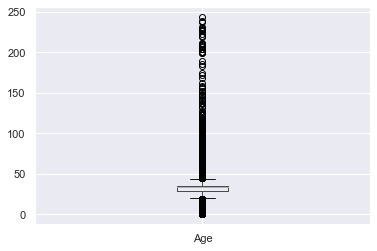

In [52]:
user.boxplot('Age')

### ------------> OBSERVATION
***
As we can see, there are some 0 values for age columns. It's not true for an infant who are 0 year old to read book!! Moreover, are also some values that users are over 100 years old. So I would like to see those impossible values.

> - The user who are 0 year old are impossible so I would like to drop
> - From my personal point of view, the recommender system should better concentrates on the people who are from 5 to 90 years old, since this is the normal range for age.


In [53]:
df_filtered = user[(user["Age"] < 5)|(user["Age"] >= 90)]
print(len(df_filtered)/ len(user) * 100)
df_filtered

0.468924094065214


,User_ID,Age,Country
219,220,0,colombia
469,470,0,usa
561,562,0,albania
612,613,1,turkey
670,671,1,saudi arabia
...,...,...,...
277107,277108,104,switzerland
277503,277504,103,usa
277558,277559,98,usa
277908,277909,2,usa


### ------------> OBSERVATION
***
These values just accounts for just a small amount of number. Moreover, the age of people who are out of the normal range I would like to drop these column.

In [54]:
user.drop(user[(user["Age"] < 5)|(user["Age"] >= 90)].index, inplace = True)

> **Sample Rating Dataset**

In [55]:
# see the static of all numerical column
rating.describe().T

,count,mean,std,min,25%,50%,75%,max
User_ID,1149780.0,140386.395126,80562.277719,2.0,70345.0,141010.0,211028.0,278854.0
Book_Rating,1149780.0,2.866950,3.854184,0.0,0.0,0.0,7.0,10.0


<AxesSubplot:>

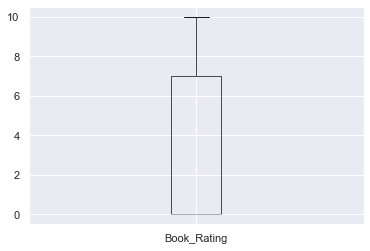

In [56]:
rating.boxplot('Book_Rating')

<a id="2.10"></a>
# 📌 2.10 Age Range
***
> - In the recommendation system, one of the most considerable factor for generating a valuable recommendation is the age. Some of the book that is not for the child who are under 18 should not be recommended to the children. Since then, I want to create a new column which is `Age_Range`.
> - Secondly, the `Age` Column is the ordinal so this column is appropriate to do that.

In [57]:
# create a list of my conditions
conditions = [
    (user['Age'] < 18),
    (user['Age'] >= 18) & (user['Age'] <= 36),
    (user['Age'] > 36) & (user['Age'] <= 40),
    (user['Age'] > 40) & (user['Age'] <= 60),
    (user['Age'] > 60) & (user['Age'] < 90),
    ]

# create a list of the values we want to assign for each condition
values = ['Under 18', '18-36', '36-40', '40-60', '60-90']

# create a new column and use np.select to assign values to it using our lists as arguments
user['Age_Range'] = np.select(conditions, values)

# display updated DataFrame
user.head()

,User_ID,Age,Country,Age_Range
0,1,34,usa,18-36
1,2,18,usa,18-36
2,3,34,russia,18-36
3,4,17,portugal,Under 18
4,5,34,united kingdom,18-36


<a id="2.11"></a>
# ✂ 2.11 Reduce Dimension
***

In this recommender system, we only can handle the explicit feedback (rate value higher than 0) since if we have the  implicit the other factors such as comment is also concerned for a better suggestion. However, having no column for the comment of readers, so that for the popularity recommender, we still keep the implicit feedback, not for the content-based and collaborating filtering method.

> - We want to reduce the number of record by selecting the reader who tend to have more feedback and the number of explicit feedback is higher than the people have not like to give any feedback.

## Select the people rated at least 5 times and less than 5 times

In [58]:
#Take out all the user list
list_of_user = rating['User_ID'].value_counts()
#Take out the list of user have rated at least 5 times
list_of_user_rate_5_times = list_of_user[list_of_user >= 5].index.to_list()

#Query the user have rated at least 5 times
df_user_rate_5_times = rating[rating['User_ID'].isin(list_of_user_rate_5_times)]
#Query the user have not rated at least 5 times
df_user_not_rate_5_times = rating[~rating['User_ID'].isin(list_of_user_rate_5_times)]


## Compare the number of explicit feedback in both group

In [59]:
explicit_feedback_rate_5_time = df_user_rate_5_times[(df_user_rate_5_times['Book_Rating'] != 0)]
print(len(explicit_feedback_rate_5_time))

explicit_feedback_not_rate_5_time = df_user_not_rate_5_times[(df_user_not_rate_5_times['Book_Rating'] != 0)]
print(len(explicit_feedback_not_rate_5_time))

361250
72421


### ------------> OBSERVATION
***
The people have rated at least 5 times have higher number of explicit feedback so I just want to focus on the people have at least 5 rate times and I also want to drop the 0 values.
> - I chose `df_user_rate_5_times` and `explicit_feedback_rate_5_time`.

## Select top 10% most frequently rated books

In [60]:
book_ratings_freq = 0.1
threshold = len(explicit_feedback_rate_5_time['ISBN'].unique()) * book_ratings_freq

top_books_list = explicit_feedback_rate_5_time['ISBN'].value_counts().head(int(threshold)).index.to_list()
explicit_feedback_rate_5_time = explicit_feedback_rate_5_time[explicit_feedback_rate_5_time['ISBN'].isin(top_books_list)]

print('Filter: top %d%% most frequently rated books\nNumber of records: %d' % 
      (book_ratings_freq*100, len(explicit_feedback_rate_5_time)))

Filter: top 10% most frequently rated books
Number of records: 172249


In [61]:
book_ratings_freq = 0.1
threshold = len(df_user_rate_5_times['ISBN'].unique()) * book_ratings_freq

top_books_list = df_user_rate_5_times['ISBN'].value_counts().head(int(threshold)).index.to_list()
df_user_rate_5_times = df_user_rate_5_times[df_user_rate_5_times['ISBN'].isin(top_books_list)]

print('Filter: top %d%% most frequently rated books\nNumber of records: %d' % 
      (book_ratings_freq*100, len(df_user_rate_5_times)))

Filter: top 10% most frequently rated books
Number of records: 569853


<a id="2.12"></a>
# 🗞 2.12 Merge column
***
I want to have a deeper look in the EDA step so I want to merge some the pair dataframe together.
> - First, I'll join the `book` dataframe with the `rating` dataframe on the ISBN field.

<a id="2.12.1"></a>
## ️🎳 2.12.1 Merge book and rating
****

## Merge book and rating

In [62]:
print(f'Book dataframe size: {len(book)}')
print(f'Rating dataframe size: {len(df_user_rate_5_times)}')
book_with_rating = df_user_rate_5_times.join(book.set_index('ISBN'), on='ISBN')
print(f'New dataframe size: {len(book_with_rating)}')

Book dataframe size: 266735
Rating dataframe size: 569853
New dataframe size: 569853


## Merge book and explicit rating

In [63]:
print(f'Book dataframe size: {len(book)}')
print(f'Rating dataframe size: {len(explicit_feedback_rate_5_time)}')
book_with_explicit_rating = explicit_feedback_rate_5_time.join(book.set_index('ISBN'), on='ISBN')
print(f'New dataframe size: {len(book_with_explicit_rating)}')

Book dataframe size: 266735
Rating dataframe size: 172249
New dataframe size: 172249


## Restrict books to a "single ISBN per book"
***
I want the ISBN column is unique since the book may be duplicated so I want to reformat it again in the `Unquie_ISBN` colum.

In [64]:
book_with_rating.groupby(['Book_Title', 'Book_Author']).ISBN.nunique().sort_values(ascending=False)[:10]

Book_Title                                         Book_Author     
The Hitchhiker's Guide to the Galaxy               Douglas Adams       7
Pet Sematary                                       Stephen King        7
Jane Eyre                                          Charlotte Bronte    6
The Golden Compass (His Dark Materials, Book 1)    PHILIP PULLMAN      6
About a Boy                                        Nick Hornby         6
Wuthering Heights                                  Emily Bronte        6
The Drawing of the Three (The Dark Tower, Book 2)  Stephen King        6
Christine                                          Stephen King        6
Carrie                                             Stephen King        6
Wizard and Glass (The Dark Tower, Book 4)          Stephen King        6
Name: ISBN, dtype: int64

In [65]:
multiple_isbns = book_with_rating.groupby(['Book_Title', 'Book_Author']).ISBN.nunique()
multiple_isbns.value_counts()

1    25189
2     1921
3      191
4       45
5        9
6        8
7        2
Name: ISBN, dtype: int64

### ------------> OBSERVATION
***
We can see that the vast majority of books have less only 1 associated ISBN number, however quite a few multiple ISBNs. We want to create a unique_isbn such that a single book will only have 1 identifier when fed to the recommendation model.

> - Let's query some of the example to determine how to deal with them


In [66]:
df_filtered = book_with_rating[(book_with_rating["Book_Title"].isin(["LITTLE WOMEN"]))]
df_filtered

,User_ID,ISBN,Book_Rating,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
14562,2110,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
23923,5543,0671517643,10,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
52522,11676,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
59771,11993,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
70004,14521,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
72307,15408,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
153637,35050,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
161191,35859,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
163405,35979,0671517643,10,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...
196649,43806,0671517643,0,LITTLE WOMEN,Louisa May Alcott,1994.0,Pocket,http://images.amazon.com/images/P/0671517643.0...


### ------------> OBSERVATION
***
According to [What is an ISBN?](https://www.isbn-international.org/content/what-isbn#:~:text=An%20ISBN%20is%20an%20International,digit%20to%20validate%20the%20number.), even books having the same title and was written with the same author still have the different ISBN owing to differents version such as ebook or paperback and many things. However, we want to restrict them with the `Unique_ISBN` column.

In [67]:
has_mult_isbns = multiple_isbns.where(multiple_isbns>1)
has_mult_isbns.dropna(inplace=True) # remove NaNs, which in this case is books with a single ISBN number
print(f'There are {len(has_mult_isbns)} book titles with multiple ISBN numbers which we will try to re-assign to a unique identifier')

There are 2176 book titles with multiple ISBN numbers which we will try to re-assign to a unique identifier


In [68]:
# Create dictionary for books with multiple isbns
# def isbn_dictionary(df):
#     book_title = {}
#     for title in has_mult_isbns.index:
#         isbn_series = df.loc[df.Book_Title==title].ISBN.unique() # returns only the unique ISBNs
#         book_title[title] = isbn_series.tolist()
#     return book_title

# dict_unique_isbn = isbn_dictionary(book_with_explicite_rating)

In [69]:
# As the loop takes a while to run (8 min on the full dataset), pickle this dict for future use
# with open('isbn_dictionary.pickle', 'wb') as handle:
#     pickle.dump(dict_unique_isbn, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [70]:
# LOAD isbn_dict back into namespace
!pip3 install pickle5
import pickle5 as pickle

with open('isbn_dictionary.pickle', 'rb') as handle:
    isbn_dictionary = pickle.load(handle)

In [71]:
# Add 'unique_isbn' column to 'books_with_ratings' dataframe that includes the first ISBN if multiple ISBNS,
# or just the ISBN if only 1 ISBN present anyway.
def unique_ISBN(df):
    df['Unique_ISBN'] = df.apply(lambda row: isbn_dictionary[row.Book_Title][0] if row.Book_Title in isbn_dictionary.keys() else row.ISBN, axis=1)
    return df

book_with_rating = unique_ISBN(book_with_rating)
book_with_explicit_rating = unique_ISBN(book_with_explicit_rating)

<a id="2.12.2"></a>

## ️🎭 2.12.2 Merge user and rating
****

In [72]:
print(f'User dataframe size: {len(user)}')
print(f'Rating dataframe size: {len(df_user_rate_5_times)}')
user_with_rating = df_user_rate_5_times.join(user.set_index('User_ID'), on='User_ID')
print(f'New dataframe size: {len(user_with_rating)}')

User dataframe size: 269775
Rating dataframe size: 569853
New dataframe size: 569853


In [73]:
print(f'User dataframe size: {len(user)}')
print(f'Rating dataframe size: {len(explicit_feedback_rate_5_time)}')
user_with_explicit_rating = explicit_feedback_rate_5_time.join(user.set_index('User_ID'), on='User_ID')
print(f'New dataframe size: {len(user_with_explicit_rating)}')

User dataframe size: 269775
Rating dataframe size: 172249
New dataframe size: 172249


<a id="2.12.3"></a>
## 🎩 2.12.3 Merge `user` and `book_with_rating`
****
## `book_user_rating` dataset:

In [74]:
print(f'Books+Ratings table size: {len(book_with_rating)}')
print(f'Users table size: {len(user)}')
book_user_rating = book_with_rating.join(user.set_index('User_ID'), on='User_ID')
print(f'New "books_users_ratings" table size: {len(book_user_rating)}')

print(f'Before dropping: {len(book_user_rating)}')

book_user_rating.dropna(inplace=True)

print(f'After dropping: {len(book_user_rating)}')


Books+Ratings table size: 569853
Users table size: 269775
New "books_users_ratings" table size: 569853
Before dropping: 569853
After dropping: 521920


## `book_user_explicit_rating` dataset:

In [75]:
print(f'Books+Ratings table size: {len(book_with_explicit_rating)}')
print(f'Users table size: {len(user)}')
book_user_explicit_rating = book_with_explicit_rating.join(user.set_index('User_ID'), on='User_ID')
print(f'New "books_users_ratings" table size: {len(book_user_explicit_rating)}')

print(f'Before dropping: {len(book_user_explicit_rating)}')

book_user_explicit_rating.dropna(inplace=True)

print(f'After dropping: {len(book_user_explicit_rating)}')

#Drop duplicate:
book_user_explicit_rating.drop_duplicates(keep = False, inplace = True)
book_user_explicit_rating.reset_index(level=0, inplace=True)

Books+Ratings table size: 172249
Users table size: 269775
New "books_users_ratings" table size: 172249
Before dropping: 172249
After dropping: 155167


<a id="2.13"></a>
# 📂 2.13 Save the Intermediate data
***
After the cleaning step, all data is saved to a csv file for visualisation step later.

In [76]:
book_user_explicit_rating = book_user_explicit_rating.head(100)

In [83]:
book_user_explicit_rating

,Book_Rating,Book_Title,Book_Author,Publication_year,Publisher,Image_URL,Unique_ISBN,isFavorite,category,isFeature,description
0,9,Little Altars Everywhere,Rebecca Wells,2003.0,HarperTorch,http://images.amazon.com/images/P/0060517794.0...,0060517794,False,Comic,false,Suscipit inceptos est felis purus aenean aliqu...
1,9,Waiting to Exhale,Terry McMillan,1995.0,Pocket,http://images.amazon.com/images/P/0671537458.0...,0671537458,False,Romantic,false,Suscipit inceptos est felis purus aenean aliqu...
2,8,Birdsong: A Novel of Love and War,Sebastian Faulks,1997.0,Vintage Books USA,http://images.amazon.com/images/P/0679776818.0...,0679776818,False,Historic,false,Suscipit inceptos est felis purus aenean aliqu...
3,5,See Jane Run,Joy Fielding,1992.0,Avon,http://images.amazon.com/images/P/0380711524.0...,0380711524,False,Horror,true,Suscipit inceptos est felis purus aenean aliqu...
4,7,Pay Dirt (Mrs. Murphy Mysteries (Paperback)),RITA MAE BROWN,1996.0,Bantam,http://images.amazon.com/images/P/0553572369.0...,0553572369,False,Romantic,true,Suscipit inceptos est felis purus aenean aliqu...
5,10,Adressat unbekannt.,Kathrine Kressmann Taylor,2002.0,Rowohlt Tb.,http://images.amazon.com/images/P/3499230933.0...,3499230933,False,Romantic,false,Suscipit inceptos est felis purus aenean aliqu...
6,6,Artemis Fowl.,Eoin Colfer,2003.0,Ullstein TB-Vlg,http://images.amazon.com/images/P/3548603203.0...,3548603203,False,Comedy,false,Suscipit inceptos est felis purus aenean aliqu...
7,8,El Diaro De Bridget Jones,Helen Fielding,1996.0,Lumen Espana,http://images.amazon.com/images/P/8426449476.0...,8426449476,False,Horror,false,Suscipit inceptos est felis purus aenean aliqu...
8,10,The Boy Next Door,Meggin Cabot,2002.0,Avon Trade,http://images.amazon.com/images/P/0060096195.0...,0060096195,False,Romantic,false,Suscipit inceptos est felis purus aenean aliqu...
9,9,Skin and Other Stories (Now in Speak!),Roald Dahl,2002.0,Puffin Books,http://images.amazon.com/images/P/0141310340.0...,0141310340,False,Horror,true,Suscipit inceptos est felis purus aenean aliqu...


In [78]:
book_user_explicit_rating = book_user_explicit_rating.drop(columns=['index', 'User_ID', 'ISBN', 'Age', 'Country', 'Age_Range'])

In [79]:
book_user_explicit_rating['isFavorite'] = False
book_user_explicit_rating['category'] = False
book_user_explicit_rating['isFeature'] = False
book_user_explicit_rating['description'] = 'Suscipit inceptos est felis purus aenean aliquet adipiscing diam venenatis, augue nibh duis neque aliquam tellus condimentum sagittis vivamus'

In [80]:
book_user_explicit_rating['category'] = book_user_explicit_rating.category.apply(lambda x: np.random.choice(['Comedy', 'Horror', 'Sci-fi',
                                                                                   'Historic', 'Romantic', 'Comic'
                                                                                  ]) ) 

book_user_explicit_rating['isFeature'] = book_user_explicit_rating.category.apply(lambda x: np.random.choice(['true', 'false']) ) 

In [84]:
book_user_explicit_rating.rename(columns={"Unique_ISBN": "ISBN"}, inplace=True)

In [85]:
user.to_csv("Data/Cleaned_Data/user_cleaned.csv", encoding='utf-8', index = False)
book.to_csv("Data/Cleaned_Data/book_cleaned.csv", encoding='utf-8', index = False)
df_user_rate_5_times.to_csv("Data/Cleaned_Data/rating_cleaned.csv", encoding='utf-8', index = False)
# book_user_rating.to_csv("Data/Cleaned_Data/book_user_rating_cleaned.csv", encoding='utf-8')
book_user_explicit_rating.to_csv("Data/Cleaned_Data/book_user_explicit_rating_cleaned.csv", encoding='utf-8', index = False)

In [82]:
stop

NameError: name 'stop' is not defined

<a id="3"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 📊 3. Data exploration (EDA)</strong></h1>

<a id="3.1"></a>
# 3.1 Distribution of Rating
******

In [ ]:
f.plot_density_rating(book_user_explicit_rating)

# Number of each rating in bar plot

In [ ]:
f.plot_number_of_rating_point(book_user_explicit_rating)

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>

<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>

<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li><span style="color:#122ecc;">Rating 8</span> is the most rated value</li>
    <li>Users often tend to give rating for the book that they really like rather than the book that they do not like, so that the rating <span style="color:#122ecc;">from 1 to 4</span> is relatively low</li>
</ul>
</div>




<a id="3.2"></a>
# 3.2 How old are the users?
******

In [ ]:
plt.rcParams['figure.figsize'] = [20, 15]
# Pie chart
labels = ['18-36', '60-90', 'Under 18', '36-40', '40-60']
#colors
colors = ['#94B3FD', '#F9C5D5', '#8FBDD3' ,'#B7CADB', '#D18CE0']
ax = plt.pie(user['Age_Range'].value_counts(), labels=labels, labeldistance=1.15, colors=colors, autopct='%1.1f%%', textprops={'fontsize': 16});
plt.title('Proportion of age of reader', fontsize=30, fontweight = 'bold')
plt.show()

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Suprisingly, most of users are at <span style="color:#122ecc;">18-36 years old</span> 
        with over 72 percent </li>
    <li>In the second place, there are over  <span style="color:#122ecc;">15 percent</span> of the readers are at
         <span style="color:#122ecc;">60-90 years old</span>.</li>
    <li>The readers who are <span style="color:#122ecc;">under 18 is under 5 percent</span>. This group is one of the most considerable group since the content of book must be appropriate for them, but they are just a minor factor in our recommender system</li>
    <li>Both of the group <span style="color:#122ecc;">36-40 and 40-60</span> year-old reader still under 7 percent
    </li>
    <li>Hence, in this book recommender system we should concentrate on the group <span style="color:#122ecc;">18-36 and 60-90</span> year-old readers
    </li>
</ul>
</div>

<a id="3.3"></a>
# 3.3 The 10 country having the highest amount of users:
******

## Just the box plot

In [ ]:
f.plot_box_country(user)

## World map

In [ ]:
f.plot_world_map(user)

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Top 10 countries having the highest readers which are <span style="color:#122ecc;">USA, CANADA, UNITED KINGDOM, GERMANY, SPAIN, AUSTRALIA, ITALY, FRANCE, PORTUGAL, NEW ZEALAND</span>. All of them are the developed countries so that they have more opportunities for their citizens to approach the eBook more straightforwardly.</li>
    <li> <span style="color:#122ecc;">USA</span> has the highest users and the number of user is higher than 7 times compare to other countries </li>
</ul>
</div>

<a id="3.4"></a>
# 3.4 When did these books were published:
******

In [ ]:
my_colors = 'rgbkymc'  #red, green, blue, black, etc.

yr = book_user_explicit_rating.Publication_year.value_counts().sort_index()
# I just want to fill the book that have occured 5 times
yr = yr.where(yr>5)
plt.figure(figsize=(20, 10))
plt.rcParams.update({'font.size': 15}) # Set larger plot font size
plt.bar(yr.index, yr.values, color = ['green'])
plt.xlabel('Year of Publication')
plt.ylabel('counts')
plt.show()

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Most of the book have been released in  <span style="color:#122ecc;">2000s</span> </li>
    <li>Currently, our service is not ideal for people who like to read old book which was published in the <span style="color:#122ecc;">1960s</span> </li>
</ul>
</div>

<a id="3.5"></a>
# 3.5 Average rating and number of ratings of the most popular books:
*****

In [ ]:
df_books_title = book_user_explicit_rating.groupby('Book_Title').agg({'ISBN': 'count', 'Book_Rating': 'mean'}).reset_index()
df_books_title.columns = ['Book_Title', 'count', 'avg_rating']

df_books_title['title_short'] = df_books_title['Book_Title'].apply(f.short_title)


In [ ]:
sns.set_style('white')

titles_top_popular = df_books_title.sort_values('count', ascending=False).head(20)
f.draw_top_chart(titles_top_popular, 'title_short', ['avg_rating', 'count'], 
                 'Average rating and number of ratings of the most popular books')

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>The rating point for popular book is in range around from  <span style="color:#122ecc;">4 to 9</span> </li>
    <li>The <span style="color:#122ecc;">Wild Animus</span> has the lowest rating point</li>
    <li>Three <span style="color:#122ecc;">Harry Potter</span> series has the highest rating point</li>
</ul>
</div>

<a id="3.6"></a>
# 3.6 Average rating and number of ratings of the most popular authors:
*****

In [ ]:
df_books_author = book_user_explicit_rating.groupby('Book_Author').agg({'ISBN': 'count', 'Book_Rating': 'mean'}).reset_index()
df_books_author.columns = ['Author', 'count', 'avg_rating']


authors_top_popular = df_books_author.sort_values('count', ascending=False).head(20)
f.draw_top_chart(authors_top_popular, 'Author', ['avg_rating', 'count'], 'Average rating and number of ratings of the most popular authors')

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>The rating point for popular author is in range around from  <span style="color:#122ecc;">7 to 9</span> </li>
    <li>The <span style="color:#122ecc;">Wild Animus</span> has the lowest rating point so that it is not suprising insight that <span style="color:#122ecc;">Danielle Steel</span> has the lowest rating point</li>
    <li>Three <span style="color:#122ecc;">Harry Potter</span> series has the highest rating point so <span style="color:#122ecc;">J.K. Rowling</span> has the highest rating point</li>
</ul>
</div>

<a id="3.7"></a>
# 3.7 Long Tail Plot:
*****

In [ ]:
recmetrics.long_tail_plot(df=book_user_explicit_rating, 
                          item_id_column="ISBN", 
                          interaction_type="book ratings", 
                          percentage=0.5,
                          x_labels=False)

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Our dataset is suffering the  <span style="color:#122ecc;">Long-tail problem</span> </li>
    <li>Over <span style="color:#122ecc;">88 percentage</span> is in the tail which mean most of them are not popular which leads to a considerable bias in our book recommender system</li>
</ul>
</div>

<a id="3.4"></a>

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=14dpaeXX-ajsM8quwe3dCCdQdrdvf29iI" align="left" hspace="20px" vspace="20px" width="45" height="60" ></p>
<br>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:Yu Mincho Demibold;font-size:40px;font-style: italic;color:  #6468e8">3.4 Summary</li>
</ul>
<ul style="list-style-type:none;font-family:Yu Mincho Demibold;font-size:20px;color:  black">
    <br>
    
*******
    
<li>1. <span style="color:#122ecc;">Rating 8</span> is the most rated value.</li>
<br>
<li>2. Users often tend to give rating for the book that they really like rather than the book that they do not like, so that the rating <span style="color:#122ecc;">from 1 to 4</span> is relatively low.</li>
<br>
<li>3. Suprisingly, most of users are at <span style="color:#122ecc;">18-36 years old</span>with over 72 percent</li>
<br>
<li>4. In the second place, there are over  <span style="color:#122ecc;">15 percent</span> of the readers are at
         <span style="color:#122ecc;">60-90 years old</span>.</li>
<br>
<li>5. The readers who are <span style="color:#122ecc;">under 18 is under 5 percent</span>. This group is one of the most considerable group since the content of book must be appropriate for them, but they are just a minor factor in our recommender system.</li>
<br>
<li>6. Both of the group <span style="color:#122ecc;">36-40 and 40-60</span> year-old reader still under 7 percent</li>
<br>    
<li>7. Hence, in this book recommender system we should concentrate on the group <span style="color:#122ecc;">18-36 and 60-90</span> year-old readers.</li>
<br>    
<li>8. Top 10 countries having the highest readers which are <span style="color:#122ecc;">USA, CANADA, UNITED KINGDOM, GERMANY, SPAIN, AUSTRALIA, ITALY, FRANCE, PORTUGAL, NEW ZEALAND</span>.</li>
<br>    
<li>9. <span style="color:#122ecc;">USA</span> has the highest users and the number of user is higher than 7 times compare to other countries.</li>
<br>
<li>10. Most of the book have been released in  <span style="color:#122ecc;">2000s</span>.</li>
<br>    
<li>11. Currently, our service is not ideal for people who like to read old book which was published in the <span style="color:#122ecc;">1960s</span>.</li>
<br>    
<li>12. The rating point for popular book is in range around from  <span style="color:#122ecc;">4 to 9</span> </li>
<br> 
<li>13. The <span style="color:#122ecc;">Wild Animus</span> has the lowest rating point.</li>
<br>     
<li>14. Three <span style="color:#122ecc;">Harry Potter</span> series has the highest rating point.</li>
<br>     
<li>15. The rating point for popular author is in range around from  <span style="color:#122ecc;">7 to 9</span> .</li>
<br>     
<li>16. The <span style="color:#122ecc;">Danielle Steel</span> has the lowest rating point.</li>
<br>     
<li>17. Three <span style="color:#122ecc;">J.K. Rowling</span> has the highest rating point.</li>
<br>
<li>18. Over <span style="color:#122ecc;">88 percentage</span> is in the tail which mean most of them are not popular which leads to a considerable bias in our book recommender system</li>
<br>      
</ul>